## ReLeaSE: Generating Focused Molecule Libraries for Drug Discovery with Recurrent Neural Networks

ABSTRACT: In de novo drug design, computational strategies are used to generate
novel molecules with good affinity to the desired biological target. In this work, we
show that recurrent neural networks can be trained as generative models for
molecular structures, similar to statistical language models in natural language
processing. We demonstrate that the properties of the generated molecules correlate
very well with the properties of the molecules used to train the model. In order to
enrich libraries with molecules active toward a given biological target, we propose to
fine-tune the model with small sets of molecules, which are known to be active
against that target. Against Staphylococcus aureus, the model reproduced 14% of 6051 hold-out test molecules that medicinal
chemists designed, whereas against Plasmodium falciparum (Malaria), it reproduced 28% of 1240 test molecules. When coupled
with a scoring function, our model can perform the complete de novo drug design cycle to generate large sets of novel molecules
for drug discovery.

Link to paper: https://pubs.acs.org/doi/pdf/10.1021/acscentsci.7b00512

Credit: https://github.com/isayev/ReLeaSE

Google Colab: https://colab.research.google.com/drive/1_gcffP-iud6YAiBqugpxzysXWyfBr9Lr?usp=sharing

In [1]:
# Clone the repository and cd into directory
!git clone https://github.com/isayev/ReLeaSE.git
%cd ReLeaSE

Cloning into 'ReLeaSE'...
remote: Enumerating objects: 545, done.
remote: Total 545 (delta 0), reused 0 (delta 0), pack-reused 545
Receiving objects: 100% (545/545), 449.75 MiB | 10.09 MiB/s, done.
Resolving deltas: 100% (264/264), done.
Updating files: 100% (29/29), done.
/Users/saams4u/chemlabs/playground/ReLeaSE


In [ ]:
# Install pip dependencies
!pip install -r pip_requirements.txt

# Install PyTorch, mordred, and TensorFlow
!pip install torch==1.8.0 mordred tensorflow==1.15.0

# Install RDKit
!pip install rdkit-pypi==2021.3.1.5

### JAK2 activity optimization with ReLeaSE algorithm

In this experiment we will optimized parameters of pretrained generative RNN to produce molecules with maximized and minimized pIC50 for JAK2. We use policy gradient algorithm with custom reward function to bias the properties of generated molecules aka Reinforcement Learninf for Structural Evolution (ReLeaSE) as was proposed in Popova, M., Isayev, O., & Tropsha, A. (2018). Deep reinforcement learning for de novo drug design. Science advances, 4(7), eaap7885.


#### Imports

In [4]:
%env CUDA_VISIBLE_DEVICES=0

%reload_ext autoreload
%autoreload 2

import sys

sys.path.append('./release/')

import torch
import torch.nn as nn
from torch.optim.lr_scheduler import ExponentialLR, StepLR
import torch.nn.functional as F

use_cuda = torch.cuda.is_available()

import numpy as np
from tqdm import tqdm, trange
import pickle

from rdkit import Chem, DataStructs
from stackRNN import StackAugmentedRNN
from data import GeneratorData
from utils import canonical_smiles

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns

env: CUDA_VISIBLE_DEVICES=0


#### Setting up the generator 

##### Loading data for the generator

In [5]:
gen_data_path = './data/chembl_22_clean_1576904_sorted_std_final.smi'

In [6]:
tokens = ['<', '>', '#', '%', ')', '(', '+', '-', '/', '.', '1', '0', '3', '2', '5', '4', '7',
          '6', '9', '8', '=', 'A', '@', 'C', 'B', 'F', 'I', 'H', 'O', 'N', 'P', 'S', '[', ']',
          '\\', 'c', 'e', 'i', 'l', 'o', 'n', 'p', 's', 'r', '\n']

In [7]:
gen_data = GeneratorData(training_data_path=gen_data_path, delimiter='\t', 
                         cols_to_read=[0], keep_header=True, tokens=tokens)

#### Util functions

<code>plot_hist</code> function plots histogram of predicted properties and a vertical line for thershold.

In [8]:
def plot_hist(prediction, n_to_generate):
    print("Mean value of predictions:", prediction.mean())
    print("Proportion of valid SMILES:", len(prediction)/n_to_generate)
    ax = sns.kdeplot(prediction, shade=True)
    ax.set(xlabel='Predicted pIC50', 
           title='Distribution of predicted pIC50 for generated molecules')
    plt.show()

<code>estimate_and_update</code> function:

1. generates <code>n_to_generate</code> number of SMILES strings

2. filters invalid SMILES

3. predicts pIC50 for valid SMILES

4. plots histogram of predicted pIC50

5. Returns valid SMILES and their predicted pIC50s

In [9]:
def estimate_and_update(generator, predictor, n_to_generate, **kwargs):
    generated = []
    pbar = tqdm(range(n_to_generate))
    for i in pbar:
        pbar.set_description("Generating molecules...")
        generated.append(generator.evaluate(gen_data, predict_len=120)[1:-1])

    sanitized = canonical_smiles(generated, sanitize=False, throw_warning=False)[:-1]
    unique_smiles = list(np.unique(sanitized))[1:]
    smiles, prediction, nan_smiles = predictor.predict(unique_smiles, get_features=get_fp)  
                                                       
    plot_hist(prediction, n_to_generate)
        
    return smiles, prediction

#### Initializing and training the generator

We will used stack augmented generative GRU as a generator. The model was trained to predict the next symbol from SMILES alphabet using the already generated prefix. Model was trained to minimize the cross-entropy loss between predicted symbol and ground truth symbol. Scheme of the generator when inferring new SMILES is shown below:

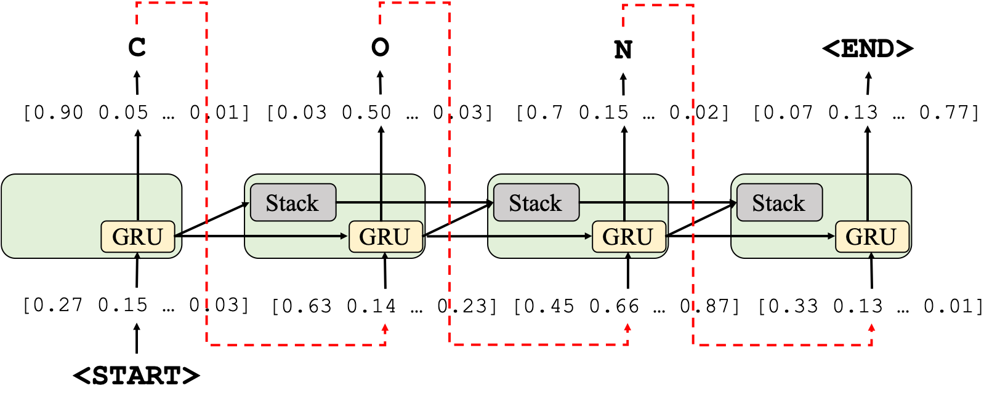

Initialize stack-augmented generative RNN:

In [10]:
hidden_size = 1500
stack_width = 1500
stack_depth = 200
layer_type = 'GRU'

lr = 0.001
optimizer_instance = torch.optim.Adadelta

my_generator = StackAugmentedRNN(input_size=gen_data.n_characters, hidden_size=hidden_size,
                                 output_size=gen_data.n_characters, layer_type=layer_type,
                                 n_layers=1, is_bidirectional=False, has_stack=True,
                                 stack_width=stack_width, stack_depth=stack_depth, 
                                 use_cuda=use_cuda, 
                                 optimizer_instance=optimizer_instance, lr=lr)

If you want train the model from scratch, uncomment the lines below:

In [11]:
#losses = my_generator.fit(gen_data, 1500000)
#plt.plot(losses)

#my_generator.evaluate(gen_data)
#my_generator.save_model(model_path)

In [12]:
model_path = './checkpoints/generator/checkpoint_biggest_rnn'

Alternatively, you can skip the process of training and load the pretrained parameters into the model:

In [13]:
my_generator.load_model(model_path)

#### Setting up the predictor

For this demo we will use Random Forest predictor instead of Recurrent Neural Network, since the availability of the dataset with JAK2 activity data used in the "Deep Reinforcement Learning for de novo Drug Design" paper is restricted under the license agreement. Here instead we use the JAK2 activity data downladed from ChEMBL. The size of this dataset is ~2000 data points, which is not enough to build a reliable deep neural network. Is you want to see a demo with RNN, please checkout logP optimization demo.

In [15]:
from data import PredictorData
from utils import get_desc, get_fp
from mordred import Calculator, descriptors

In [16]:
calc = Calculator(descriptors, ignore_3D=True)

In [17]:
pred_data = PredictorData(path='./data/jak2_data.csv', get_features=get_fp)

In [18]:
from predictor import VanillaQSAR
from sklearn.ensemble import RandomForestRegressor as RFR

/usr/local/lib/python3.7/dist-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


In [19]:
model_instance = RFR
model_params = {'n_estimators': 250, 'n_jobs': 10}

In [20]:
my_predictor = VanillaQSAR(model_instance=model_instance,
                           model_params=model_params,
                           model_type='regressor')

In [21]:
my_predictor.fit_model(pred_data, cv_split='random')

([0.7000854023094396,
  0.6650531438643921,
  0.6645450421827435,
  0.6556932001456889,
  0.7191877940134255],
 'R^2 score')

Here we produce the unbiased distribution of the property:

Generating molecules...: 100%|██████████| 10000/10000 [09:47<00:00, 17.02it/s]


Mean value of predictions: 6.549202310891071
Proportion of valid SMILES: 0.6289


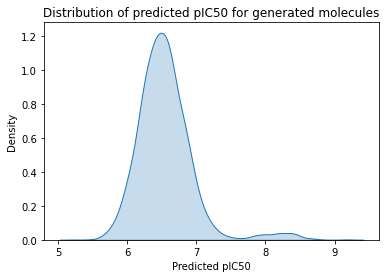

In [22]:
smiles_unbiased, prediction_unbiased = estimate_and_update(my_generator,
                                                           my_predictor,
                                                           n_to_generate=10000)

#### Biasing the distribution of the generator with reinforcement learning (policy gradient)

We combine the generator and the predictor into a single pipeline. The generator produces new SMILES string, which is then evaluated by the predictor. Based on the obtain prediction and our goal, we assign a numerical reward value and update the parameters of the generator using policy gradient algorithm.

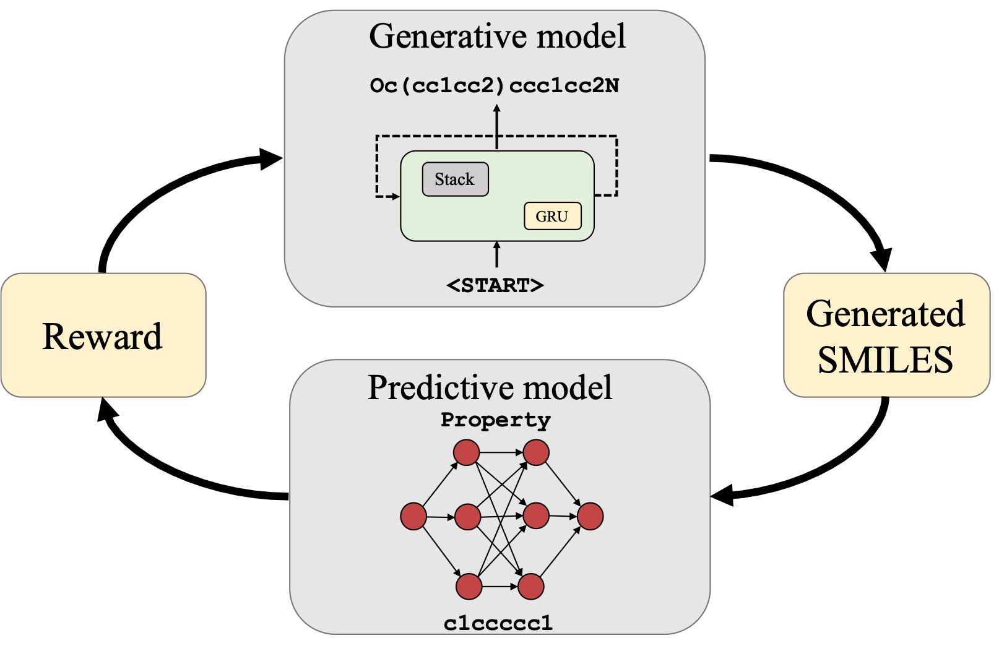

Policy gradient loss is defined as:$$
L(S|\theta) = -\dfrac{1}{n}\sum_{i=1}^{|S|} \sum_{j=1}^{length(s_i)} R_i\cdot \gamma^i \cdot \log p(s_i|s_0 \dots s_{i-1}\theta),
$$

where $R_i$ is the reward obtained at time step $i$ $\gamma$ is the discount factor and $p(s_i|s_0 \dots s_{i-1}, \theta)$ is the probability of the next character given the prefix, which we obtain from the generator.

In our case the reward is the same for every time step and is equal to the reward for the whole molecule. Discount factor $\gamma$ is a number close to $1.0$ (it could be $1.0$).

##### Maximizing pIC50 for JAK2

In [23]:
from reinforcement import Reinforcement

Making a copy of the generator that will be optimized

In [24]:
my_generator_max = StackAugmentedRNN(input_size=gen_data.n_characters, 
                                     hidden_size=hidden_size,
                                     output_size=gen_data.n_characters, 
                                     layer_type=layer_type,
                                     n_layers=1, is_bidirectional=False, has_stack=True,
                                     stack_width=stack_width, stack_depth=stack_depth, 
                                     use_cuda=use_cuda, 
                                     optimizer_instance=optimizer_instance, lr=lr)

my_generator_max.load_model(model_path)

In [25]:
# Setting up some parameters for the experiment
n_to_generate = 200
n_policy_replay = 10
n_policy = 15
n_iterations = 100

In [26]:
def simple_moving_average(previous_values, new_value, ma_window_size=10):
    value_ma = np.sum(previous_values[-(ma_window_size-1):]) + new_value
    value_ma = value_ma/(len(previous_values[-(ma_window_size-1):]) + 1)
    return value_ma

In [27]:
def get_reward_max(smiles, predictor, invalid_reward=0.0, get_features=get_fp):
    mol, prop, nan_smiles = predictor.predict([smiles], get_features=get_features)
    if len(nan_smiles) == 1:
        return invalid_reward
    return np.exp(prop[0]/3)

The reward function we will use here is$$
R(s) = \exp(\dfrac{predictor(s)}{3}) 
$$

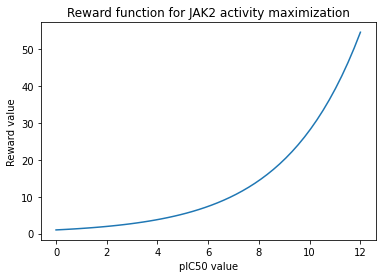

In [28]:
x = np.linspace(0, 12)
y = np.exp(x/3)

plt.plot(x, y)

plt.xlabel('pIC50 value')
plt.ylabel('Reward value')

plt.title('Reward function for JAK2 activity maximization')
plt.show()

In [29]:
RL_max = Reinforcement(my_generator_max, my_predictor, get_reward_max)

In [30]:
rewards_max = []
rl_losses_max = []

Policy gradient...: 100%|██████████| 15/15 [01:53<00:00,  7.55s/it]


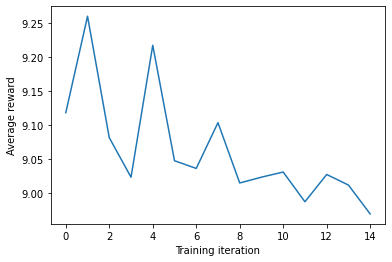

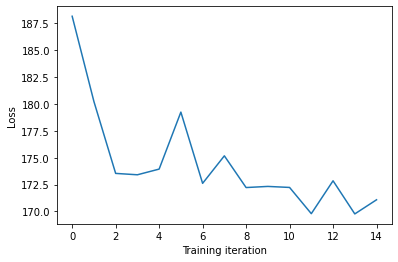

Generating molecules...: 100%|██████████| 200/200 [00:11<00:00, 17.18it/s]


Mean value of predictions: 6.576388096553028
Proportion of valid SMILES: 0.65


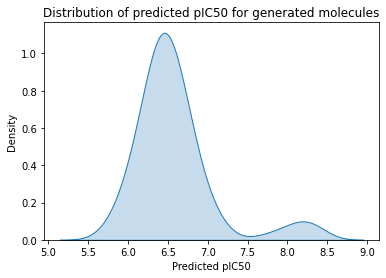

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C
C=C1OC(COC)C(n2cnc3cc(Cl)ccc32)C1C(=O)O
C=CC1(O)C(C)(C)CC2(C=O)OCOC2OC1(C)O
CC(=NCCc1c[nH]c2ccccc12)C(=O)O
CC(=O)NC1C(O)CC(=O)NC(Cc2ccccc2)C(=O)NC(C(C)C)C1OC(C)=O


Policy gradient...: 100%|██████████| 15/15 [01:51<00:00,  7.43s/it]


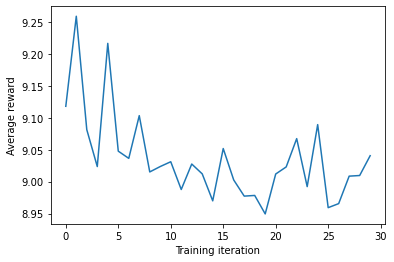

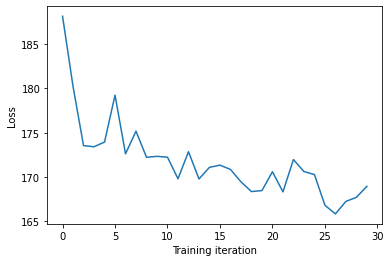

Generating molecules...: 100%|██████████| 200/200 [00:11<00:00, 17.19it/s]


Mean value of predictions: 6.535097844647979
Proportion of valid SMILES: 0.71


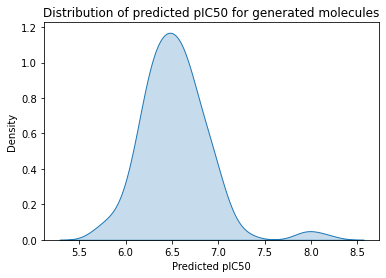

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C=CCCC1NC(=O)NC1=O)C(=O)c1ccc(C)cc1Cl
C=CC(=O)OC1C2CCC(C2)C(NCc2cccc(OC)c2O)C(O)C1O
CC(=O)OC1CC(C)C(C(O)CC2CCC(C)(C)C2)CC(O)CCCCC(C)CCC2(C)C1CC1=C(C)CCCC2(C)C1
CC(=O)Oc1cccc2c1C(=O)N=C2
CC(C)C(NC(=O)C(Cc1c[nH]c2ccccc12)NC=O)S(=O)(=O)c1ccccc1


Policy gradient...: 100%|██████████| 15/15 [01:50<00:00,  7.40s/it]


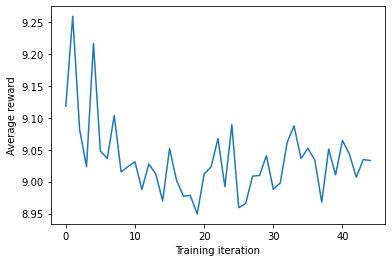

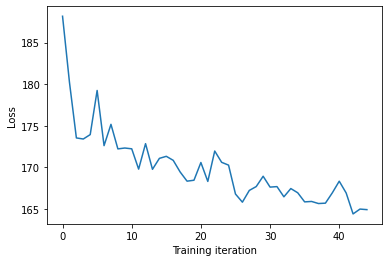

Generating molecules...: 100%|██████████| 200/200 [00:11<00:00, 17.31it/s]


Mean value of predictions: 6.4710281005460075
Proportion of valid SMILES: 0.625


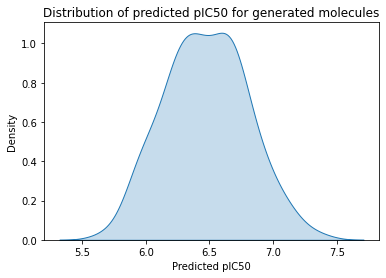

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)C1=C(C)C(=O)N(S(=O)(=O)N2c3ccccc3CCC2C)Cc2ccc1cc2
CC(=O)N1CCC2(CC1)OCOC2c1cnccc1OCF
CC(=O)N1CCN(C(C)Cn2nnc3c(C)ncnc32)CC1
CC(=O)Nc1cc(N2CCCC2)ccc1-c1ccc(S(=O)(=O)Nc2ccc(F)cc2)cc1
CC(=O)Nc1ccc(C#CC(=O)NCCCC(C)COc2cccc3cc(N)ccc23)cc1


Policy gradient...: 100%|██████████| 15/15 [01:49<00:00,  7.32s/it]


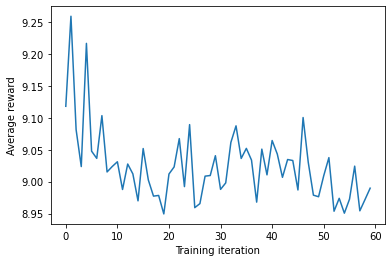

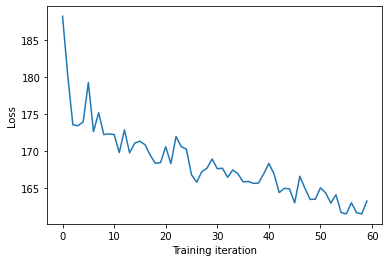

Generating molecules...: 100%|██████████| 200/200 [00:11<00:00, 17.63it/s]


Mean value of predictions: 6.534061850193306
Proportion of valid SMILES: 0.635


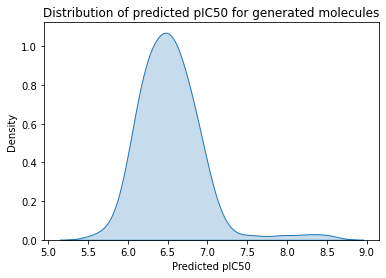

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C
C=CCn1nc(-c2ccc[nH]2)cc1NC(=O)OC1CC1
CC#CCC(=Cc1ccccc1OC)c1ccc(C(=O)NCC(=O)NC(C)(C)C)cn1
CC(=O)NC1CCCN1S(=O)(=O)c1cc(C)nn1-c1ccccc1
CC(=O)NS(=O)(=O)c1ccc(N(C)C)cc1


Policy gradient...: 100%|██████████| 15/15 [01:49<00:00,  7.32s/it]


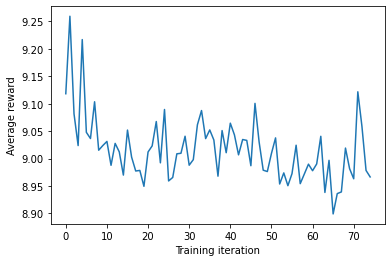

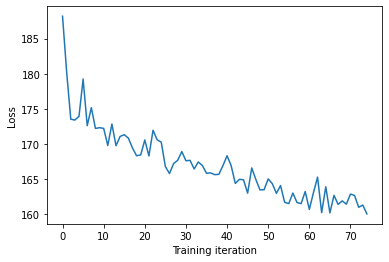

Generating molecules...: 100%|██████████| 200/200 [00:11<00:00, 17.93it/s]


Mean value of predictions: 6.567921824083054
Proportion of valid SMILES: 0.71


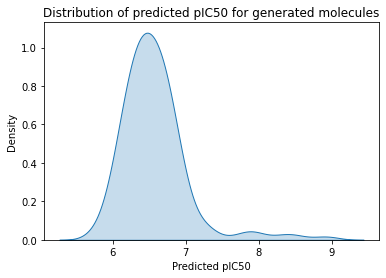

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C)CNc1ccc(N(C(C)=O)c2ccc(C)cc2)cc1
C=C(COc1ccccc1C(=O)NCc1cccs1)C(=O)O
C=CCCCOc1ccc(Nc2c(C(F)(F)F)cnc3cc(NC(C)C)c(OCC)cc23)cc1
CC(=O)N1N=C(c2ccccc2)CC1c1ccc(Cl)cc1
CC(=O)NC1CN2CCC1C2


Policy gradient...: 100%|██████████| 15/15 [01:50<00:00,  7.39s/it]


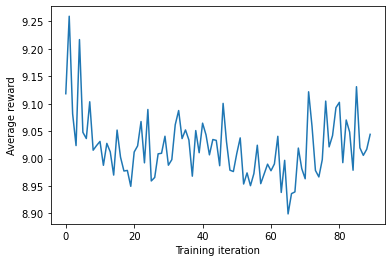

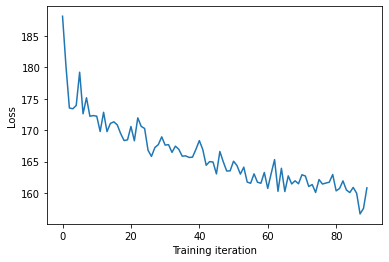

Generating molecules...: 100%|██████████| 200/200 [00:11<00:00, 18.09it/s]


Mean value of predictions: 6.5567268031368355
Proportion of valid SMILES: 0.715


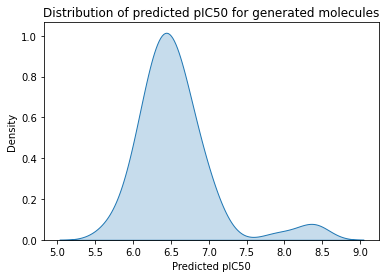

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C
C=CC(O)C1OC(c2ccccc2)C(=O)s1
C=CCCC1N=C(SC)C(=O)CC1=O
CBCC1=C(O)C(=O)OC2C(C)C(=O)N2C1=O
CC(=NNC(=S)Nc1ccccc1C)C(=O)Nc1ccc(Cl)cc1


Policy gradient...: 100%|██████████| 15/15 [01:50<00:00,  7.34s/it]


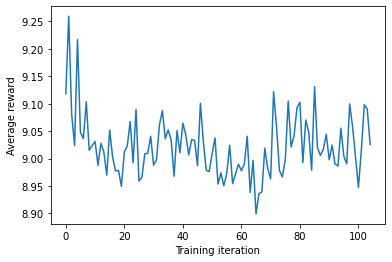

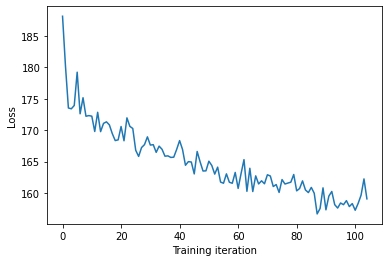

Generating molecules...: 100%|██████████| 200/200 [00:11<00:00, 17.60it/s]


Mean value of predictions: 6.484337618215001
Proportion of valid SMILES: 0.745


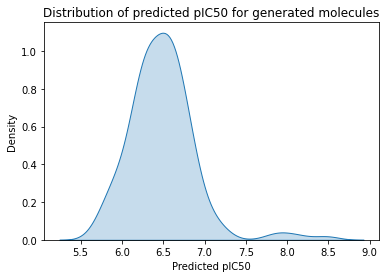

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#CC1=C(O)C(=O)C(OC)C(OC(=O)CCCCCC(=O)O)C(OC(C)=O)C(O)C(C)=CC=C(C)C=C1
C=C(C)NC(Cc1ccc(O)cc1)C(=O)NC(CCCCCC)C(=O)NC(C(=O)C(O)c1ccccc1)C(C)C
C=C1CCC2(C)C(CC3CCCC3)C(C)(CC=C(C)CCC=C(C)C)C2C(C)C1CCC
C=CC(CO)NC(=O)C(NC(=O)C(Cc1ccccc1)NCC=O)NC1=NS(=O)(=O)c2ccccc21
C=CC1=NNC(=NCC(=O)Nc2cccnc2)N1


Policy gradient...: 100%|██████████| 15/15 [01:50<00:00,  7.34s/it]


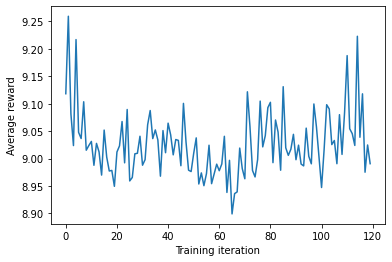

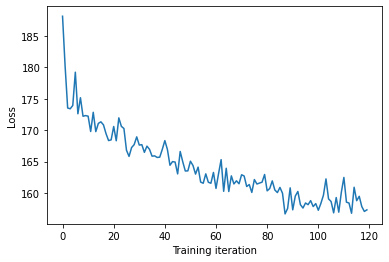

Generating molecules...: 100%|██████████| 200/200 [00:10<00:00, 18.26it/s]


Mean value of predictions: 6.556391813526744
Proportion of valid SMILES: 0.725


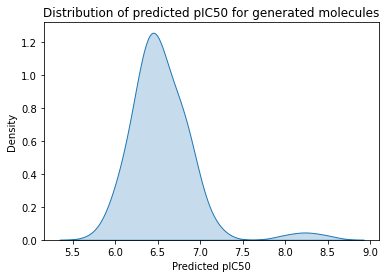

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#[N+]CCCCCCCCCCCC
C1=C(C2CNCCc3ccccc32)CCCN1
C=CC(CC(C)C)OC(=O)CCCCC(O)C(CC)C(C)O
C=CCN1C(=O)c2cc(NC(=O)c3ccccc3)ccc2C(=O)N1C
C=CCN1C=C(C)C(=O)N=C1NCCCCCC


Policy gradient...: 100%|██████████| 15/15 [01:48<00:00,  7.26s/it]


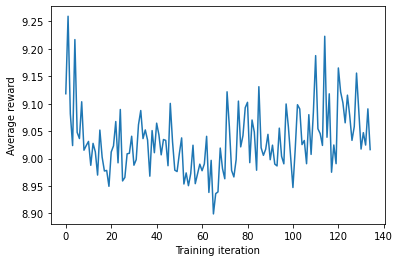

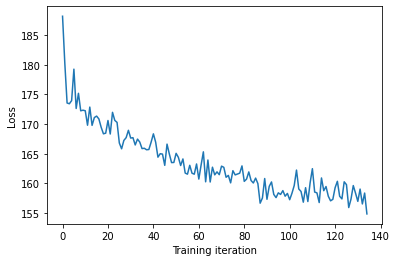

Generating molecules...: 100%|██████████| 200/200 [00:10<00:00, 18.30it/s]


Mean value of predictions: 6.491431120057024
Proportion of valid SMILES: 0.755


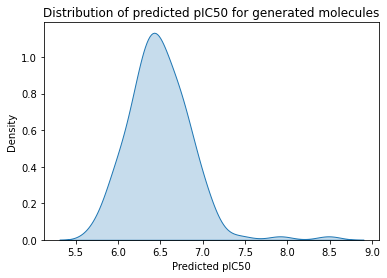

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCNC(=O)CSc1ncc(Cl)n1C
CC(=O)Nc1cc2c(cc1C1CC1)N=C(O)N(CC(=O)NCCc1ccc(Cl)cc1)C2=O
CC(=O)Nc1ccc(Cl)cc1C(=O)N1CCCC1CNC(CCN)C(=O)NC(Cc1ccccc1)C(N)=O
CC(=O)Ns1CCC(NC(=O)c2ccc3ccccc3c2)C1
CC(=O)c1c(C)oc2c1C(=O)c1ccccc1-2


Policy gradient...: 100%|██████████| 15/15 [01:48<00:00,  7.26s/it]


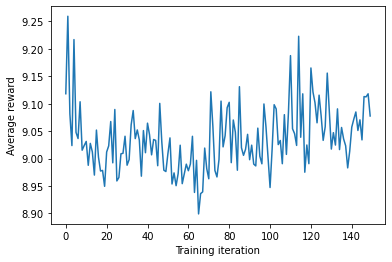

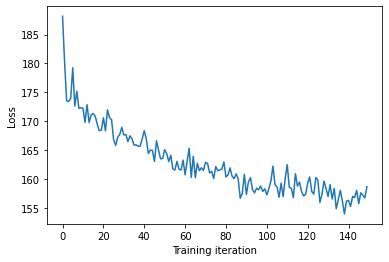

Generating molecules...: 100%|██████████| 200/200 [00:11<00:00, 17.59it/s]


Mean value of predictions: 6.571896800008384
Proportion of valid SMILES: 0.775


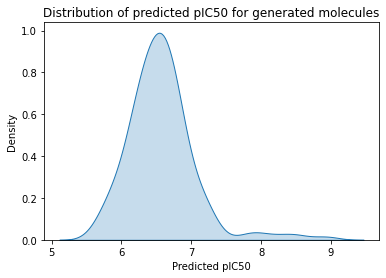

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#CCCN1CCN(Cc2ccc(C(=O)NCC3CCCCC3)cc2)OCCOC1
C#CCN(CC1OC(n2cnc3c(N)nc(N)nc32)C(O)C1O)C(C)C(CC(=O)O)OCC
C=CC(=O)OCC1COC(CCCCCCCCCCC)C(OCc2ccccc2)O1
C=CCc1c(O)cc(NC(C)C)cc1OC
C=CCn1c(C)nc(C)c1CCOc1ccc(C2CC(O)CS2)cc1


Policy gradient...: 100%|██████████| 15/15 [01:49<00:00,  7.28s/it]


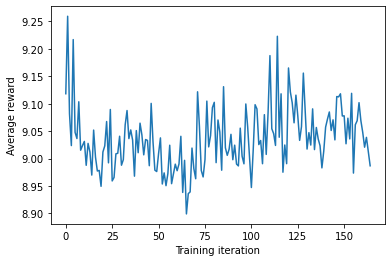

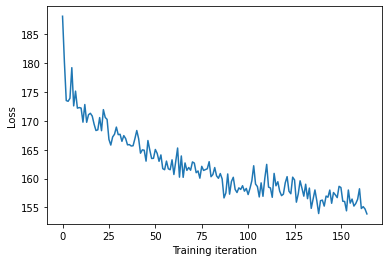

Generating molecules...: 100%|██████████| 200/200 [00:11<00:00, 17.50it/s]


Mean value of predictions: 6.5309203230524915
Proportion of valid SMILES: 0.735


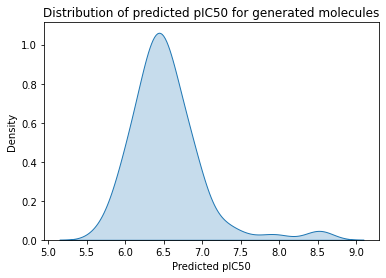

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCN(CCCC)CN1CC=CCC1
C=CCN(Cc1ccc(-c2ccccc2)cc1)C(=O)c1ccccc1F
C=CCNC(=O)CSC1=C(SC)C(=O)N(C)N1C
CC(=O)N(Cc1cccc(N)c1)C[SH]1CCCC1=O
CC(=O)N1CCN(C(=O)c2ccc(CCc3ccc(C(=O)O)cc3)nc2)CC1


Policy gradient...: 100%|██████████| 15/15 [01:50<00:00,  7.38s/it]


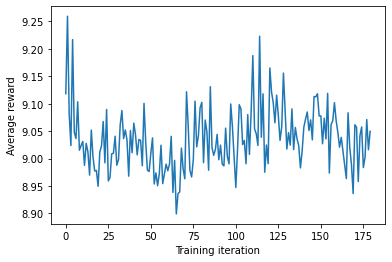

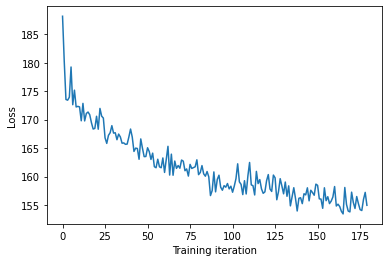

Generating molecules...: 100%|██████████| 200/200 [00:10<00:00, 18.86it/s]


Mean value of predictions: 6.549647605089704
Proportion of valid SMILES: 0.72


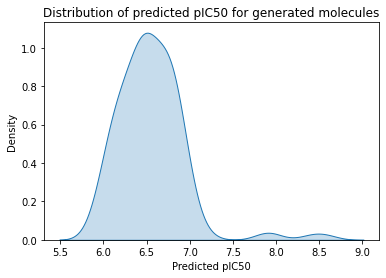

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#CCOc1cc(C)cc(S(=O)(=O)N2CCCCC2)c1
C=C(C(=O)NC(CCCCCCCCC)C(=O)O)C(C)CCCC(O)(CCCCNC)NC(=O)OC(C)(C)C
C=CC#Cc1ccccc1
C=CCOC(=O)C1C(=O)NC(=N)C(=O)N1C(=O)Oc1ccc(C)cc1
CC(=O)N1CCCC1C(=O)NCc1cccnc1


Policy gradient...: 100%|██████████| 15/15 [01:47<00:00,  7.16s/it]


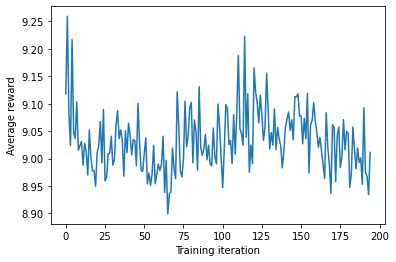

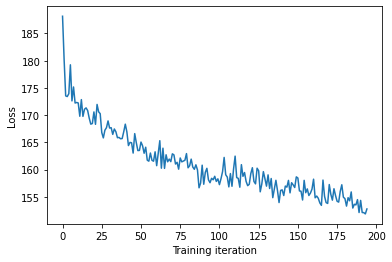

Generating molecules...: 100%|██████████| 200/200 [00:10<00:00, 18.34it/s]


Mean value of predictions: 6.503994775972269
Proportion of valid SMILES: 0.725


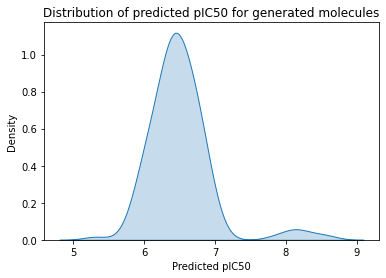

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#CCCN1C(=O)C(=O)C=C(Nc2ccc(C(=O)O)cc2)C1=O
C=C(C)CC(C)(O)CNC(=O)c1cc(C2CC2)no1
C=CCCNC1C2OC(C3CC1C(C)(COC(=O)NCCCCC)O3)C(N(C)C)OC2C
CC(=O)N1CCC(c2ccc(C)c(S(=O)(=O)N3CCC(F)(F)C3)c2)CC1
CC(=O)NC1C(=O)N(C(C)C(=O)NCCC(C)C)CC1Cc1ccccc1


Policy gradient...: 100%|██████████| 15/15 [01:47<00:00,  7.18s/it]


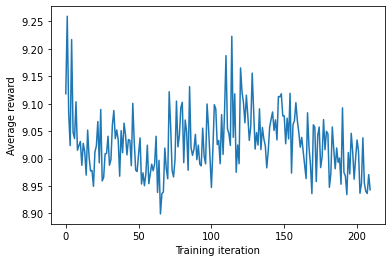

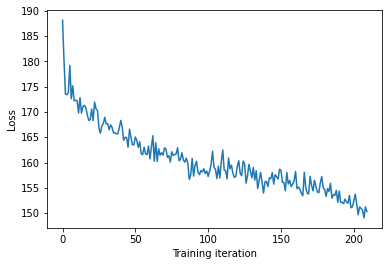

Generating molecules...: 100%|██████████| 200/200 [00:10<00:00, 19.05it/s]


Mean value of predictions: 6.513506724825236
Proportion of valid SMILES: 0.765


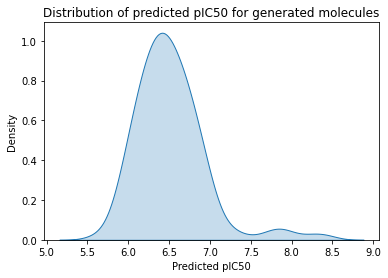

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#CCOC(=O)c1cscn1
C(=NNc1ccccc1)Nc1cccnc1
C=C(C)C(=O)OC(C=CC(=O)O)C=Cc1ccc(OC)c(O)c1
C=CC(=O)SCC(=O)Nc1ccc(N(CC=CC(C)=O)CCC)cc1
CC(=O)N(C(=O)c1ccccc1)c1ccc2ccccc2n1


Policy gradient...: 100%|██████████| 15/15 [02:40<00:00, 10.70s/it]


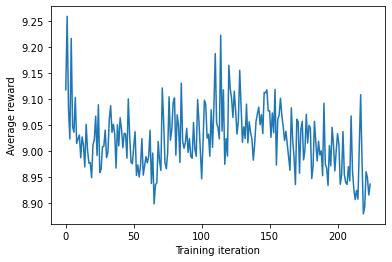

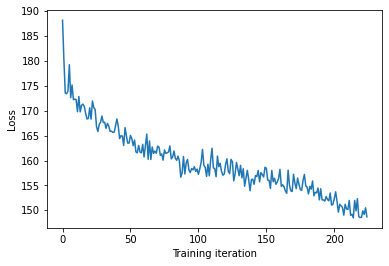

Generating molecules...: 100%|██████████| 200/200 [00:40<00:00,  4.97it/s]


Mean value of predictions: 6.534083169430365
Proportion of valid SMILES: 0.715


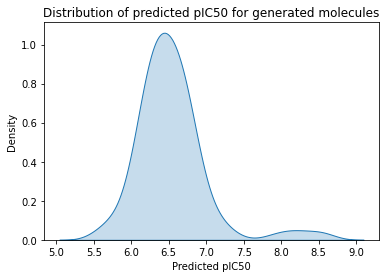

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCN(CCC)CCSc1ccccc1
C=CCN1C(=O)c2ccc(-c3cccc(C(=O)O)c3)cc2SC1=NN=Cc1ccc2ccccc2c1
CC(=O)N(Cc1ccc(C(F)(F)F)cc1)C(=O)C12CC3CCC1CC(C3)NN2
CC(=O)N1CCN(c2nc3c(c(SCCN(C)C)n2)OC(C)(C)C3)CC1
CC(=O)Nc1ccc(C(=O)N2CCN(c3ccccc3)CC2)cc1


Policy gradient...: 100%|██████████| 15/15 [02:35<00:00, 10.39s/it]


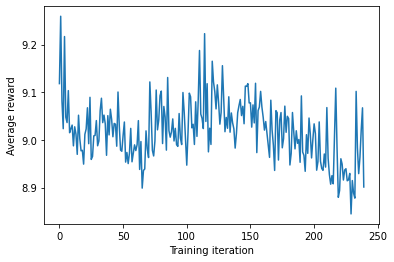

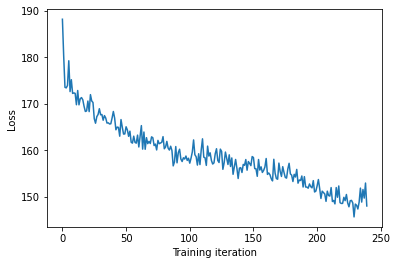

Generating molecules...: 100%|██████████| 200/200 [00:40<00:00,  4.99it/s]


Mean value of predictions: 6.4546461343568176
Proportion of valid SMILES: 0.72


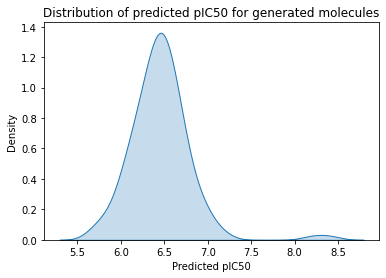

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#CCOc1cc2c(cc1Cl)C(=O)C(C(=O)NC(CN)CCCNC(N)=O)=CO2
C=C(CCCCC)COC1C(C=CC(=O)O)OC2OC(C)C(O)C2OC1OC(C)=O
C=C1CCC2c3ccccc3C1OC2CCCC
CC#Cc1c2c(cNc3ncsc3C(N)=C2C)CN1CC
CC(=O)C1(O)C=CCC2C(=O)C(C)C1CCC1C(C)C(=O)CC(C)=CC21C


Policy gradient...: 100%|██████████| 15/15 [02:35<00:00, 10.37s/it]


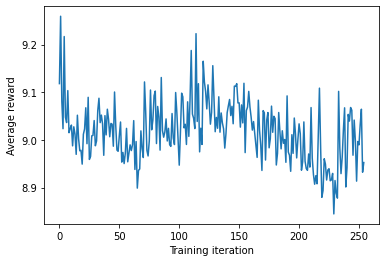

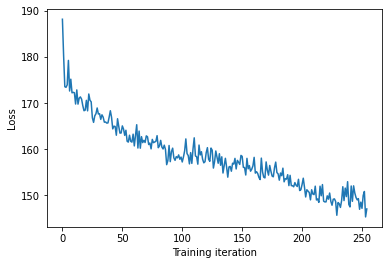

Generating molecules...: 100%|██████████| 200/200 [00:40<00:00,  4.97it/s]


Mean value of predictions: 6.537351614021053
Proportion of valid SMILES: 0.77


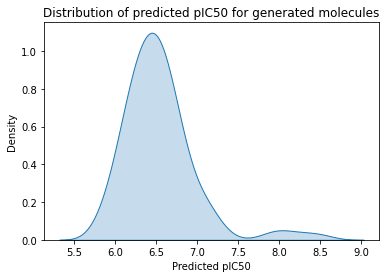

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CC(=CC(=O)C(C)(O)C1=C(O)C(=O)OCC=C1C)OC
C=CCN(C)CCCCCCCCCCCCC
CC(=NNC(N)=O)c1ccccc1
CC(=O)C1(C)CCC2CC(C)C(O)C21
CC(=O)N1NC(=O)N(C)c2nc(SC(C)C)c(C(C)(C)C)nc21


Policy gradient...: 100%|██████████| 15/15 [02:36<00:00, 10.45s/it]


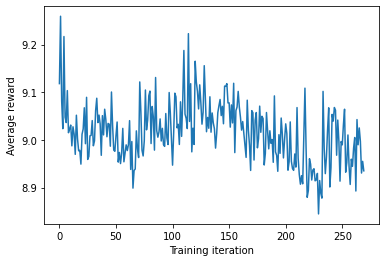

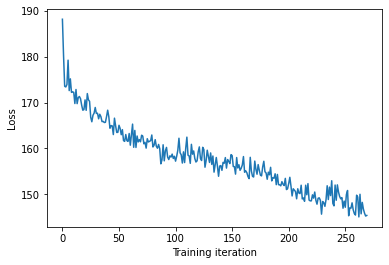

Generating molecules...: 100%|██████████| 200/200 [00:40<00:00,  4.97it/s]


Mean value of predictions: 6.526293561887319
Proportion of valid SMILES: 0.805


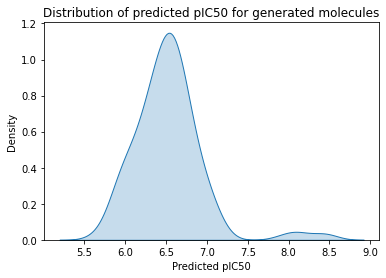

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CC(=C)NC12C(NC(C)=O)CC3OC(OC)(C=C(C)OC31)C2CCC=CCCCCCCCCCO
C=CCCN(CC(O)c1cc(C2CC2)c2ccccc2c1)C(=O)OCC
C=CCN(C)CCOC(C)C
C=CCN1c2cccnc2OCC1C(=O)N(C)CC
CC(=O)C1=CN(Sc2ccc(C(F)(F)F)cc2)C(=O)c2ccccc21


Policy gradient...: 100%|██████████| 15/15 [02:36<00:00, 10.42s/it]


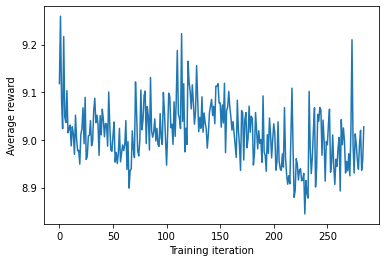

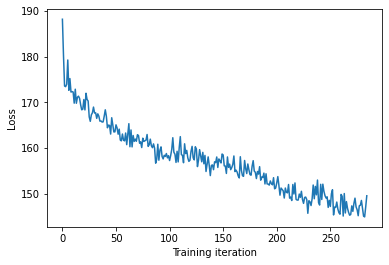

Generating molecules...: 100%|██████████| 200/200 [00:40<00:00,  4.99it/s]


Mean value of predictions: 6.577784571028193
Proportion of valid SMILES: 0.77


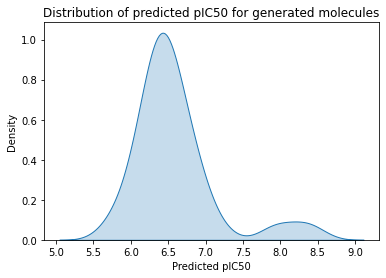

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C1=C(c2ccccc2)c2nc(-c3ccccc3)ncc2C(CCN2CCNCC2)N1
C=CC(=O)CC1CC(C)(C)C(=CC(=O)O)O1
C=CCN1CCN(C(=O)OCC#CCCCOc2ccccc2)CC1
CC(=NNc1cccc(C(F)(F)F)c1)C(C)(C)C
CC(=O)N1CCC(CN(C)C(=O)c2cnn(C)c2)c2ccc(S(=O)(=O)N3CCOCC3)cc21


Policy gradient...: 100%|██████████| 15/15 [02:31<00:00, 10.07s/it]


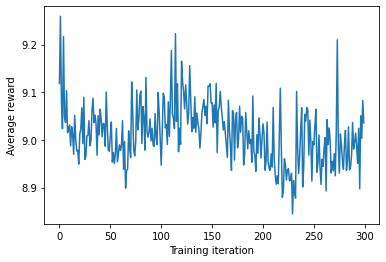

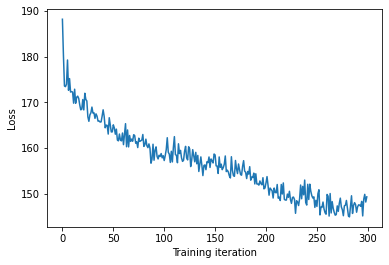

Generating molecules...: 100%|██████████| 200/200 [00:40<00:00,  4.93it/s]


Mean value of predictions: 6.548318600000935
Proportion of valid SMILES: 0.765


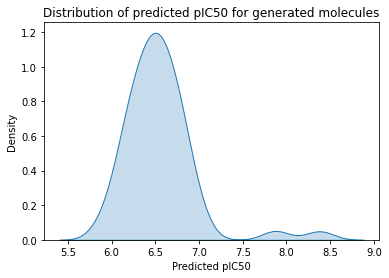

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C)OC(=O)NCCCCCC(=CCOC(CCCCCCCCCCCCCCCCC)c1ccccc1)CO
C=C(CN1C(=O)C(C#N)=C(c2cccc(OCC)c2)C1=O)c1ccccc1
C=CC(=O)OC1C(OC(C)=O)CCC(C)CC=CC2(COC2)CSC1(C)C
C=CCc1ccc(C)c(C(=O)NCCCCCCC(=O)O)c1
CC(=NNC(=O)CCSC1=NC(=O)NC1=O)C(=O)NC1CCN(CC(C)C)CC1


Policy gradient...: 100%|██████████| 15/15 [02:34<00:00, 10.30s/it]


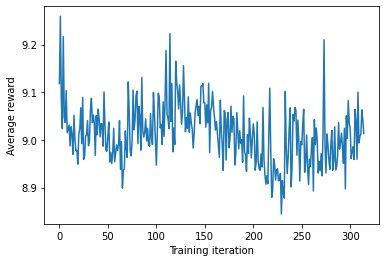

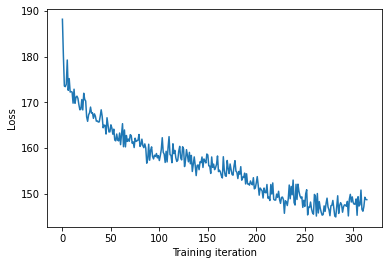

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.00it/s]


Mean value of predictions: 6.478419375967641
Proportion of valid SMILES: 0.785


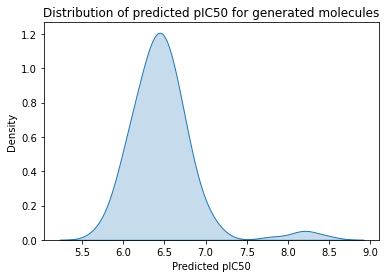

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C(C)C)C1(C)CCC(NC(=O)CN2C(=O)c3ccccc3C2=O)OC1CO
C=C(N)NCCCC(NC(=O)NC(C)(C)C)C(=O)NC(COc1ccccc1)C(C)C
C=C1CCC2(C)C(C)CCN2C1
CC(=NC(NC(=N)c1ccccc1)c1ccccc1)C(=O)NCc1ccc(Cl)c(Cl)c1
CC(=O)N1CCCCC1CC(C)N1C=CC(C)(C)N(C#N)C1=O


Policy gradient...: 100%|██████████| 15/15 [02:35<00:00, 10.37s/it]


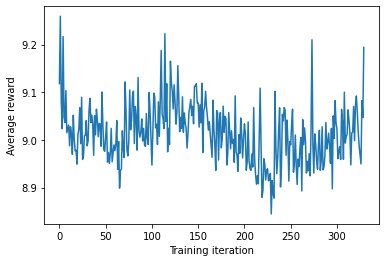

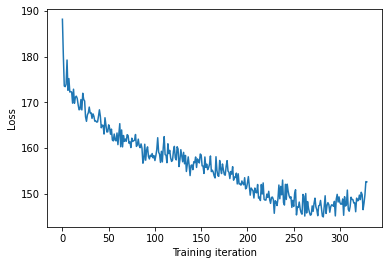

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.10it/s]


Mean value of predictions: 6.617616466971304
Proportion of valid SMILES: 0.84


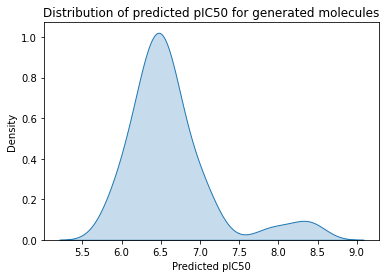

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#CCOC1CCCN(C(=O)c2ccccc2O)C1
C=C(CCc1ccccc1)CCC(C)C
C=C1C(=O)C(c2ccccc2)C(=O)N1c1ccc(OC)cc1
C=CCn1c(C(=O)N2CCN(CCCCCN(CC)CC)CC2)cc2c1CN(C(=O)CF)CC2
CC(=O)NC(=O)C(NC1(C)C(=O)NC1=O)C(C(=O)N1CCN(C(C)=O)CC1)c1ccccc1


Policy gradient...: 100%|██████████| 15/15 [02:35<00:00, 10.37s/it]


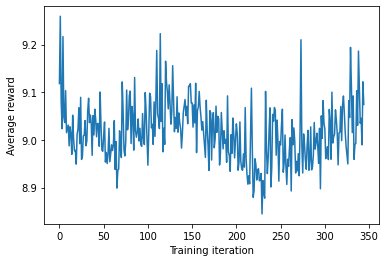

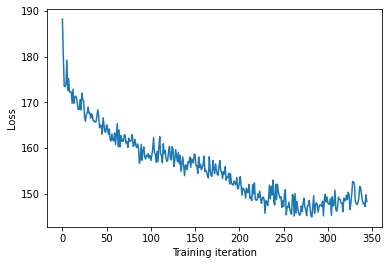

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.02it/s]


Mean value of predictions: 6.532724000149499
Proportion of valid SMILES: 0.815


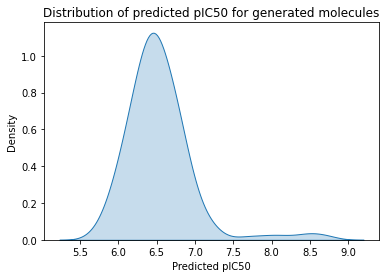

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCC1C(C(=O)Nc2ccc(S(N)(=O)=O)cc2)=CON1CC
C=CCN(CC1=C(O)C(=O)OC1=O)CC1CCN(C(N)=O)CC1
C=CCc1ccccc1OC1OC(CO)C(O)C1O
CC(=O)N(C)c1ccccc1C(=O)NNC(=O)CN1CCCCN(Cc2ccccc2)CC1
CC(=O)N(Cc1ccccc1)C(=O)CCN1CCc2cc(S(=O)(=O)N3CCC3)ccc2C1=O


Policy gradient...: 100%|██████████| 15/15 [02:36<00:00, 10.43s/it]


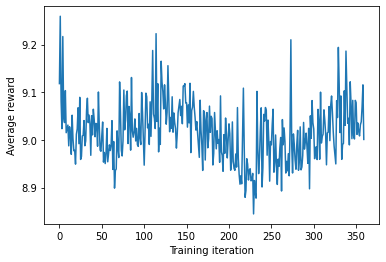

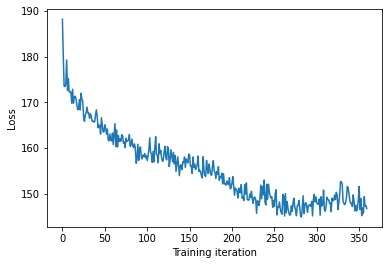

Generating molecules...: 100%|██████████| 200/200 [00:40<00:00,  4.94it/s]


Mean value of predictions: 6.509995029278015
Proportion of valid SMILES: 0.81


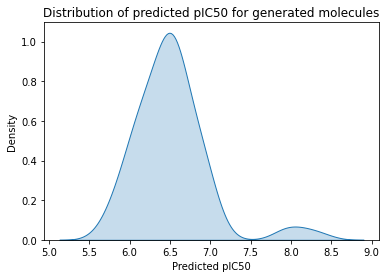

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
Brc1ccc(-c2nn(Cc3ccccc3)cc2N2CCCC2)cc1
C1CCC(n2nnnc2CN2CCOCC2)CC1
C=CCNc1cccc2c[nH]c(c1)C2=O
CC(=O)NC1CCC(CN2CCNC(=O)C2)c2ccccc21
CC(=O)Nc1cc(C)ccc1OC(C)CO


Policy gradient...: 100%|██████████| 15/15 [02:37<00:00, 10.48s/it]


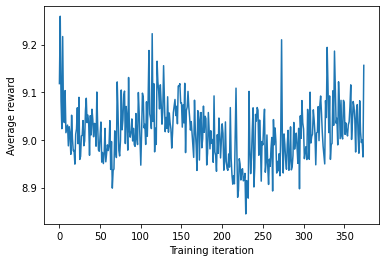

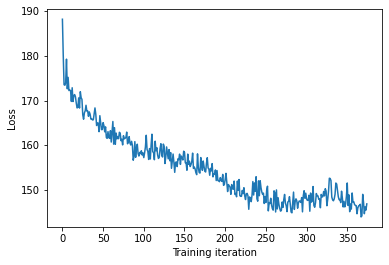

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.02it/s]


Mean value of predictions: 6.5529741587113035
Proportion of valid SMILES: 0.785


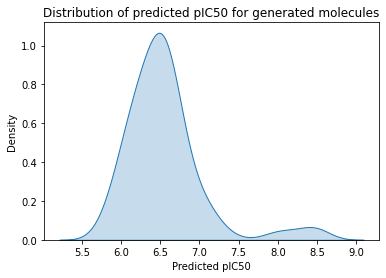

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C(=C1OCCO1)c1ccc2c(c1)CN(CC1CCNC1)CC2
C=CC(O)C(O)CCC(C)C(C)CCCCCC(C)C1CCC2C(CC(C)=CCO1)C1C(C)(O)CC(O)C(O)C2C1(C)C
C=CC(O)CC(OC)C(F)(F)C(F)(F)F
C=CCCCC(=O)n1c2ccccc2c2ccccc21
C=CCNC(=O)C=Cc1ccc(NC(=O)OC2CCN(Cc3ccccc3)CC2)c(OC)c1


Policy gradient...: 100%|██████████| 15/15 [02:31<00:00, 10.08s/it]


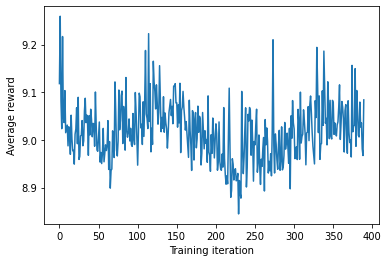

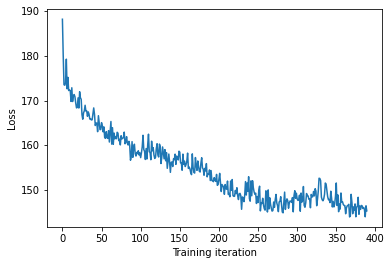

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.06it/s]


Mean value of predictions: 6.570814078941743
Proportion of valid SMILES: 0.81


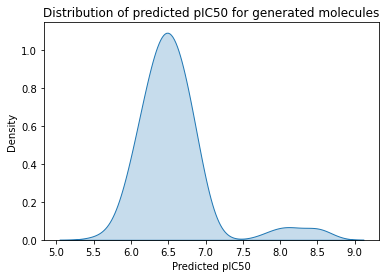

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#Cc1cc(C)c(C)c(C(O)CNCc2ccccc2OC)c1
C=C(C)CCCC=CCC(C)CCC=C(C)CCCC(C)CCC(C)C(=O)OC
C=CC(=NN(CC)CC)c1ccc(OC)cc1
C=CC(C)c1cccc(Cl)c1Cl
C=CCNC(=O)c1ccccc1CN1CCCCC1


Policy gradient...: 100%|██████████| 15/15 [01:50<00:00,  7.40s/it]


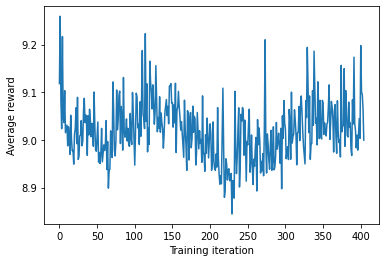

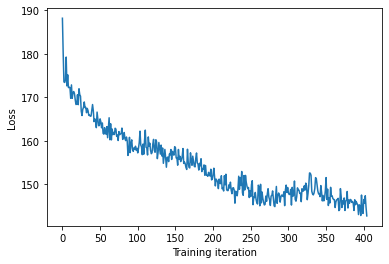

Generating molecules...: 100%|██████████| 200/200 [00:40<00:00,  4.99it/s]


Mean value of predictions: 6.573345112777306
Proportion of valid SMILES: 0.815


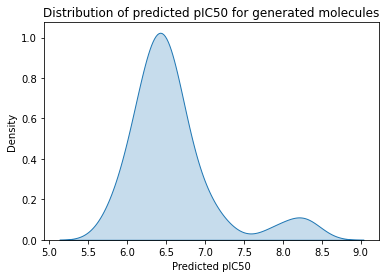

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CC(=O)Nc1ccc2c(c1)sC2CC
C=CCN(C(=O)O)C(=O)NC(CC(C)C)C(=O)NC1CCCC1
CC(=O)C1=CN(C(=O)NCc2cccc(C)c2)n2cc(O)cc2C1=O
CC(=O)C=Cc1ccc(OCCN2CCN(S(C)(=O)=O)CC2C)cc1
CC(=O)NNC(=O)c1cccc(C)c1C


Policy gradient...: 100%|██████████| 15/15 [02:34<00:00, 10.32s/it]


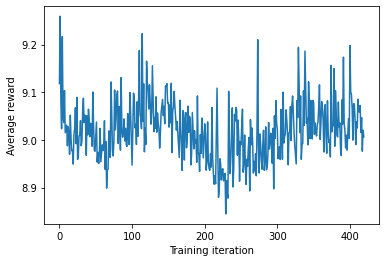

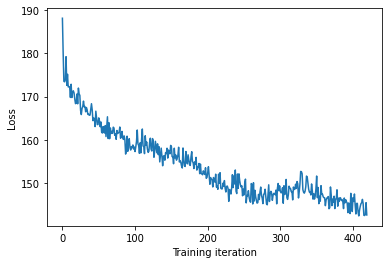

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.00it/s]


Mean value of predictions: 6.594028656165853
Proportion of valid SMILES: 0.785


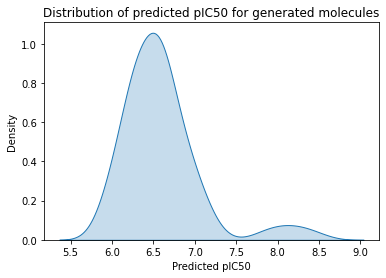

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CC(C1CC2CCCC2(C)C1=O)N(CC)CC
C=CCC1C(CNC(=O)COC(=O)CC)=C(c2ccccc2OC)c2ccccc21
C=CCSC1C(=O)C=CC(=O)N1N
CC(=Cc1ccc(N2CCOCC2)cc1)CCNC(=O)COC(=O)CNC(=O)OCc1ccccc1
CC(=O)C1=C(Nc2ccncc2)c2cc(Cl)ccc2NC1=O


Policy gradient...: 100%|██████████| 15/15 [02:17<00:00,  9.14s/it]


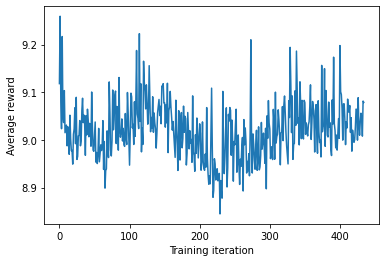

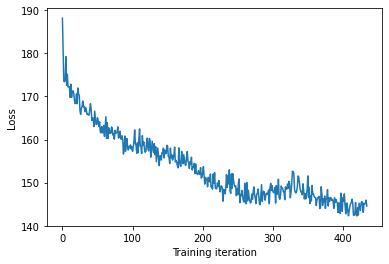

Generating molecules...: 100%|██████████| 200/200 [00:10<00:00, 19.23it/s]


Mean value of predictions: 6.489123757762578
Proportion of valid SMILES: 0.785


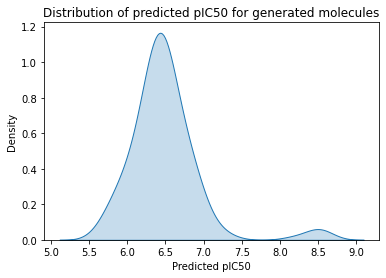

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCNC(=O)C1=CNCCC1
C=CCNC(=O)c1ccccc1CN1CCC(C(=O)Nc2ccccc2)CC1
CC(=O)NC(C)c1ccccc1C
CC(=O)NC1CCC(C)OC1=O
CC(=O)Nc1ccc(Cl)c(C(=O)NNC(=O)CN(C)C)c1


Policy gradient...: 100%|██████████| 15/15 [02:15<00:00,  9.06s/it]


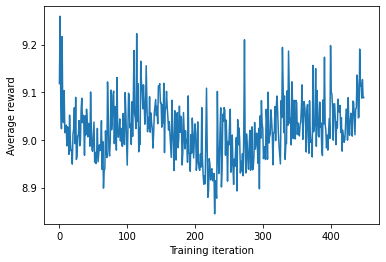

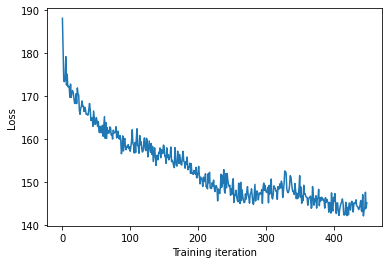

Generating molecules...: 100%|██████████| 200/200 [00:40<00:00,  5.00it/s]


Mean value of predictions: 6.563435562500543
Proportion of valid SMILES: 0.85


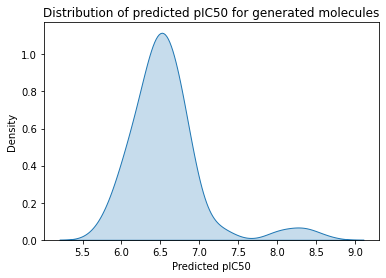

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
Brc1ccccc1-c1cccs1
C=C(C)NC(=O)c1ccccc1CC12CC3CC(CC(C3)C1)C2
C=CCN1C(=O)C2=C(C)NC(=CC(=O)C(C(=O)OC)=C1C)c1ccccc12
C=CCN1CCC(CC)CN1c1ccc2c(nc3ccc(C1=O)C3=O)C(C)=NNC2=O
C=CCOC(=O)CCC(=O)OCC


Policy gradient...: 100%|██████████| 15/15 [02:32<00:00, 10.15s/it]


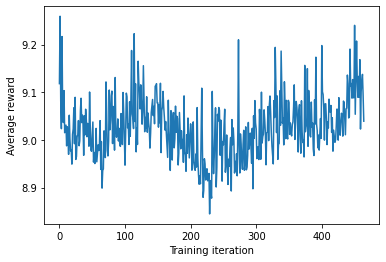

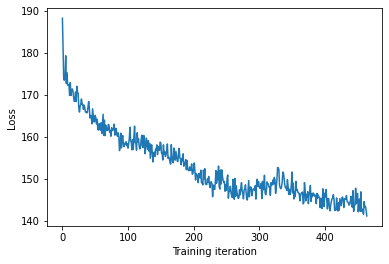

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.04it/s]


Mean value of predictions: 6.553789377102188
Proportion of valid SMILES: 0.815


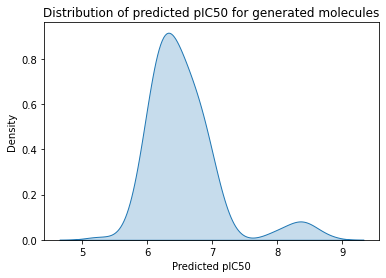

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C)Cs1c(Cl)cc(C(=O)Nc2ccccc2)cc1OC
C=CC(=O)Oc1ccc(N(CCCC)CCNC(C)=O)cc1
C=CCN1CCC(C)C1c1ccc(OC)cc1
CC(=NCCCN1C(=O)CSC1=Nc1ccccc1)c1cccc(C)c1
CC(=O)C(CC(C)C)NC(=O)Nc1cn(C2(C)CC2)nc1-c1cccnc1


Policy gradient...: 100%|██████████| 15/15 [02:32<00:00, 10.19s/it]


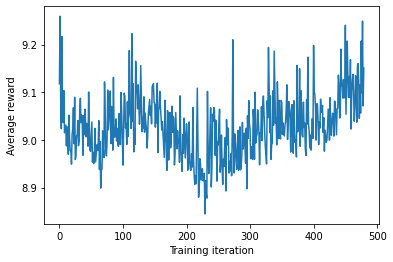

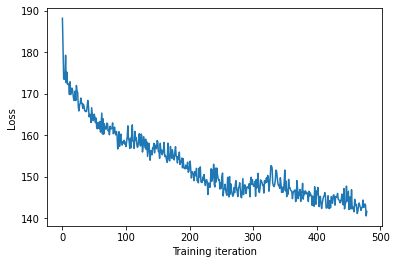

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.04it/s]


Mean value of predictions: 6.648473167999423
Proportion of valid SMILES: 0.84


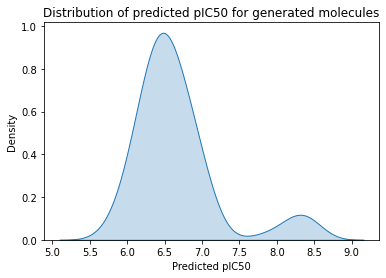

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C1CCN(C2CCNCC2)CC1
C=CC1SC(=O)N(CC(C)C)C1=O
C=CCCCN1CCN(c2cccc(C(C)=O)c2)CC1
C=NN=C1NN=C(CC)S1
CC(=O)C1(C)Oc2ccccc2C2Oc3ncccc3C21N


Policy gradient...: 100%|██████████| 15/15 [02:29<00:00,  9.98s/it]


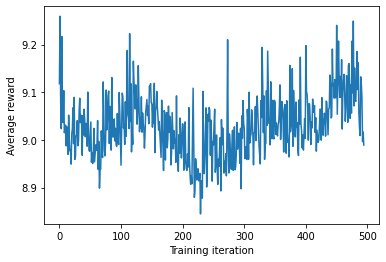

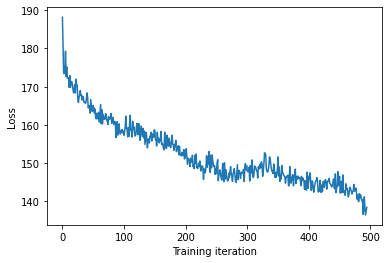

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.10it/s]


Mean value of predictions: 6.5226877689575895
Proportion of valid SMILES: 0.805


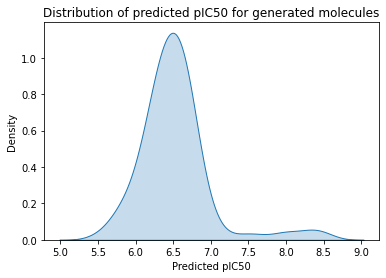

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(CC)SC1=C(O)C(=O)N(C)c2cc3c(nc21)NC(=O)CC3
C=CC(=O)NCC(O)CC(=O)N1CCCCCC1
C=CCC1=CN(CC(=O)OCc2ccc(C)cc2C)C1=O
C=CCCCCCCOc1ccc(CC=C(C)C)cc1
C=CCNCCC(=O)c1ccccc1


Policy gradient...: 100%|██████████| 15/15 [01:45<00:00,  7.00s/it]


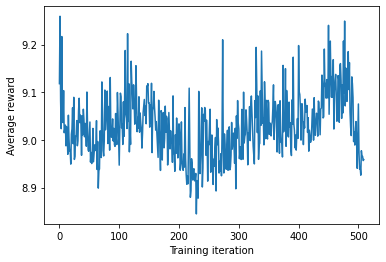

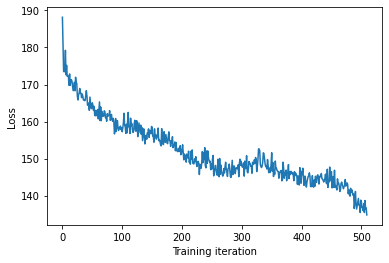

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.11it/s]


Mean value of predictions: 6.541220497945187
Proportion of valid SMILES: 0.85


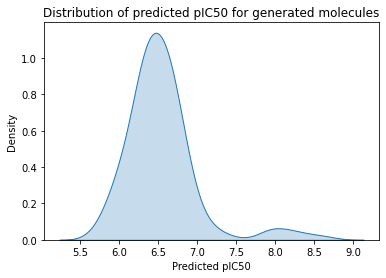

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#CC=COc1ccccc1
C=CCNC(=O)c1cnn2c(N(=O)=O)cccc12
CC(=O)C(C)NC(=S)NC(C)C
CC(=O)N1CCC(C2=NN(C)C(=O)c3ccccc32)CC1
CC(=O)NN(CC(=O)Nc1cccc(C(F)(F)F)c1)C(CO)CC1CC1


Policy gradient...: 100%|██████████| 15/15 [02:33<00:00, 10.23s/it]


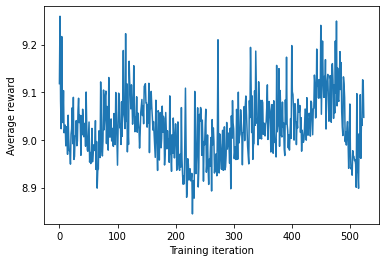

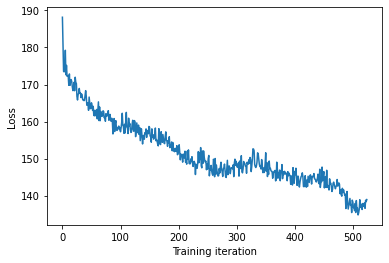

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.13it/s]


Mean value of predictions: 6.633965685072988
Proportion of valid SMILES: 0.825


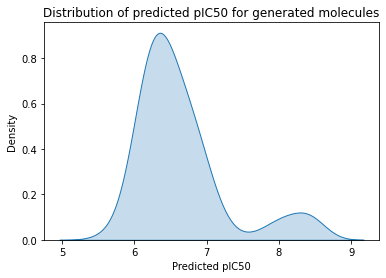

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C
C=C(C)CCC=C(C)CCC=C(C)CCC=C(C)C
C=CC(=O)N1CCN(c2ccc(CC)cc2N(C)C)CC1
C=CCNc1ccnc2ccccc12
CC(=N)Nc1cccc(Cl)c1


Policy gradient...: 100%|██████████| 15/15 [02:13<00:00,  8.87s/it]


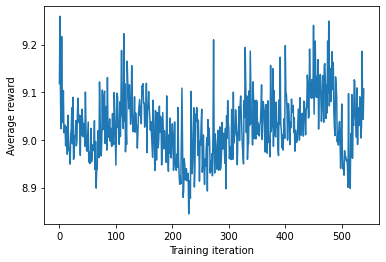

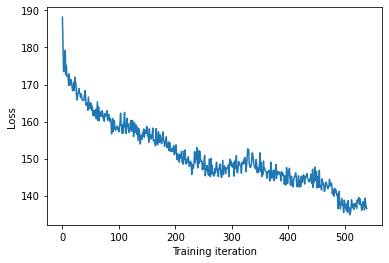

Generating molecules...: 100%|██████████| 200/200 [00:09<00:00, 20.84it/s]


Mean value of predictions: 6.539481143123757
Proportion of valid SMILES: 0.88


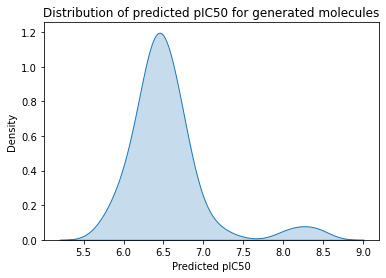

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C
C=CCN(CCOC)Cc1ccccc1
C=CCN1C(=O)NC2CCCC1C(C(=O)O)NC(=O)CCC(NC(=O)C1CCCCC1)C2=O
C=CCNC(C)CCCCC
C=CCNc1cccc(S(=O)(=O)C2=CN(CC)C2=O)c1


Policy gradient...: 100%|██████████| 15/15 [02:31<00:00, 10.11s/it]


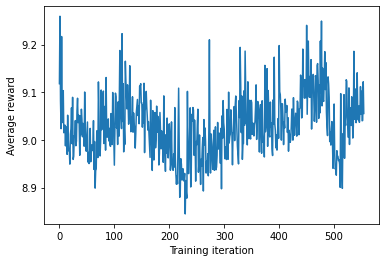

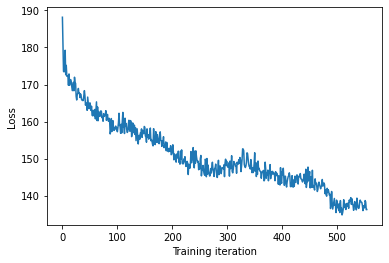

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.09it/s]


Mean value of predictions: 6.631907054515315
Proportion of valid SMILES: 0.88


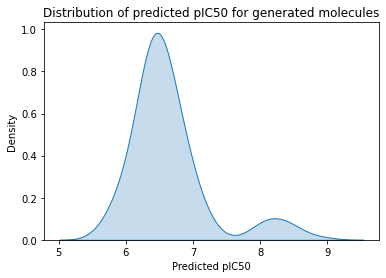

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#CCN1CC=CC(=O)N1N=Cc1cc(N(=O)=O)ncc1C
C=C1CCCC(O)=C(C(=O)Nc2ccc3c(c2)C(=O)N(CC)C(=O)N3C(=O)OC)C1=O
C=CCN1C(=O)C(C)(C)SC(=O)C(C)(CC)C(N)CC1C(N)=O
CC(=NNC(=O)c1ccccc1F)c1ccccc1
CC(=O)N1CCN(c2ccc(C(F)(F)F)cn2)CC1C


Policy gradient...: 100%|██████████| 15/15 [02:16<00:00,  9.13s/it]


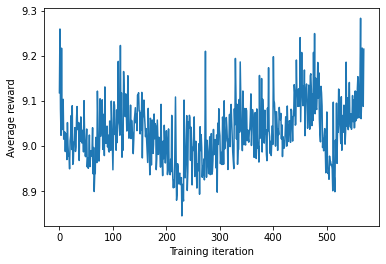

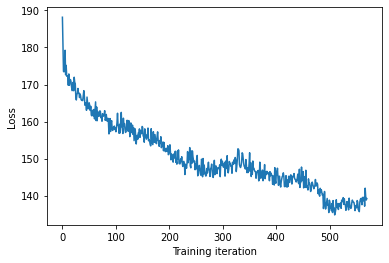

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.05it/s]


Mean value of predictions: 6.558785172050578
Proportion of valid SMILES: 0.79


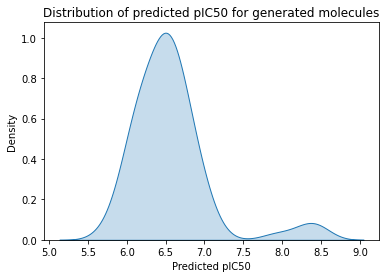

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#CCC(OO)C(C(=O)CO)C(O)C(O)CCC=CC
C=CC(COc1ccccc1)CON1CCN(c2ccccn2)CC1
C=CCC(CCCN(O)CCO)CN(C)C(=O)c1ccccc1N(=O)=O
C=CCC1(C)C(=O)N1c1ccc(C(N)=O)cc1
C=CCN(CCCCCCCCCCCC)CCCCCCN1CCN(c2ccccc2)C1


Policy gradient...: 100%|██████████| 15/15 [02:32<00:00, 10.16s/it]


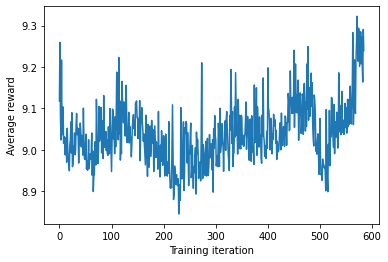

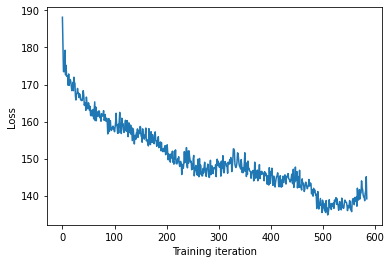

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.11it/s]


Mean value of predictions: 6.605797611339059
Proportion of valid SMILES: 0.845


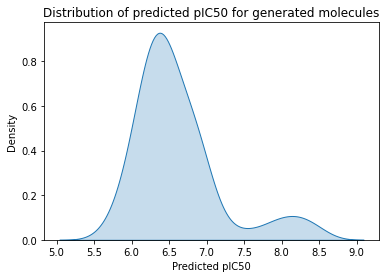

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C)C(C)c1ccc(OCc2ccccc2)cc1
C=CCNC(=O)c1c2c(cn1CC(=O)NCc1ccccc1N(=O)=O)CCC2
C=CCOCc1ccccc1
C=CCc1ccccc1C(=O)N1CCC(NC(N)=O)CC1
CC(=NNC(=O)c1ccc(Cl)nc1)n1cc2c(c1)C(=O)N(C1CCCCC1)CC2


Policy gradient...: 100%|██████████| 15/15 [02:31<00:00, 10.12s/it]


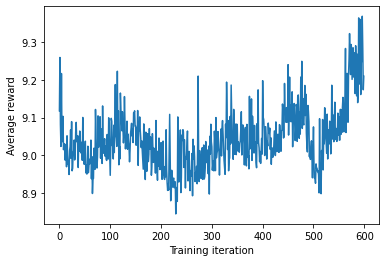

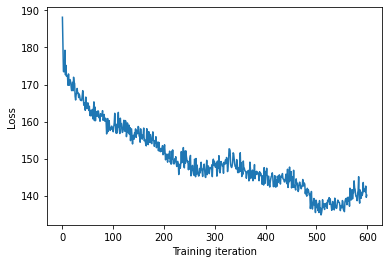

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.09it/s]


Mean value of predictions: 6.557167408707717
Proportion of valid SMILES: 0.84


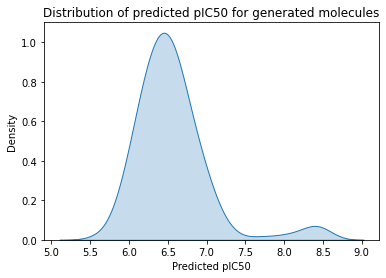

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CC1CCC(C)(C)CC1c1ccc(OC)cc1
C=CCNC(=S)NCCCCCCC
C=NS(=O)(=O)c1c(C)cc2c(c1C)NC(=O)C=C2SCc1ccc(OC)cc1
CC(=O)NC(C)c1nc2ccccc2[nH]1
CC(C)(C)C1C(N)CC(CO)C=C2Cc3ccccc3N=C2C(Cl)C(=O)N2CCC(CC2)N1c1ccccc1


Policy gradient...: 100%|██████████| 15/15 [02:33<00:00, 10.26s/it]


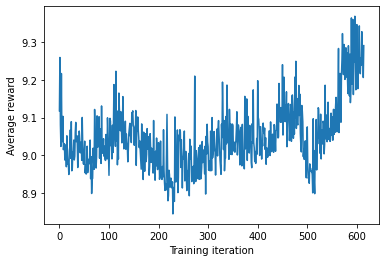

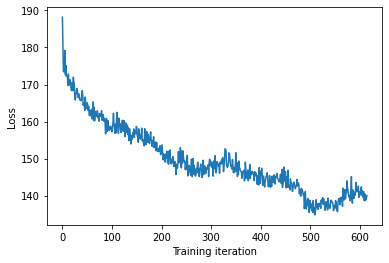

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.09it/s]


Mean value of predictions: 6.647515657085105
Proportion of valid SMILES: 0.835


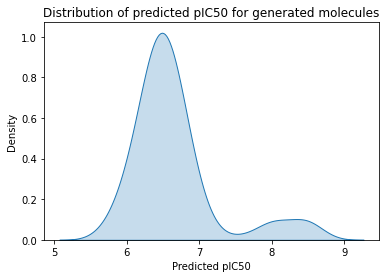

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(OCc1ccccc1)C(=O)CCCCCCCNCCCNCCCNCCCCNCCCCCO
C=CCC(C)c1ccc(-c2ccccc2)cc1
C=CCNC(C(=O)Nc1ccccc1)c1c(C)cccc1C
CC(=CC=CSc1ccccc1)C=C(C)C=Cc1ccc(C)cc1
CC(=NNC(=O)CSc1ccc(Cl)cc1Cl)c1ccC(CC(=O)O)CCccc1


Policy gradient...: 100%|██████████| 15/15 [01:46<00:00,  7.09s/it]


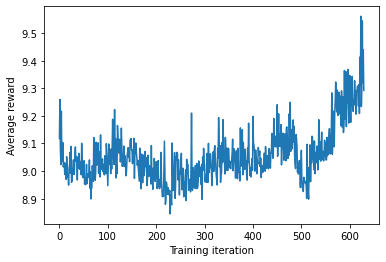

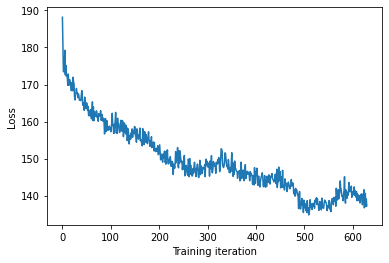

Generating molecules...: 100%|██████████| 200/200 [00:10<00:00, 19.47it/s]


Mean value of predictions: 6.754433979018156
Proportion of valid SMILES: 0.82


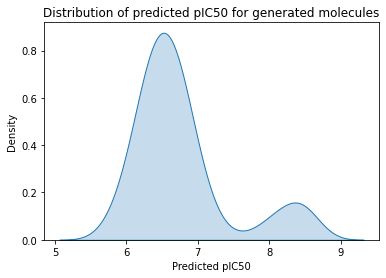

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CC(=O)C12CC3CC1CC(NCc1ccccc1C)(C3)C2
C=CC(=O)c1ccc(OC)c(S(=O)(=O)N2CCCC2)c1
C=CCC(Cc1ccccc1)N(c1ccccc1)S(=O)(=O)c1ccc(O)cc1
C=CCN(C(=O)OCn1ccnc1)C(CC)CC
C=CCN(C)C(=O)NCCCCC(N)C(=O)NC(CC(=O)O)CC(C)C


Policy gradient...: 100%|██████████| 15/15 [02:00<00:00,  8.01s/it]


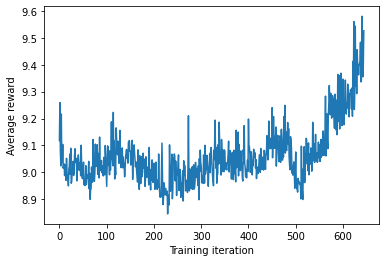

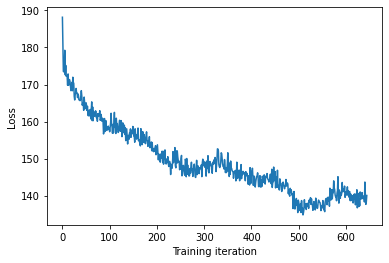

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.11it/s]


Mean value of predictions: 6.677780661295338
Proportion of valid SMILES: 0.835


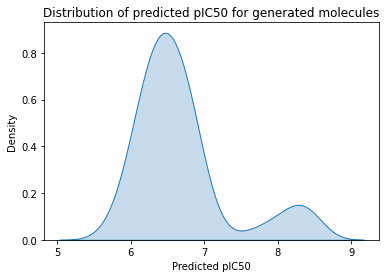

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C)C1C(=O)N(c2ccc(C)cc2)N1C(=O)OCC
C=CCNCCSC(=O)Nc1ccccc1
CC(=Cc1ccccc1)CNCC1CC(=O)Nc2ccccc21
CC(=NOCCN1CCCC1)c1ccccc1
CC(=O)CCC(=O)NN(C(=O)COCC(=O)O)C1CCCC1


Policy gradient...: 100%|██████████| 15/15 [02:33<00:00, 10.23s/it]


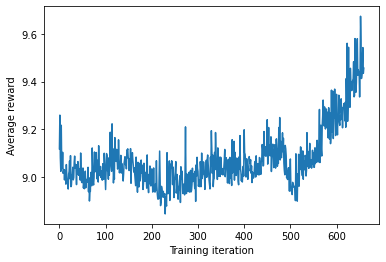

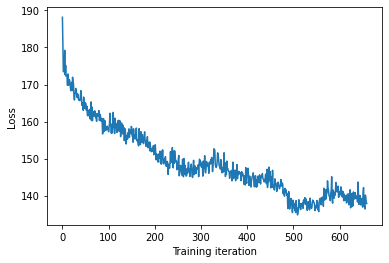

Generating molecules...: 100%|██████████| 200/200 [00:40<00:00,  4.98it/s]


Mean value of predictions: 6.703442408636515
Proportion of valid SMILES: 0.835


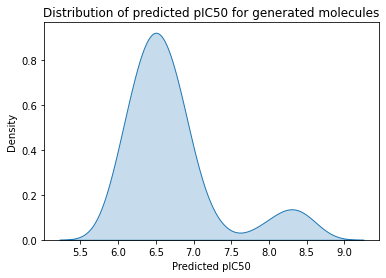

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C1CCC(C2CCOCC2)=NC1
C=CCN1CCN(CCC2CN(S(=O)(=O)c3ccccc3)CC2C(=O)NCC)CC1
C=CCN1CCN(S(=O)(=O)c2cccc(Cl)c2)CC1
C=CCNS(=O)(=O)C1CCCC(C)C1
CC(=NNC1CCN(c2ccccc2)CC1)c1ccccc1


Policy gradient...: 100%|██████████| 15/15 [02:33<00:00, 10.26s/it]


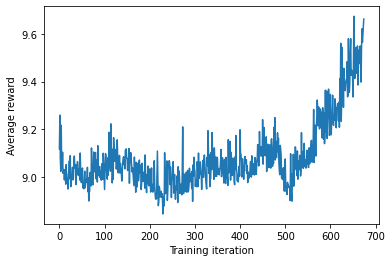

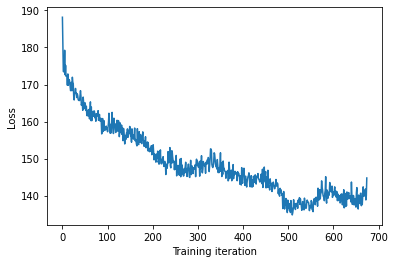

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.03it/s]


Mean value of predictions: 6.707483697699028
Proportion of valid SMILES: 0.8


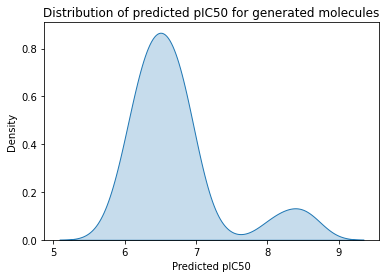

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
BrCCCCOCc1ccccc1
C
C=CCN(CCC(C)C)C(=O)OC
C=Cc1ccc(S(=O)(=O)NC2CCN(C)CC2)cc1OCCCCC
C=NNC(Nc1ccc(S(=O)(=O)N2CCOCC2)cc1)c1ccccc1


Policy gradient...: 100%|██████████| 15/15 [02:14<00:00,  8.98s/it]


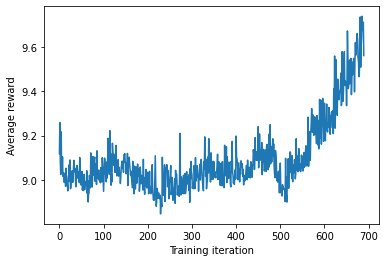

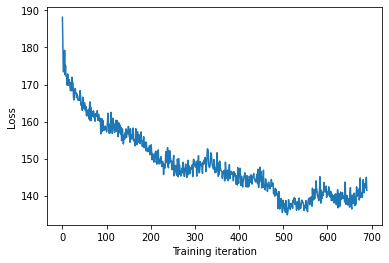

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.00it/s]


Mean value of predictions: 6.7819317995029325
Proportion of valid SMILES: 0.895


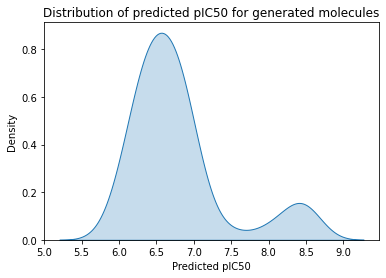

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(CNC(=O)NC(=O)c1ccccc1)N1CCOCC1
C=CCCSCCNC(=O)c1ccc(C(=O)NCCCc2cccc(S(=O)(=O)OCC)c2)cc1
C=CCNC(=O)Cc1ccccc1
CC(=O)C1CCC(CNC(=O)C(CC2CCCC2)NC(=O)C2CC(F)(N3CCCC3)CN2)CC1
CC(=O)N1N=C(c2ccc(F)cc2)CC1c1ccc(S(=O)(=O)N2CCOCC2)cc1


Policy gradient...: 100%|██████████| 15/15 [02:33<00:00, 10.22s/it]


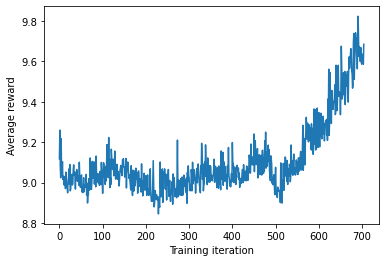

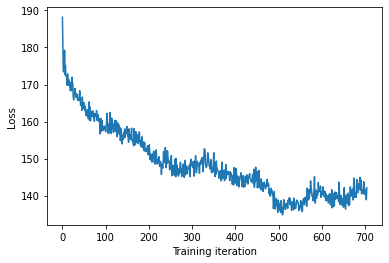

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.06it/s]


Mean value of predictions: 6.688365693809162
Proportion of valid SMILES: 0.875


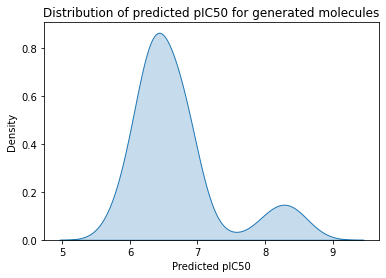

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C1=NCCC(Nc2ncccn2)N1
C=C1C(=NNC(=O)NCCCCC)CC(O)c2ccccc21
CC(=O)C(C)c1ccccc1
CC(=O)C1CN(CCc2ccccc2)CC1CN1CCNCC1
CC(=O)Nc1cccc(C(=O)NC(=S)NN=Cc2ccccc2)c1


Policy gradient...: 100%|██████████| 15/15 [02:32<00:00, 10.15s/it]


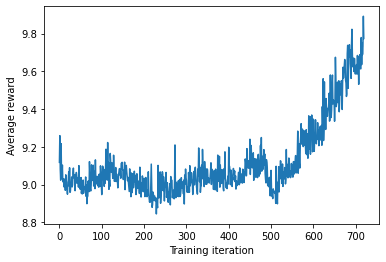

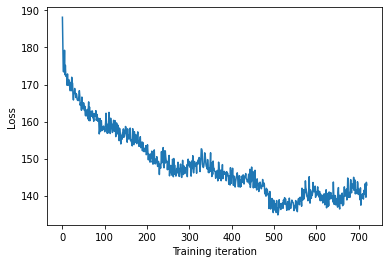

Generating molecules...: 100%|██████████| 200/200 [00:10<00:00, 19.83it/s]


Mean value of predictions: 6.73784566694853
Proportion of valid SMILES: 0.855


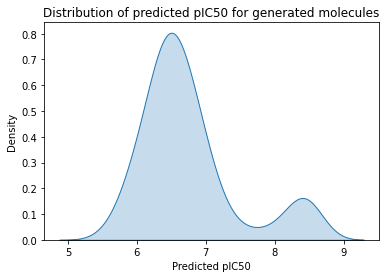

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C)Cc1ccc(C(=O)NCC(=O)N2CCN(CC(=O)OC)CC2)cn1
CC(=O)NCCN1CCN(c2ccccc2)CC1C
CC(=O)Nc1ccc(Cl)cc1Cl
CC(=O)Nc1ccc(N(=O)=O)cc1
CC(=O)Nc1ccc2ccnc(Nc3cccc(Cl)c3)c2c1


Policy gradient...: 100%|██████████| 15/15 [02:01<00:00,  8.13s/it]


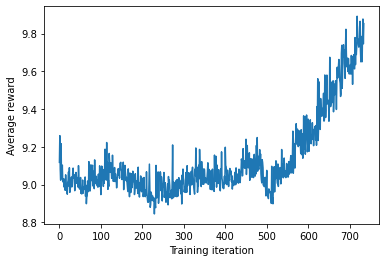

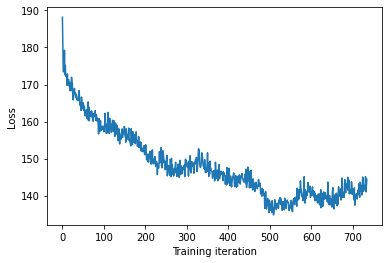

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.05it/s]


Mean value of predictions: 6.645611813698831
Proportion of valid SMILES: 0.905


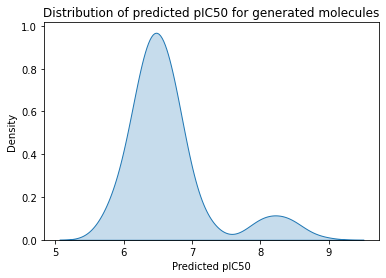

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCN(N=Cc1ccccc1)S(=O)(=O)c1ccc(OC)cc1
C=CCN1CCC(CCNC(=O)Cc2ccccn2)CC1
C=CCS(=O)(=O)c1c(C)nn2c1N(CC(CO)NC(=O)C(=O)Nc1cccc3ccccc13)CCC2CO
CC(=NNC(N)=O)c1ccccc1
CC(=O)C(c1cccc(C)c1)C(C(=O)O)C(=O)NC(C)(C)CCCN(CC=CC(=O)O)N1CC2CCCCCN2C(c2cccc(C)c2C)C1=O


Policy gradient...: 100%|██████████| 15/15 [02:30<00:00, 10.04s/it]


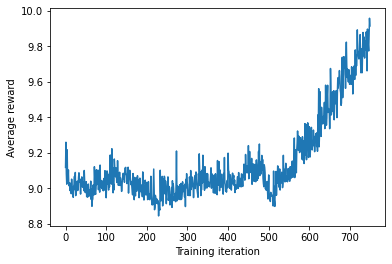

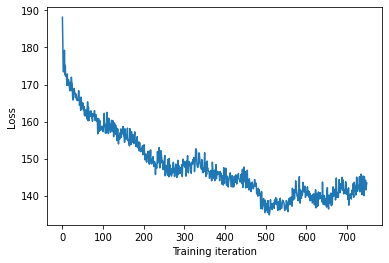

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.10it/s]


Mean value of predictions: 6.686052747060022
Proportion of valid SMILES: 0.86


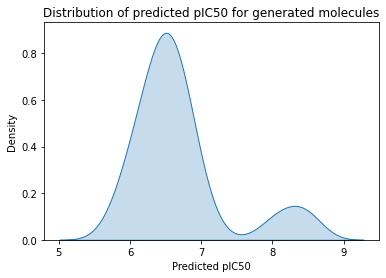

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C)Cn1c2ccccc2c2cnccc21
CC(=NNC(=O)c1cccc(S(N)(=O)=O)c1)c1ccccc1
CC(=NNC(N)=O)c1ccc(Cl)cc1
CC(=O)N1CCC(NC(=O)C(C)N2CCN(Cc3ccccc3)CC2)(S(=O)(=O)c2ccccc2)CC1
CC(=O)N1CCN(C(=O)C2CN(C)CC2C(O)c2ccccc2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:31<00:00, 10.08s/it]


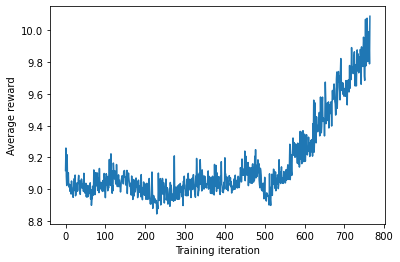

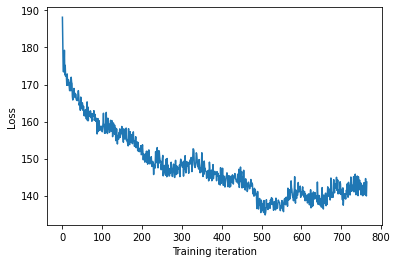

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.06it/s]


Mean value of predictions: 6.7792918239494195
Proportion of valid SMILES: 0.86


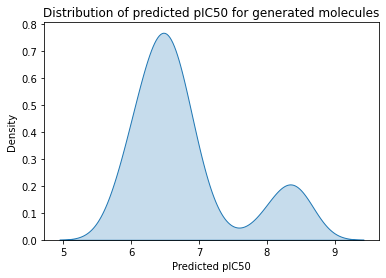

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C
C=C1C2C3CC2(C(=O)OC)C2CCC(CC3CC1(C)C(=O)NC(C)CC1CCCCC1)C2
C=CCN1CCN(C(=O)C=Cc2cccc(N(=O)=O)c2)CC1
CC(=NNC(N)=NNC(=S)NC(=O)c1ccccc1)c1ccc(N2CCN(C)C2C)cc1
CC(=O)C(NC(=O)C1CN(C(=O)Nc2ccccc2)C1)C1CCCCC1


Policy gradient...: 100%|██████████| 15/15 [02:29<00:00,  9.93s/it]


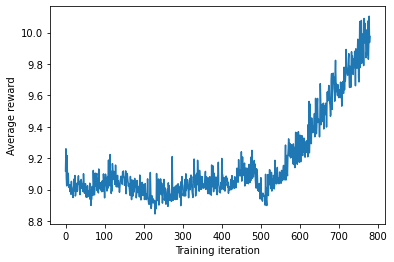

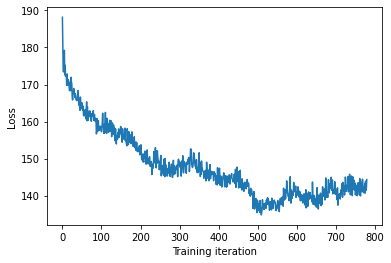

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.06it/s]


Mean value of predictions: 6.878205920147813
Proportion of valid SMILES: 0.84


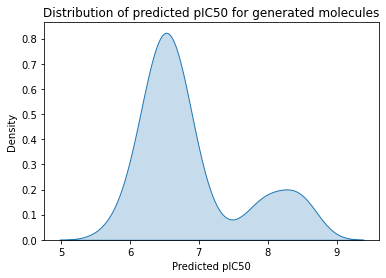

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(N)N(Cc1ccccc1OC)C(C)C(c1ccccc1)c1ccccc1
C=CCNCCOCCCOc1ccc(C(=O)NN=C2SCC(=O)N2C)cc1OC
CC(=O)N1CCCCC1COC(=O)Nc1ccccc1
CC(=O)N1CCN(C(=O)CCc2ccccc2)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(=O)(=O)c3ccccc3)CC2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:15<00:00,  9.03s/it]


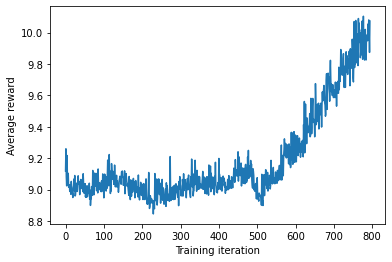

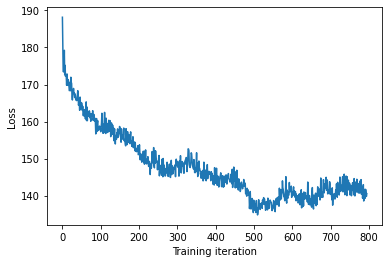

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.07it/s]


Mean value of predictions: 6.800635540712085
Proportion of valid SMILES: 0.865


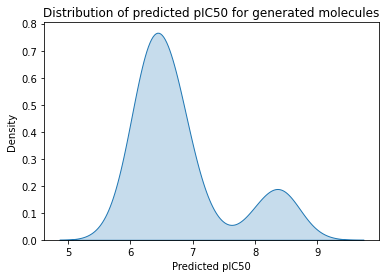

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(CCCCCCCCCCCCCCC)CCCOCC(O)C(O)C(N)Cc1ccccc1
C=CCN1CCCc2ccccc2N(CC(=O)c2ccccc2OC)C1=O
CC(=NNC(=O)c1ccccc1)c1ccc(S(=O)(=O)N2CCCC(C)C2)cc1
CC(=O)NC(=S)NC(=S)NN1CCN(CC(C)C)CC1
CC(=O)Nc1cccc(C(=O)Nc2cc(C)ccc2C)c1


Policy gradient...: 100%|██████████| 15/15 [02:31<00:00, 10.07s/it]


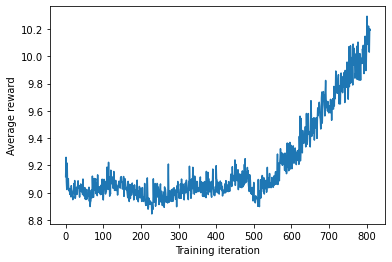

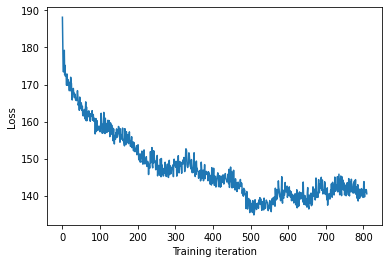

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.10it/s]


Mean value of predictions: 6.8721224402590035
Proportion of valid SMILES: 0.9


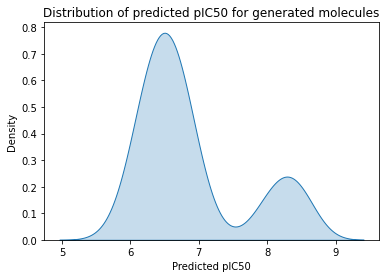

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#CCN(CCSC)CC(C)CO
C=C1Cc2ccccc2N1CC(=O)NC(C)C
C=CCN1C(=S)NN=C1c1ccccc1
CC(=O)N(C)CCCN1N=C(C(=O)NCC(=O)CCCCNc2nc(C)c(C)o2)c2ccccc21
CC(=O)N1CCCN(C(=O)c2cc(C)cc(C)c2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:30<00:00, 10.05s/it]


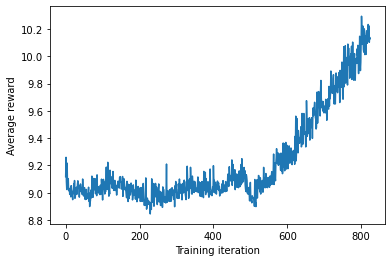

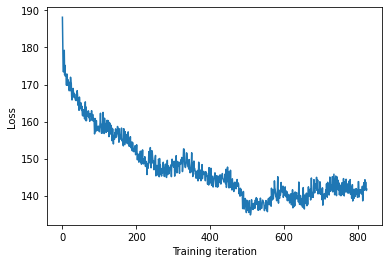

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.09it/s]


Mean value of predictions: 6.813528857208394
Proportion of valid SMILES: 0.805


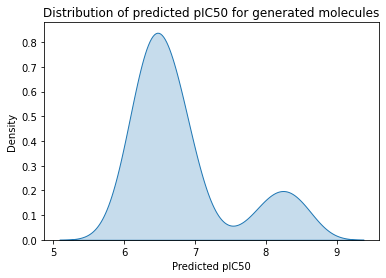

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#Cc1cccc(-c2cc(-c3ccccc3)ccc2CCC(=O)O)c1
C=CCCOCCCNCCNCCNCCNCCCNCCCCN
C=CCN(C)C(=O)N1CCN(S(=O)(=O)c2ccc(NS(=O)(=O)c3ccccc3Cl)cc2)CC1
C=CCN(CCN(C)CCC)CC(O)c1cccc(Cl)c1
C=CCNC(=N)NCOC


Policy gradient...: 100%|██████████| 15/15 [02:31<00:00, 10.09s/it]


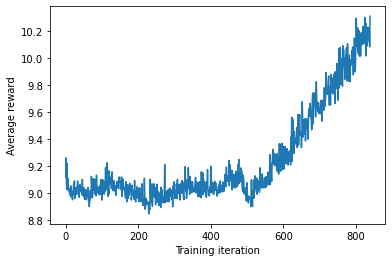

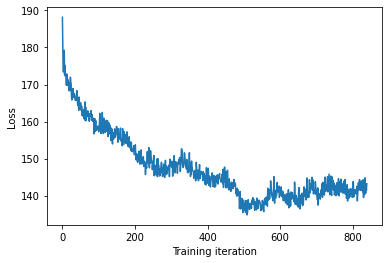

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.13it/s]


Mean value of predictions: 6.99079759791944
Proportion of valid SMILES: 0.875


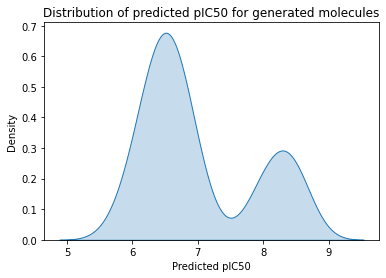

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C
C#CCON1CCN(c2ccccc2)C1C(=O)N(CC)CCC
C=C(C)COC(=O)c1cccc(C(F)(F)F)c1
C=CCN1CCN2CC3CCCC3CC(=C(c3cc(C(F)F)cs3)NC1=O)C2=O
CC(=O)N1CCN(S(=O)(=O)c2ccccc2CNC(=O)NC(=O)NC2CCN(S(=O)(=O)c3ccccc3)CC2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:29<00:00,  9.97s/it]


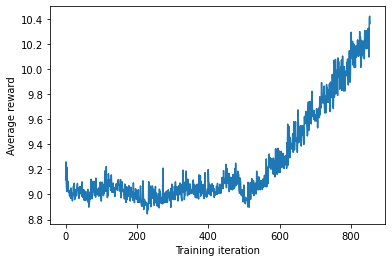

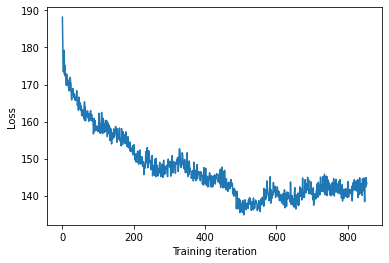

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.06it/s]


Mean value of predictions: 6.949387480877643
Proportion of valid SMILES: 0.89


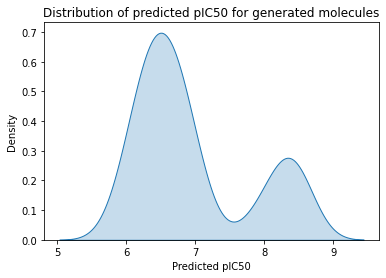

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
CC(=NNC(=O)c1ccccc1)c1nccc(C(F)(F)F)n1
CC(=O)N1CCN(S(=O)(=O)c2ccccc2C(N)=O)CC1C
CC(=O)N1CSCC1C(=O)NCCC(C)C
CC(=O)NCC1CN(c2ccccc2)C(=O)O1
CC(=O)OCC(=O)N1CCN(S(=O)(=O)c2ccc(C(C)C)cc2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:32<00:00, 10.15s/it]


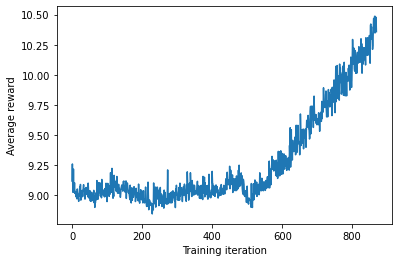

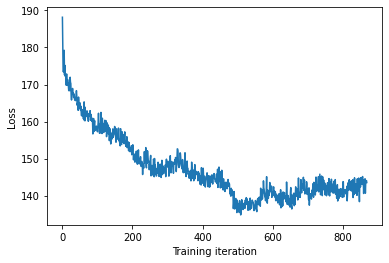

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.08it/s]


Mean value of predictions: 6.972873943852326
Proportion of valid SMILES: 0.905


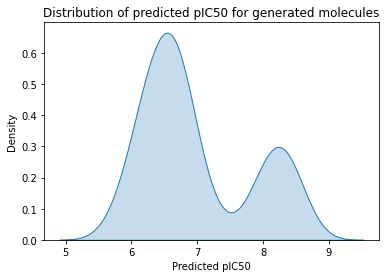

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCCCN1CCN(S(=O)(=O)N2CCC(C)CC2)CC1
C=CCN(CC(C)C)C(N)=O
CC(=O)Nc1ccccc1N1CCN(S(=O)(=O)c2cnn(-c3ccccc3)c2)CC1
CC(=O)c1cccc(N2CCc3ncnc(NCC(C)C)c3C2)c1
CC(C(=O)O)C1CCN(S(=O)(=O)N2CCN(C)CC2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:30<00:00, 10.06s/it]


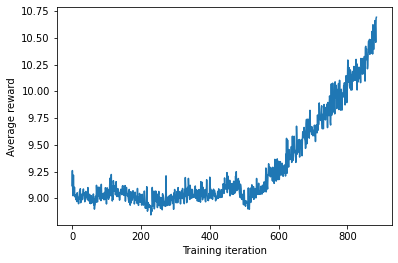

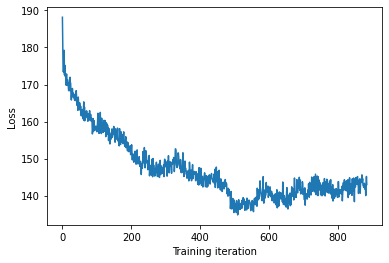

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.07it/s]


Mean value of predictions: 7.066495792919126
Proportion of valid SMILES: 0.89


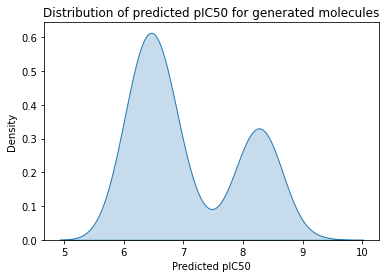

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C
C=C1c2ccccc2N=C(C(=O)OCC)C12CCOCC2
C=Cc1nc(C)ccc1C(O)CNC(C)CC
CC(=NN1CCN(C2CCN(c3ccccc3)CC2)CC1)C1C=CCC1
CC(=O)N1CCN(CCOCC2CCCCCN2CCCN2CCCC2C)CC1


Policy gradient...: 100%|██████████| 15/15 [02:15<00:00,  9.03s/it]


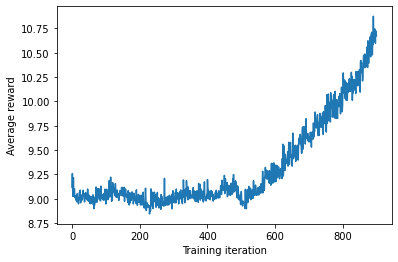

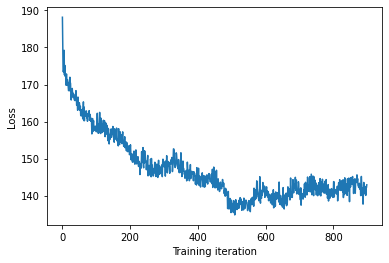

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.07it/s]


Mean value of predictions: 7.149958106911864
Proportion of valid SMILES: 0.875


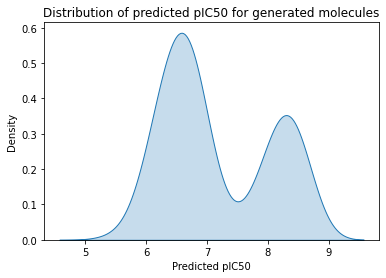

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCNC(OCC)C(=O)NCc1cccc(OC)c1
CC(=O)N1CCN(S(=O)(=O)c2ccc(C(C)(C)CC(=O)O)cc2)CC1
CC(=O)N1CCN(c2ccccc2)CC1
CC(=O)NCC1CCN(S(=O)(=O)c2ccccc2)CC1
CC(=O)Nc1cc(S(=O)(=O)N2CCN(C)CC2)nn1C(C)C


Policy gradient...: 100%|██████████| 15/15 [02:33<00:00, 10.23s/it]


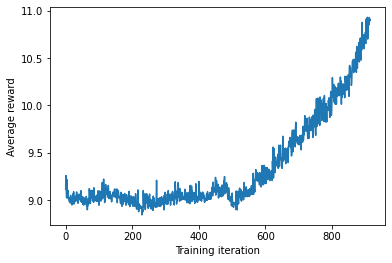

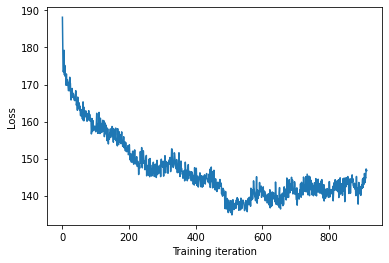

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.06it/s]


Mean value of predictions: 7.050161328925401
Proportion of valid SMILES: 0.88


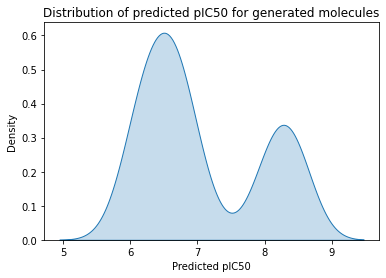

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCC(CCN(C)CCOC(C)COC)NC(=O)CNCCC(=O)OCC(O)CS(=O)(=O)NCCC1N(CC(C)CC)CCCC2CCCC21C
CC(=NNC(=O)C=Cc1ccccc1)S(=O)(=O)N1CCN(c2nccnn2)CC1
CC(=O)N1CCN(C)CC1
CC(=O)N1N=C(c2ccccc2)CC1c1ccccc1
CC(=O)NCC(=O)NC(C)C(=O)NC(C=O)CC(C)C


Policy gradient...: 100%|██████████| 15/15 [02:32<00:00, 10.13s/it]


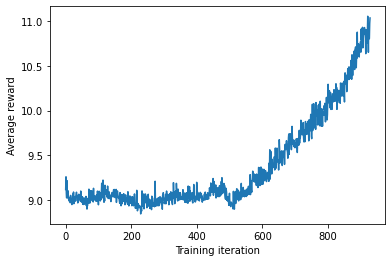

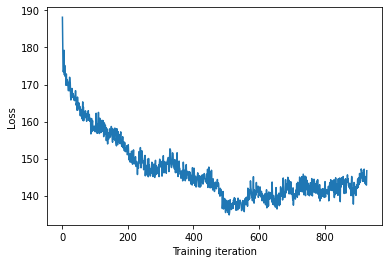

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.07it/s]


Mean value of predictions: 7.097899212707838
Proportion of valid SMILES: 0.88


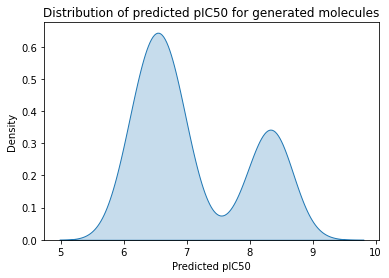

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C1NC(=O)C(CSC)=C(S(=O)(=O)C2CCN(c3ccccn3)CC2)NCN1CCCC
C=CCN(C)CCNCc1ccccc1O
CC(=O)N1CCCN(C)CC1
CC(=O)N1CCN(C(=O)NCCN2CCN(S(=O)(=O)c3ccccc3)CC2)CC1
CC(=O)N1CCN(C2CCN(C(=O)c3ccccc3)CC2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:18<00:00,  9.25s/it]


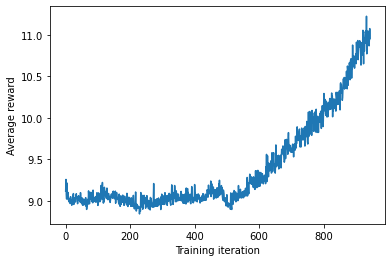

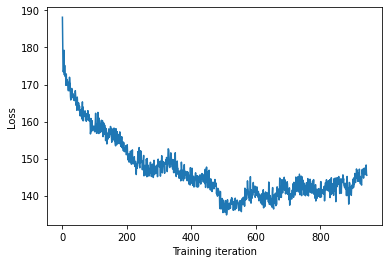

Generating molecules...: 100%|██████████| 200/200 [00:10<00:00, 19.76it/s]


Mean value of predictions: 7.124061990945532
Proportion of valid SMILES: 0.895


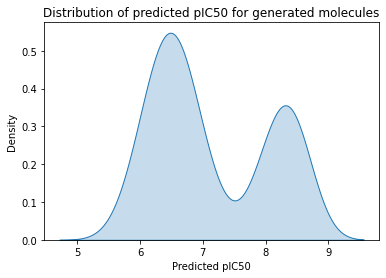

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=NNCC(C(N)=O)c1c(Cl)cccc1Cl
CC(=CC1CCC(C)N1C(=O)COc1ccc(S(=O)(=O)N2CCOCC2)cc1)OC(C)C
CC(=O)N(CCNC(=O)c1ccc(CCC(=O)O)cc1)S(=O)(=O)N1CCN(S(=O)(=O)c2ccc(C#N)cc2)CC1
CC(=O)NCCCN1c2ccccc2CCc2ccccc21
CC(=O)NCCNCCN1CCN(S(=O)(=O)c2ccccc2)CC1


Policy gradient...: 100%|██████████| 15/15 [01:56<00:00,  7.77s/it]


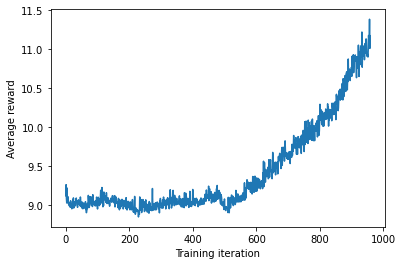

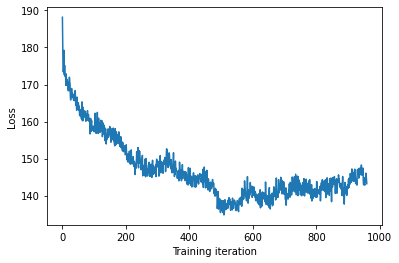

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.13it/s]


Mean value of predictions: 7.15050776428238
Proportion of valid SMILES: 0.905


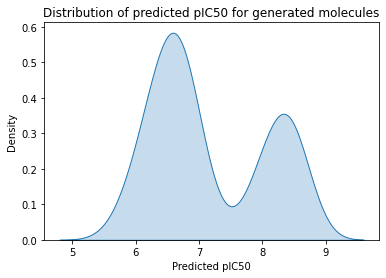

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C)C1CCN(S(=O)(=O)N2CCCCCC2)CC1
C=CCN1CCC(CC(C)Nc2ccccc2)=N(=O)N1c1ccc(OC)cc1
CC(=O)C(C)(C=CC1=C(C)CCCC1)c1ccccc1
CC(=O)N1CCN(CCCNC(=O)c2ccccc2)CC1
CC(=O)N1CCN(S(=O)(=O)c2cccc(Cl)c2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:16<00:00,  9.08s/it]


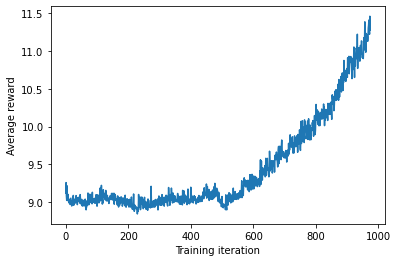

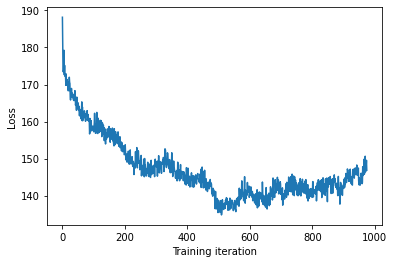

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.11it/s]


Mean value of predictions: 7.322313985543198
Proportion of valid SMILES: 0.88


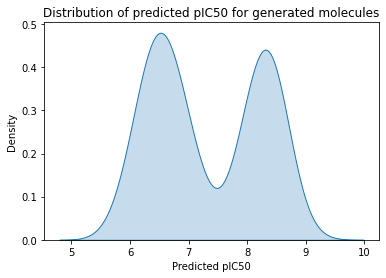

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCNCCc1oc2ccccc2c1C
CC(=NNC(=S)c1ccccc1)N1CCN(S(=O)(=O)c2ccccc2)CC1
CC(=O)N1CCN(C(=O)C2CCN(S(=O)(=O)c3ccccc3)CC2)C(C)C1
CC(=O)N1CCN(S(=O)(=O)c2ccc(NS(C)(=O)=O)cc2)CC1
CC(=O)NCC1CN(CCCN(C)Cc2ccccc2)CCN1O


Policy gradient...: 100%|██████████| 15/15 [02:08<00:00,  8.56s/it]


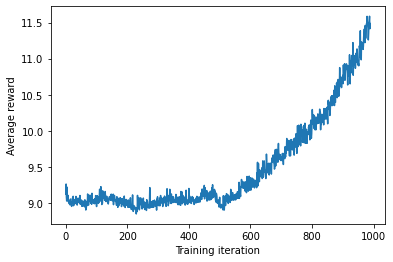

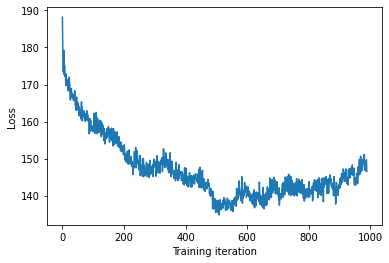

Generating molecules...: 100%|██████████| 200/200 [00:10<00:00, 19.11it/s]


Mean value of predictions: 7.281097316120263
Proportion of valid SMILES: 0.84


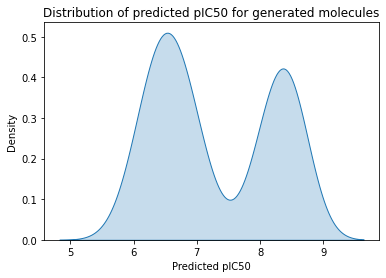

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C1CCN(C2CCNCC2)C1
C=C(C(=O)CC1CCCN(S(=O)(=O)c2ccc(Cl)cc2C)C1)C(C)C
C=C1NCC2CCC1C1CC2CN1c1ccccc1
C=Cc1ccc(S(=O)(=O)N2CCNS(=O)(=O)CC2)cc1
CC(=O)N1CCN(S(=O)(=O)c2ccc(C3CCN(C(=O)Cc4ccc(N5CCNCC5)cc4)CC3)cc2)CC1


Policy gradient...: 100%|██████████| 15/15 [01:46<00:00,  7.10s/it]


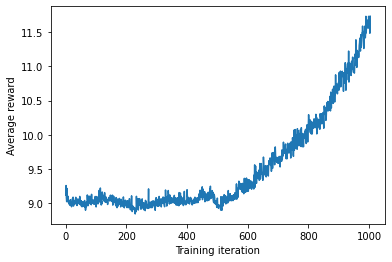

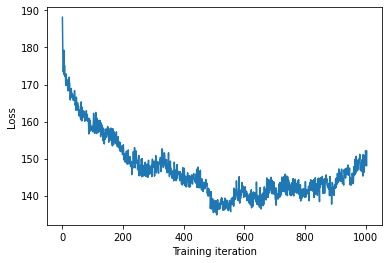

Generating molecules...: 100%|██████████| 200/200 [00:10<00:00, 18.76it/s]


Mean value of predictions: 7.34039111066599
Proportion of valid SMILES: 0.9


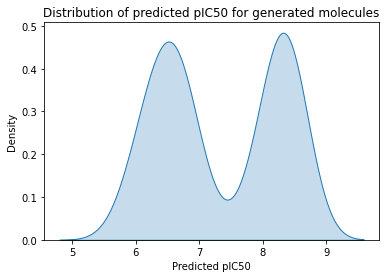

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCN1C(C)=NN(CC(=O)NC)C(C(=O)NCC2CCCCCC2)N1S(=O)(=O)c1ccccc1
CC(=O)N1CCN(S(=O)(=O)c2ccc(S(=O)(=O)N3CCN(S(C)(=O)=O)CC3)cc2)CC1
CC(=O)NCCCc1cccc(S(=O)(=O)N2CCN(C)CC2)c1
CC(=O)OC1CCN(c2ccc(C(F)(F)F)cc2C(F)(F)F)CC1
CC(C)(C)OC(=O)N1CCN(S(=O)(=O)c2cc(S(=O)(=O)N3CCNCC3)ccc2N2CCCCC2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:31<00:00, 10.13s/it]


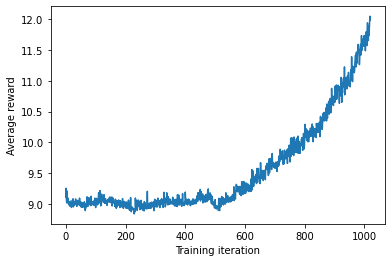

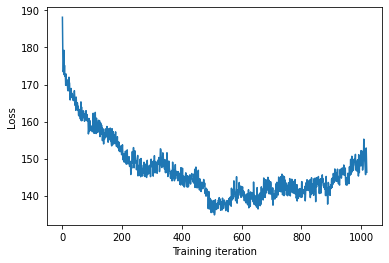

Generating molecules...: 100%|██████████| 200/200 [00:40<00:00,  4.98it/s]


Mean value of predictions: 7.336389907228287
Proportion of valid SMILES: 0.895


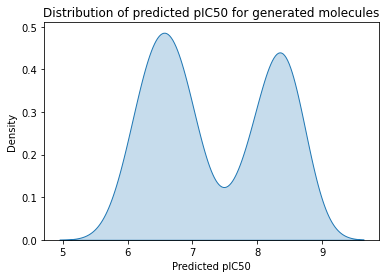

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C)NC1CNCCc2ccccc21
CC(=Cc1ccc(S(=O)(=O)N2CCN(C)CC2)cc1)C(=O)Nc1ccc(S(=O)(=O)N2CCCCC2)cc1
CC(=O)C1=CN(Cc2ccccc2)c2ccccc2C1CN1CCN(S(=O)(=O)c2cccnc2)CC1
CC(=O)N1CCC(c2ccc(S(=O)(=O)N3CCN(CCN(C)C)CC3)cc2)CC1
CC(=O)N1CCN(S(=O)(=O)N2COCC(c3ccccc3)O2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:31<00:00, 10.07s/it]


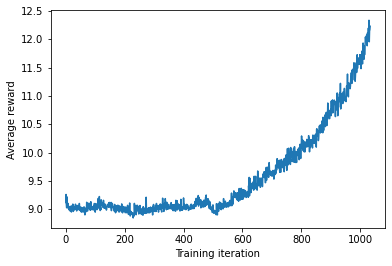

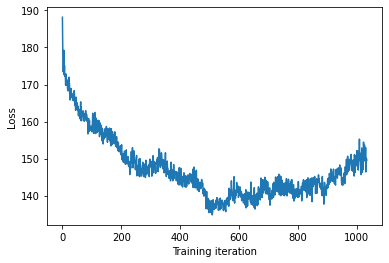

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.04it/s]


Mean value of predictions: 7.449354282405703
Proportion of valid SMILES: 0.845


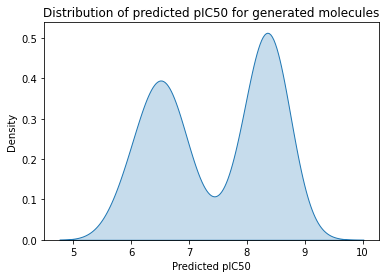

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCN1CCOC1C(=O)N1CCN(CCOC)CC1
CC(=O)N1CCN(S(C)(=O)=O)CC1
CC(=O)N1CCN(c2ccc(S(=O)(=O)N3CCN(C(C)=O)C(c4ccccc4)C3)cc2)CC1
CC(=O)N1CCc2ccccc2C1CCN1CCN(S(=O)(=O)N2CCN(S(=O)(=O)F)CC2)CC1
CC(=O)NC1CCN(S(=O)(=O)c2ccccc2C(C)N)CC1


Policy gradient...: 100%|██████████| 15/15 [02:35<00:00, 10.35s/it]


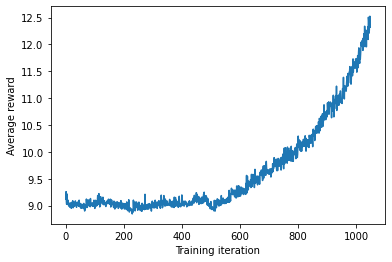

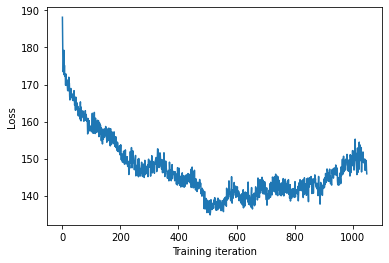

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.12it/s]


Mean value of predictions: 7.40169232119733
Proportion of valid SMILES: 0.905


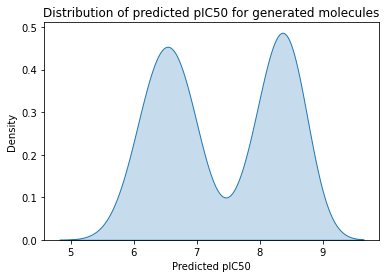

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C(=O)NCCCC)C1CCCOCC1
C=CCNC(=O)N1CCN(C(=O)C(NC(=O)C2CCCN2CC2CCCNC2)c2ccc(OC)cc2)CCs1N(C)C
CC(=O)N1CCN(C(=O)C2CNC3=C(C)N(CC(C)NCC(=O)O)C3(C)CCC3CC(C)CC=CC32)CC1
CC(=O)N1CCN(S(=O)(=O)Oc2cccc(S(=O)(=O)N3CCN(C)CC3)c2)CC1
CC(=O)N1N=C(C)SC1CCc1ccccc1


Policy gradient...: 100%|██████████| 15/15 [02:33<00:00, 10.20s/it]


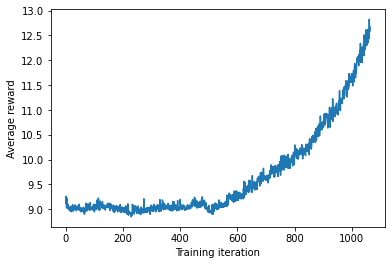

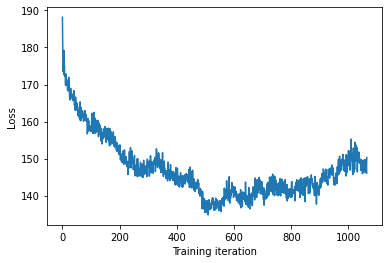

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.03it/s]


Mean value of predictions: 7.531113436853013
Proportion of valid SMILES: 0.86


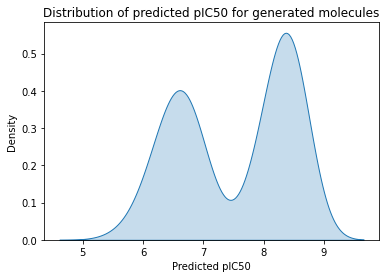

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
CC(=Cc1ccccc1)c1ccc(N(=O)=O)nc1-c1c(C)c(C)nn1C
CC(=O)CCCO
CC(=O)N1CCN(S(=O)(=O)c2ccccc2)CC1
CC(=O)N1CCN(S(=O)(=O)c2ccccc2COC(=O)N2CCN(C(=O)CN3CCN(S(=O)(=O)c4cccn4C)CC3)CC2)CC1
CC(=O)NC1CCN(S(=O)(=O)c2ccccc2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:32<00:00, 10.17s/it]


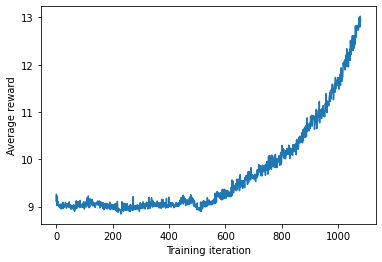

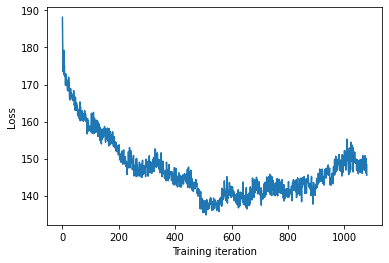

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.02it/s]


Mean value of predictions: 7.41782659677621
Proportion of valid SMILES: 0.885


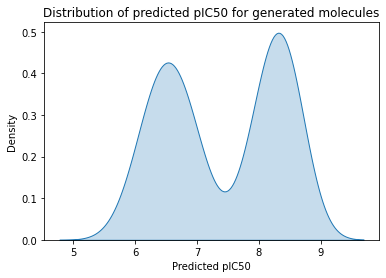

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
CC(=NNC(N1CCCCC1)S(=O)(=O)c1ccccn1)n1cccc1
CC(=O)N1CCCN(C(=O)c2cccc(S(=O)(=O)N3CCCC(C)C3)c2)CC1
CC(=O)N1CCN(S(=O)(=O)Oc2ccccc2)CC1
CC(=O)N1CCN(S(=O)(=O)c2ccccc2)CC1
CC(=O)NCCN(CCCN1CCN(S(C)(=O)=O)CC1)c1ccccc1


Policy gradient...: 100%|██████████| 15/15 [02:33<00:00, 10.21s/it]


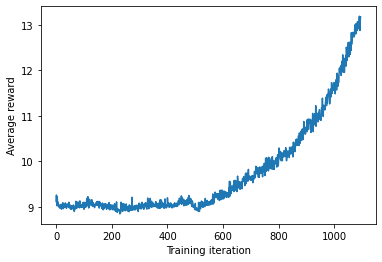

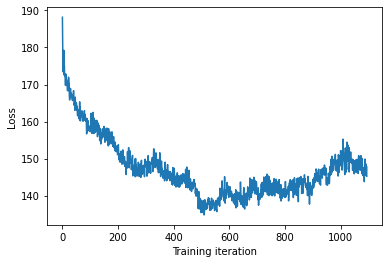

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.05it/s]


Mean value of predictions: 7.621164778836668
Proportion of valid SMILES: 0.91


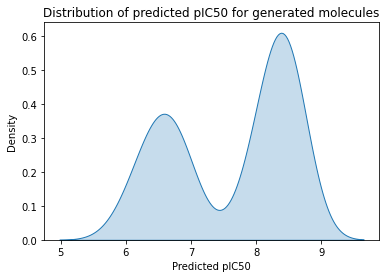

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCN1C(=O)Nc2cc(S(=O)(=O)N3CCN(Cc4ccccc4)CC3)ccc21
C=CCN1NC(=S)N(c2ccccc2)C1(CCN1CCOCC1)C1=NCCN1
C=CN1C(=O)N(Br)C(=O)c2cc(S(=O)(=O)N(CC)CC)ccc21
CC(=O)N1CCN(S(=O)(=O)c2ccc(C)cc2C2CCNCC2)CC1
CC(=O)N1CN(N2CCN(C(=O)c3ccccc3)CC2)C(=O)CCN1C


Policy gradient...: 100%|██████████| 15/15 [02:30<00:00, 10.06s/it]


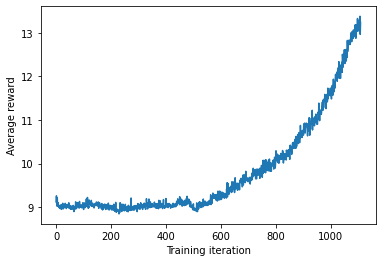

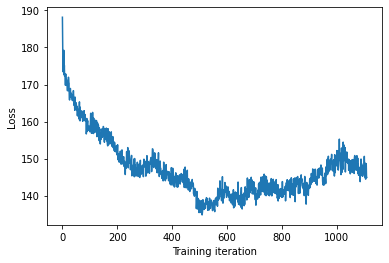

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.07it/s]


Mean value of predictions: 7.615240122115078
Proportion of valid SMILES: 0.875


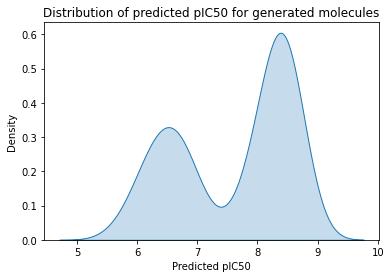

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCN1CCN(S(=O)(=O)c2ccccc2)CC1
CC(=O)N1CCN(S(=O)(=O)c2ccc(C(=O)N3CCN(S(=O)(=O)c4ccccc4)CC3)cc2)CC1
CC(=O)N1CCN(S(=O)(=O)c2ccc3[nH]ccc3c2)CC1
CC(=O)N1CCN(S(=O)(=O)c2ccccc2)CC1
CC(=O)N1N=C(C)Oc2ccccc21


Policy gradient...: 100%|██████████| 15/15 [02:31<00:00, 10.08s/it]


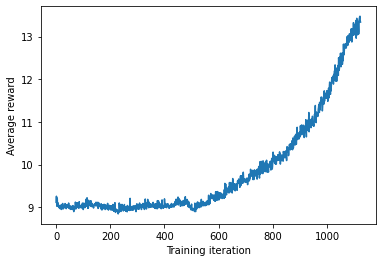

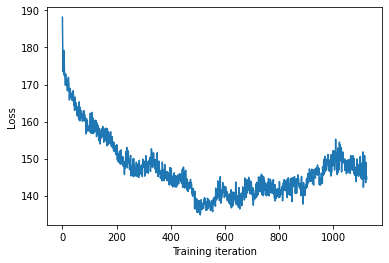

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.06it/s]


Mean value of predictions: 7.738253524768871
Proportion of valid SMILES: 0.85


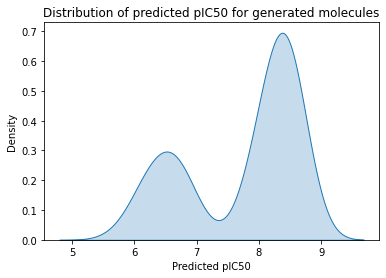

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CC1=C2N=C(SCCN(C)N(CCCCCC)C=NC1=O)S(=O)(=O)c1ccccc1C2=O
CC(=NN1CCN(S(=O)(=O)c2cccc(C)c2)CC1)S(=O)(=O)N1CCOCC1
CC(=O)N1CCC(N2CCN(S(=O)(=O)c3ccccc3)CC2)(S(=O)(=O)N2CCN(Cc3ccccc3Cl)CC2)CC1
CC(=O)N1CCN(S(=O)(=O)c2ccc(N3CCN(S(=O)(=O)CCN4CCSCC4)CC3)cc2)CC1
CC(=O)N1CCN(S(=O)(=O)c2cccc(N(=O)=O)c2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:30<00:00, 10.02s/it]


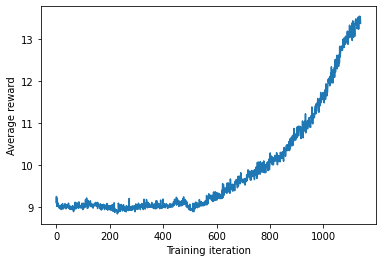

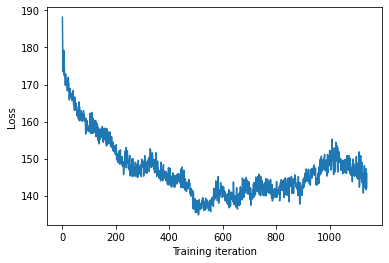

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.05it/s]


Mean value of predictions: 7.699499632036268
Proportion of valid SMILES: 0.88


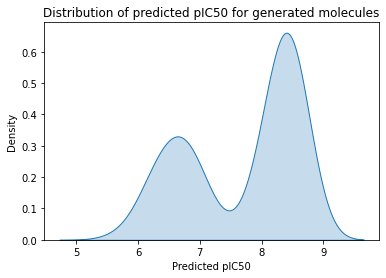

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCN(C)CCN1CCc2cc(OC)c(OC)cc2C1=O
C=S(=O)(c1ccccc1)N1CCC(C(C)=NNc2nccs2)CC1
CC(=O)N1CC(=O)NC1SCCOC(C)Oc1ccccc1
CC(=O)N1CCCN(C2CCN2C(=O)c2ccc(Cl)cc2)CC1
CC(=O)N1CCN(S(=O)(=O)c2ccc(S(=O)(=O)N3CCC(C)CC3)cc2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:30<00:00, 10.05s/it]


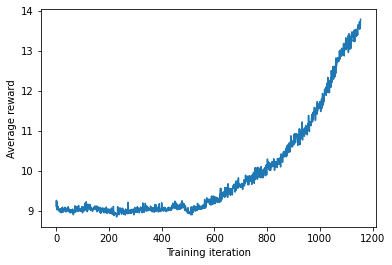

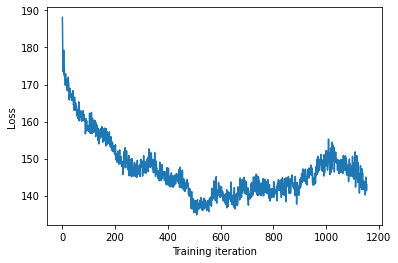

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.04it/s]


Mean value of predictions: 7.815343504359811
Proportion of valid SMILES: 0.88


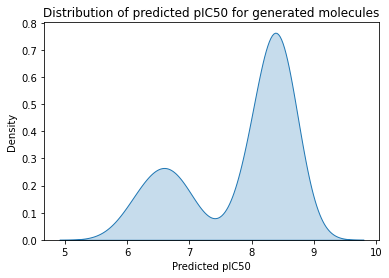

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCN(CC=C)CC1SC(=O)N(CCOCC)c2cc(N3CCN(C)CC3)ccc21
C=CCNC(=O)CSC1SC(=O)N(CCCC)C(=S)S1
CC(=O)N1CCN(S(=O)(=O)c2ccccc2)CC1
CC(=O)N1CCN(S(=O)(=O)c2ccnc(C)c2)CC1
CC(=O)Nc1ccc(S(=O)(=O)N2CCN(S(=O)(=O)c3ccccc3)CC2)cc1


Policy gradient...: 100%|██████████| 15/15 [02:30<00:00, 10.02s/it]


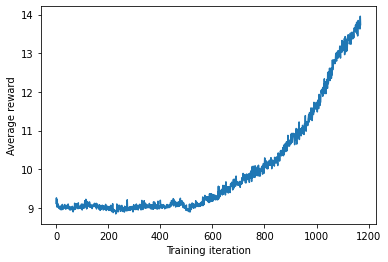

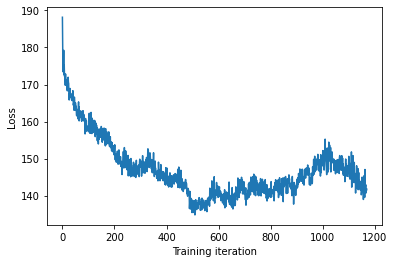

Generating molecules...: 100%|██████████| 200/200 [00:38<00:00,  5.17it/s]


Mean value of predictions: 7.72564019371281
Proportion of valid SMILES: 0.88


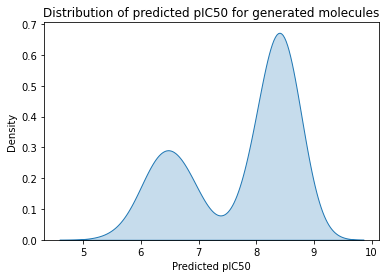

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)N1CCN(S(=O)(=O)c2ccccc2)CC1
CC(=O)N1CCN(S(=O)(=O)c2ccccc2N2CCN(S(=O)(=O)c3ccccc3)CC2)CC1
CC(=O)N1CCNc2ccncc21
CC(C)(C)C(=O)N1CCNCC1CN1CCN(S(=O)(=O)c2cccc(Cl)c2)CC1
CC(C)(NS(=O)(=O)c1ccccc1)C1CCN(c2cccc(C(N)=NC(=O)N3CCCCC3)c2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:31<00:00, 10.10s/it]


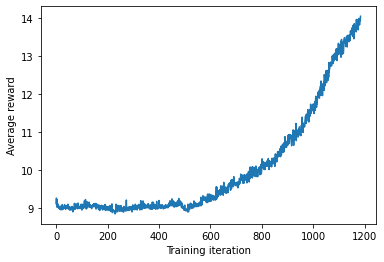

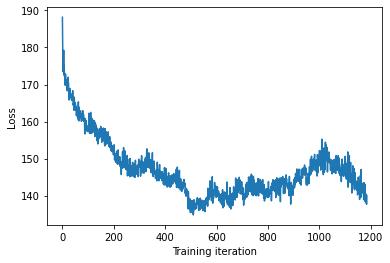

Generating molecules...: 100%|██████████| 200/200 [00:38<00:00,  5.16it/s]


Mean value of predictions: 7.7698790207804995
Proportion of valid SMILES: 0.875


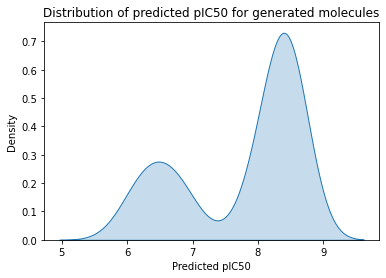

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#Cc1ccc(S(=O)(=O)N2CCN(CCCOC)CC2)cc1
CC
CC(=O)N1CCN(C(=O)c2cccc(S(=O)(=O)N3CCN(S(=O)(=O)c4ccccc4)CC3)c2)CC1
CC(=O)N1CCN(S(=O)(=O)c2ccccc2)CC1
CC(=O)N1CCN(S(=O)(=O)c2ccccc2C(=O)NCCCN2CCOCC2)CC1


Policy gradient...: 100%|██████████| 15/15 [01:49<00:00,  7.31s/it]


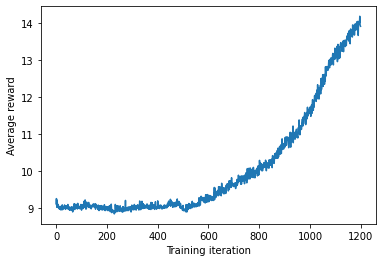

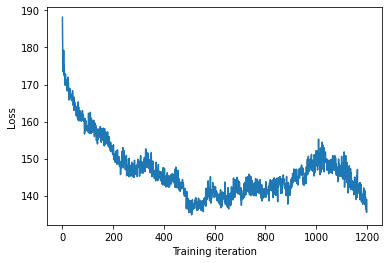

Generating molecules...: 100%|██████████| 200/200 [00:10<00:00, 19.51it/s]


Mean value of predictions: 7.772963909002146
Proportion of valid SMILES: 0.9


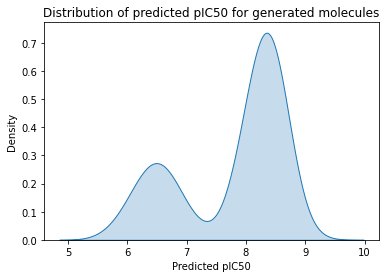

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C)CC(C)c1ccc(N2CCN(S(=O)(=O)c3ccccc3)CC2)cc1
C=CCN1CCN(S(=O)(=O)c2ccccc2)CC1
C=Cc1ccc(S(=O)(=O)N2CCN(S(=O)(=O)c3ccccc3)CC2)cc1
CC(=NOCCOc1ccccc1)S(=O)(=O)c1ccccc1
CC(=O)N1CCN(S(=O)(=O)c2ccc(N3CCN(S(=O)(=O)c4ccccc4)CC3)cc2)CC1


Policy gradient...: 100%|██████████| 15/15 [01:56<00:00,  7.78s/it]


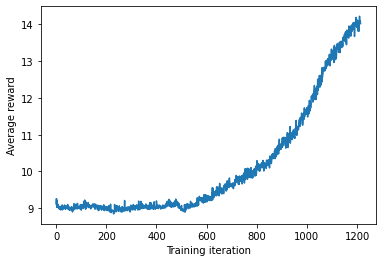

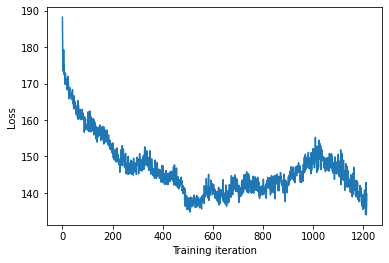

Generating molecules...: 100%|██████████| 200/200 [00:38<00:00,  5.16it/s]


Mean value of predictions: 7.843918363914678
Proportion of valid SMILES: 0.83


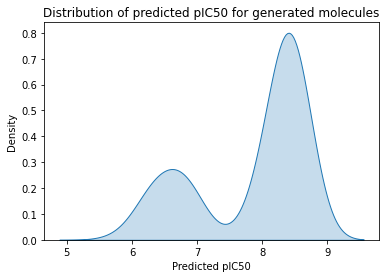

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)N1CCN(C)CC1CN1CCc2ccccc2C1
CC(=O)N1CCN(CCc2ccc(S(=O)(=O)N3CCN(C(=O)C(C)S(=O)(=O)c4ccccc4)CC3)cc2)CC1
CC(=O)N1CCN(S(=O)(=O)c2cccc(C(=O)N3CCN(S(C)(=O)=O)CC3)c2)CC1
CC(=O)N1CCN(S(=O)(=O)c2ccccc2)CC1
CC(C)(C)C(=O)N1CCN(S(=O)(=O)c2ccccc2-c2ccccc2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:28<00:00,  9.93s/it]


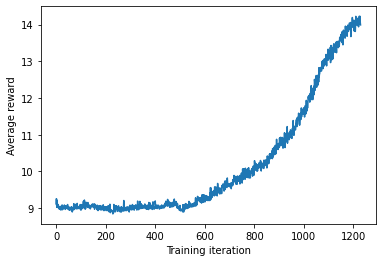

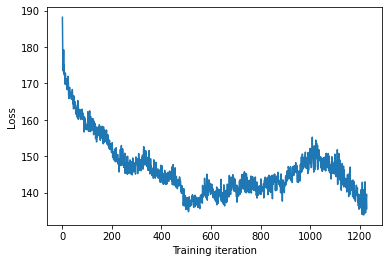

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.12it/s]


Mean value of predictions: 7.741087180931911
Proportion of valid SMILES: 0.86


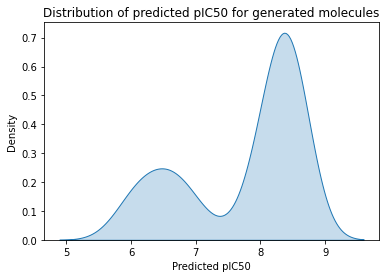

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C
CC(=O)N1CCCN(S(=O)(=O)c2ccccc2CNCCN2CCN(S(C)(=O)=O)CC2)CC1
CC(=O)N1CCN(S(=O)(=O)c2ccccc2)CC1
CC(=O)Nc1ccccc1CN1CCN(S(=O)(=O)c2ccccc2)CC1
CC(=O)n1cnc(CN)c1


Policy gradient...: 100%|██████████| 15/15 [02:14<00:00,  8.98s/it]


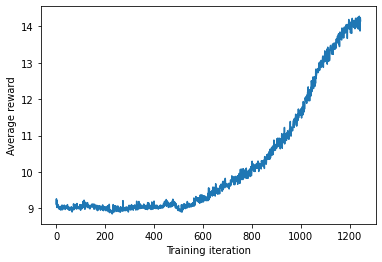

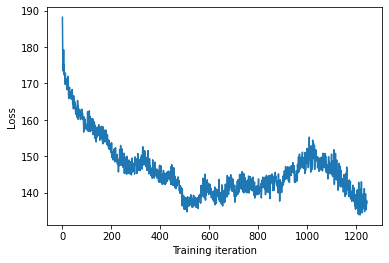

Generating molecules...: 100%|██████████| 200/200 [00:10<00:00, 19.68it/s]


Mean value of predictions: 7.938567787491373
Proportion of valid SMILES: 0.85


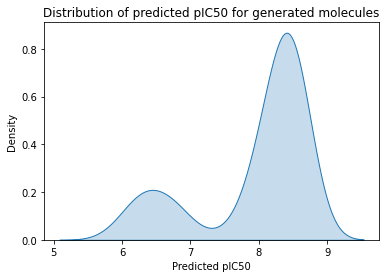

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C1SN=CN1NC(=O)c1ccccc1Cl
CC(=NN=C1NCCC2CCN(CC2)C1SS(=O)(=O)c1ccccc1)c1ccccc1
CC(=NNC(=O)c1ccccc1)S(=O)(=O)N1CCN(S(=O)(=O)c2ccccc2)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(=O)(=O)CCN3CCN(S(=O)(=O)c4ccccc4)CC3)CC2)CC1
CC(=O)N1CCN(S(=O)(=O)c2cc(S(N)(=O)=O)ccc2Cl)CC1


Policy gradient...: 100%|██████████| 15/15 [02:29<00:00,  9.99s/it]


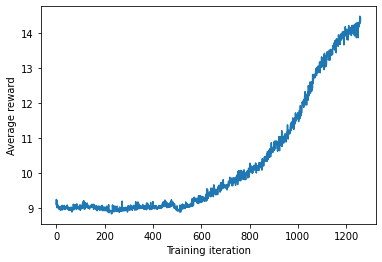

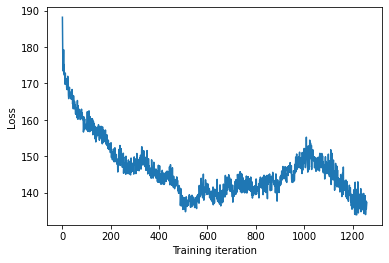

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.11it/s]


Mean value of predictions: 7.953277338675648
Proportion of valid SMILES: 0.87


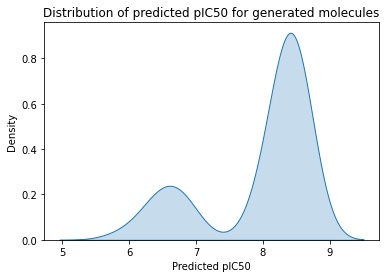

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)N1CCN(CC2CCCCC2)CCN(S(=O)(=O)N2CCN(S(N)(=O)=O)CC2)CC1
CC(=O)N1CCN(Cc2ccccc2S(=O)(=O)N2CCN(C)CC2)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(=O)(=O)c3ccccc3)CC2)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(C)(=O)=O)CC2)CC1
CC(=O)N1CCN(S(=O)(=O)c2ccccc2)CC1


Policy gradient...: 100%|██████████| 15/15 [01:48<00:00,  7.21s/it]


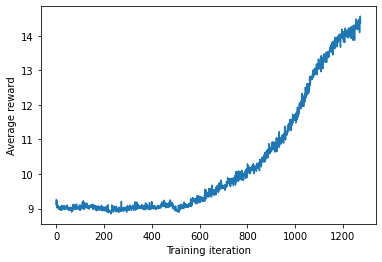

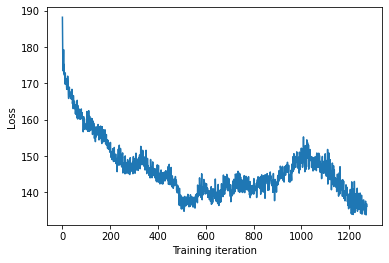

Generating molecules...: 100%|██████████| 200/200 [00:09<00:00, 20.17it/s]


Mean value of predictions: 7.952325914857189
Proportion of valid SMILES: 0.8


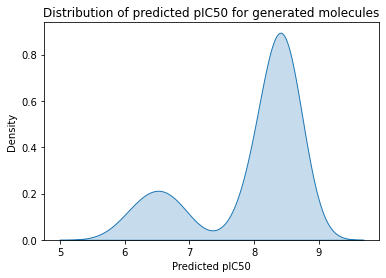

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#CCCNCC=CCN1CCN(S(=O)(=O)c2ccccc2)C=N1
C=C(C)N1CCN(S(=C)C)CC1
C=C(C)c1ccc(S(=O)(=O)N(CCCC)CCN2CCN(S(=O)(=O)c3ccccc3)CC2)cc1
C=CC(=O)Nc1ccc(S(=O)(=O)N2CCN(CCCCC)CC2)cc1
CC(=O)N1CCN(S(=O)(=O)c2ccccc2C(=O)N2CCNCC2)CC1


Policy gradient...: 100%|██████████| 15/15 [01:45<00:00,  7.04s/it]


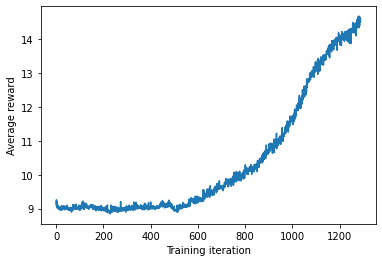

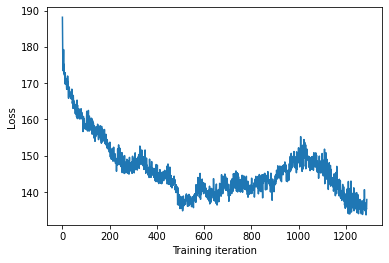

Generating molecules...: 100%|██████████| 200/200 [00:38<00:00,  5.18it/s]


Mean value of predictions: 7.901122814208993
Proportion of valid SMILES: 0.77


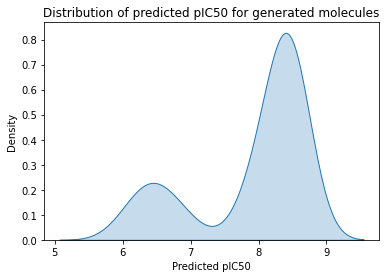

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
CC(=NCc1ccccc1C)N1CCN(S(=O)(=O)c2ccccc2C)CC1
CC(=NNC(=O)OCCN1CCCCC1)NCCNc1cc(C(=O)Nc2ccccc2)on1
CC(=O)N1CCN(S(=O)(=O)c2ccccc2)CCCNs1
CC(=O)N1CCN(S(=O)(=O)c2ccccc2C(c2ccccc2)c2ccccc2)CC1
CC(=O)NC(C)C


Policy gradient...: 100%|██████████| 15/15 [02:26<00:00,  9.78s/it]


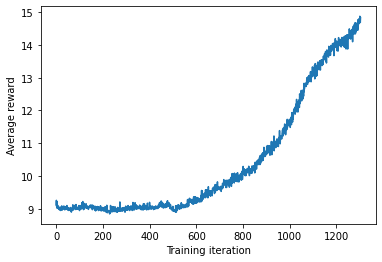

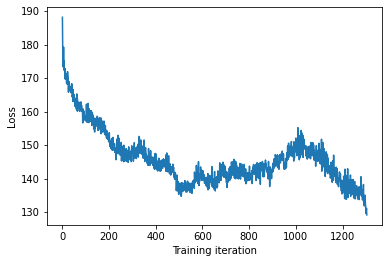

Generating molecules...: 100%|██████████| 200/200 [00:38<00:00,  5.23it/s]


Mean value of predictions: 7.8230844507039725
Proportion of valid SMILES: 0.78


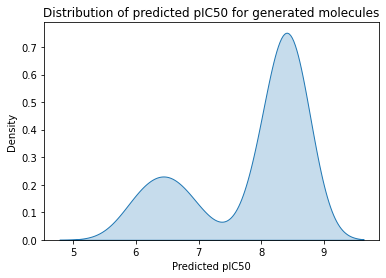

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C
C=C1CCNCC1CN1CCN(c2ccccc2)CC1
C=CCN1C(=O)c2ccccc2N(Cc2ccccc2C)C1=O
CC(=NO)N1CCN(S(=O)(=O)N2CCN(S(=O)(=O)c3ccccc3)CCN2)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(C)(=O)=O)CC2)CC1


Policy gradient...: 100%|██████████| 15/15 [01:55<00:00,  7.73s/it]


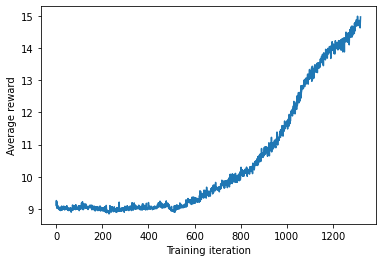

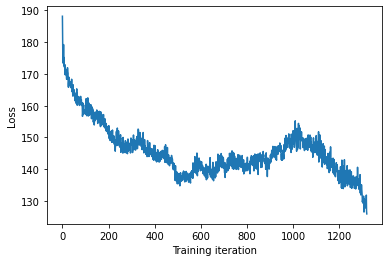

Generating molecules...: 100%|██████████| 200/200 [00:38<00:00,  5.24it/s]


Mean value of predictions: 7.885718547572095
Proportion of valid SMILES: 0.75


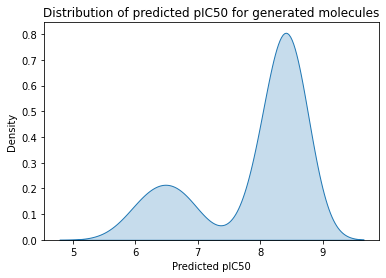

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#CCN1CCN(S(=O)(=O)N2CCN(S(=O)(=O)c3ccccc3)CC2)CC1
CC(=O)N1CCN(Cc2ccncc2)Cc2ccccc2CN(S(=O)(=O)c2ccccc2)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCCNCC2)CC1
CC(=O)N1CCN(S(=O)(=O)c2ccccc2)CC1
CC(C)C(=O)N1CCN(S(=O)(=O)c2ccccc2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:28<00:00,  9.93s/it]


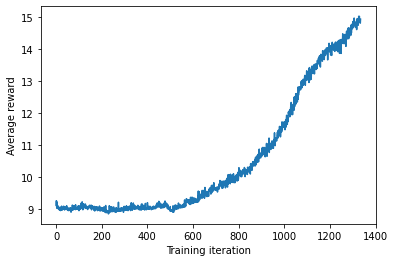

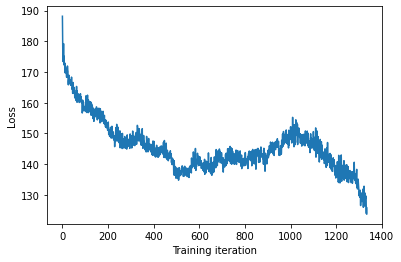

Generating molecules...: 100%|██████████| 200/200 [00:38<00:00,  5.19it/s]


Mean value of predictions: 8.04587686818828
Proportion of valid SMILES: 0.775


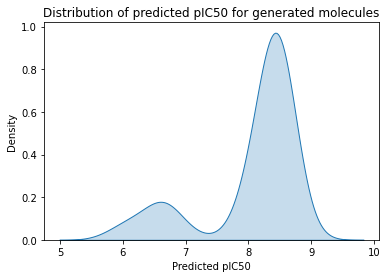

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C
CC(=CCC(C)C(=O)N1CCCN(S(=O)(=O)N2CCN(C(=O)CN(C)CCOCCN(C)CCO)CC2)CC1)CCC(C)C1=CC(=O)c2ccccc21
CC(=O)C1CCN(C(C)(C)C)CCN1
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(=O)(=O)c3ccccc3)CC2)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(C)(=O)=O)CC2)CC1


Policy gradient...: 100%|██████████| 15/15 [01:53<00:00,  7.55s/it]


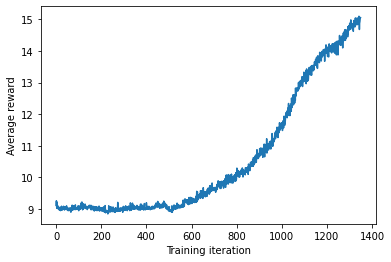

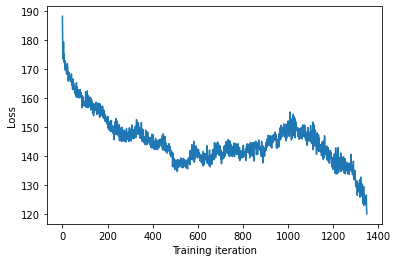

Generating molecules...: 100%|██████████| 200/200 [00:09<00:00, 21.00it/s]


Mean value of predictions: 7.916633764866097
Proportion of valid SMILES: 0.725


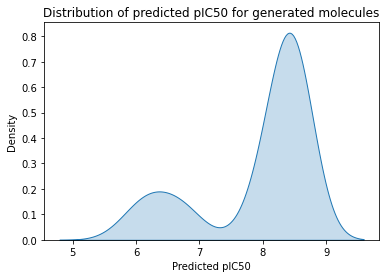

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)N1CCN(S(=O)(=O)CCN2CCCCC2)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(=O)(=O)c3ccccc3)CC2)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCNCC2)CC1
CC(=O)N1CCN(S(=O)(=O)c2ccccc2N2CCN(S(=O)(=O)N3CCCC3)CC2)CC1
CC(=O)N1N=C(c2ccccc2)CC1c1ccccc1


Policy gradient...: 100%|██████████| 15/15 [01:44<00:00,  6.96s/it]


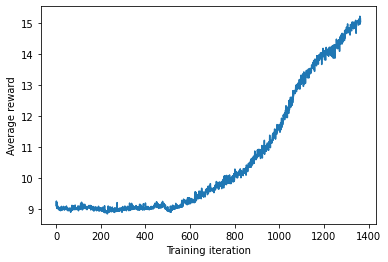

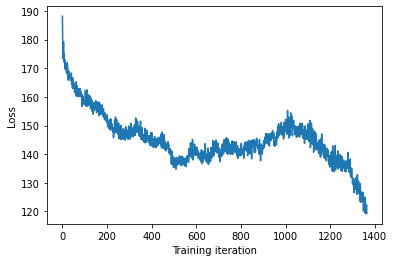

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.11it/s]


Mean value of predictions: 8.084763138804343
Proportion of valid SMILES: 0.835


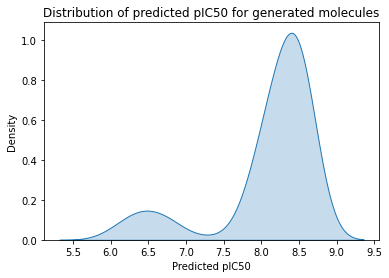

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
CC(=NN1CCN(S(=O)(=O)N2CCNCC2)CC1)S(=O)(=O)N1CCOCC1
CC(=O)N1CCN(S(=O)(=O)n2cccc2)CC1
CC(=O)NCC1SCN(S(=O)(=O)N2CCCCC2)CC1S
CC(C)(C)C1CNCCN1CCN1CCN(S(=O)(=O)c2ccccc2)CC1
CC(C)C(N)C(=O)N1CCN(S(=O)(=O)c2ccccc2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:31<00:00, 10.07s/it]


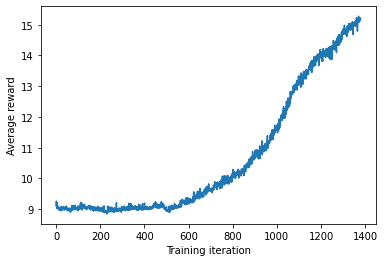

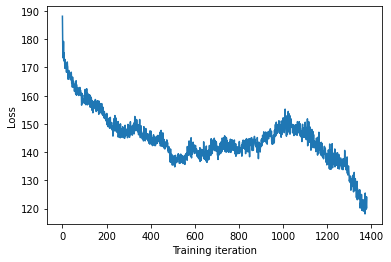

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.12it/s]


Mean value of predictions: 8.060364142801047
Proportion of valid SMILES: 0.81


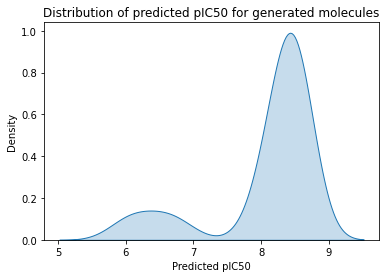

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)N1CCC(N2CCN(S(=O)(=O)N3CCNCC3)CC2)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(=O)(=O)c3ccccc3)CC2)CC1
CC(=O)N1CCN(S(=O)(=O)c2ccccc2)CC1
CC(=O)OCC(=O)N1CCN(S(=O)(=O)N2CCOCC2)CC1
CC(=O)OCC1N(CCC(=O)N2CCN(S(C)(=O)=O)CC2)CCN1c1ccccc1


Policy gradient...: 100%|██████████| 15/15 [02:30<00:00, 10.04s/it]


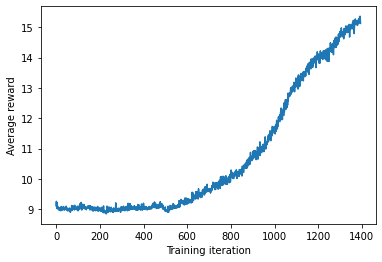

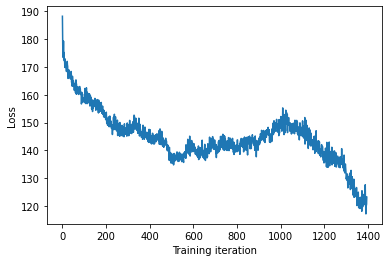

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.12it/s]


Mean value of predictions: 8.096902265735729
Proportion of valid SMILES: 0.815


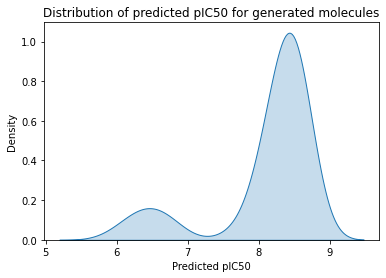

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCNC(=O)C1CCCN1c1ccc(S(=O)(=O)N2CCN(CCCN(CCC)NC(=O)N3CCN(S(=O)(=O)c4ccccc4C)CC3)CC2)cc1
CC(=NNC1=NCCCN1)S(=O)(=O)N1CCCCC1
CC(=O)N1CCN(S(=O)(=O)N2CCCCC2)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(=O)(=O)N3CCN3)CC2)CC1
CC(=O)N1CCN(S(=O)(=O)c2ccccc2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:34<00:00, 10.30s/it]


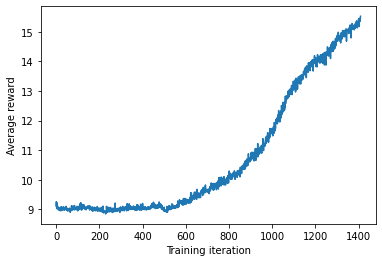

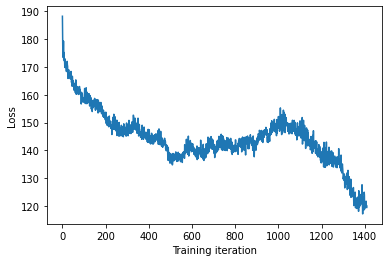

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.02it/s]


Mean value of predictions: 8.112253963545463
Proportion of valid SMILES: 0.875


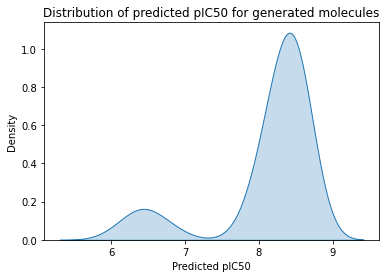

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCS(=O)(=O)N1CCN(S(=O)(=O)N2CCN(CCO)CC2)CC1
C=NN1CCN(S(=O)(=O)N2CCNCC2)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCN3CCCN(CC3)S2(=O)=O)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCNCC2)CC1
CC(=O)N1CCN(S(=O)(=O)c2ccc(S(=O)(=O)N3CCN(S(=O)(=O)N4CCNC4)CC3)cc2C)CC1


Policy gradient...: 100%|██████████| 15/15 [02:34<00:00, 10.30s/it]


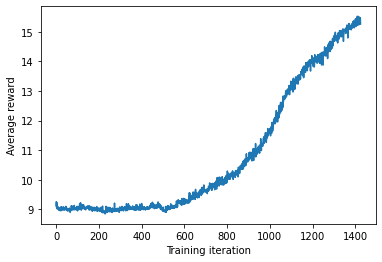

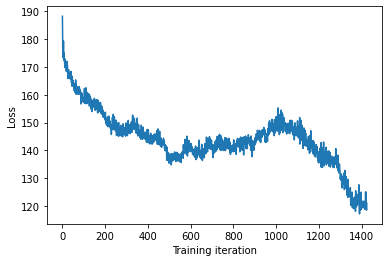

Generating molecules...: 100%|██████████| 200/200 [00:40<00:00,  4.90it/s]


Mean value of predictions: 8.112419562057191
Proportion of valid SMILES: 0.86


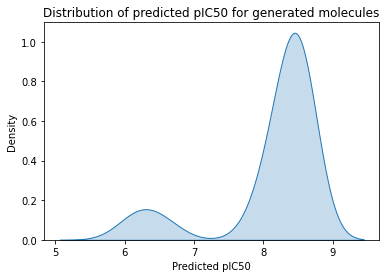

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)N1CCC(N2CCN(S(=O)(=O)c3ccccc3)CC2)=N1
CC(=O)N1CCCN1N(=O)=O
CC(=O)N1CCN(S(=O)(=O)F)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(=O)(=O)N3CCN(S(=O)(=O)N4CCOCC4)CC3)CC2)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(=O)(=O)c3ccccc3)CC2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:36<00:00, 10.43s/it]


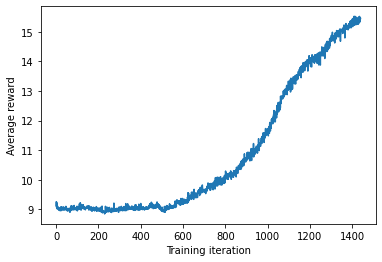

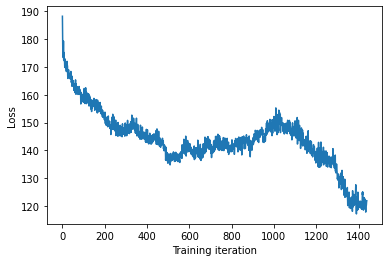

Generating molecules...: 100%|██████████| 200/200 [00:41<00:00,  4.88it/s]


Mean value of predictions: 8.17212237326156
Proportion of valid SMILES: 0.87


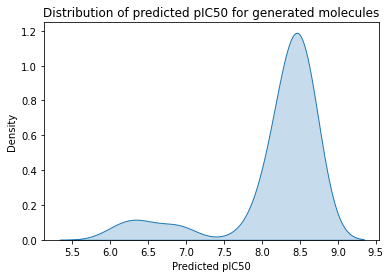

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCCCN1CCN=C1c1ccccc1N1CCN(S(C)(=O)=O)CC1
C=CCS(=O)(=O)N1CCN(S(=O)(=O)N2CCN(S(=O)(=O)N3CCN(CC)CC3)CC2)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(=O)(=O)N3CCN(S(=O)(=O)c4ccccc4C)CC3)CC2)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(=O)(=O)N3CCNCC3)CC2)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(=O)(=O)N3CCOCC3)CC2)C=N1


Policy gradient...: 100%|██████████| 15/15 [02:34<00:00, 10.31s/it]


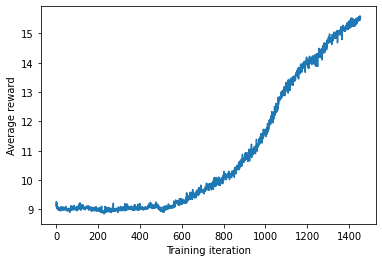

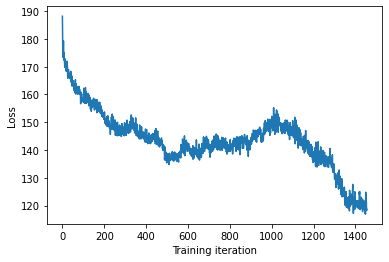

Generating molecules...: 100%|██████████| 200/200 [00:40<00:00,  4.95it/s]


Mean value of predictions: 8.316636725946124
Proportion of valid SMILES: 0.86


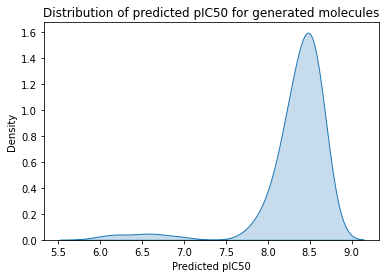

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
CC(=NO)c1ccccc1OCCN1CCN(S(=O)(=O)N2CCN(S(=O)(=O)N3CCCCC3)CC2)CC1
CC(=O)N1CCN(C(=O)CN2CCN(S(=O)(=O)c3ccccc3)CC2)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(=O)(=O)N3CCOCC3)CC2)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(C)(=O)=O)CC2)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCN2CCN2CCN(S(=O)(=O)N3CCCC3)CC2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:37<00:00, 10.51s/it]


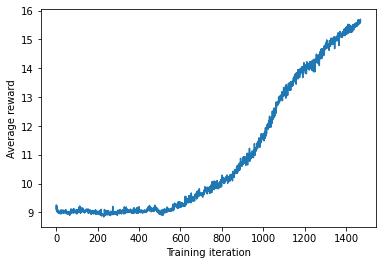

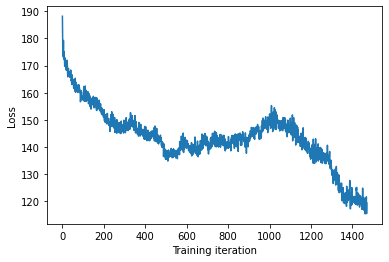

Generating molecules...: 100%|██████████| 200/200 [00:41<00:00,  4.86it/s]


Mean value of predictions: 8.088804768899669
Proportion of valid SMILES: 0.865


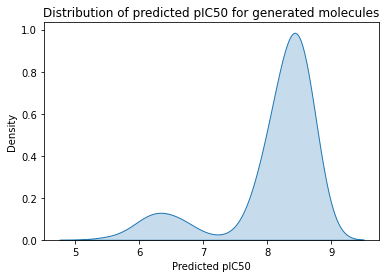

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
CC(=NN1CCN(C2CCNCC2)CC1)S(=O)(=O)N(C)CCO
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(=O)(=O)N3CCN(S(=O)(=O)c4ccccc4)CC3)CC2)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(=O)(=O)N3CCc4ccccc43)CC2)CC1
CC(=O)Oc1ccc(S(=O)(=O)N2CCN(S(=O)(=O)N3CCCC3)CC2)cc1
CC(C(=O)NN=C1CCN(S(=O)(=O)N2CCN(S(=O)(=O)N3CCN(S(=O)(=O)N4CCN(S(=O)(=O)c5ccccc5)CC4)CC3)CC2)CC1)S1=CC=CC1=O


Policy gradient...: 100%|██████████| 15/15 [02:15<00:00,  9.06s/it]


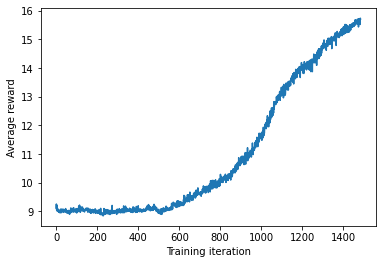

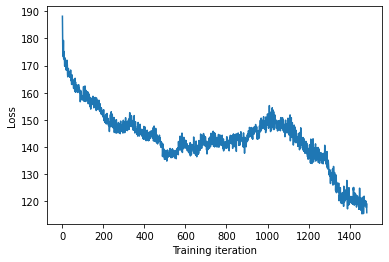

Generating molecules...: 100%|██████████| 200/200 [00:42<00:00,  4.71it/s]


Mean value of predictions: 8.2912500948146
Proportion of valid SMILES: 0.885


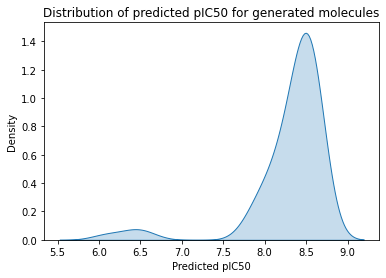

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=S(=O)(N1CCN(S(=O)(=O)CC)CC1)N1CCN(S(=O)(=O)N2CCN(S(=O)(=O)N3CCN(CCCCC)CC3)CC2)CC1
CC(=NNC(=O)CN1CCOCC1)NN1CCN2CCN(CC2)S(=O)(=O)N2CCCC(C)CC2N(C)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(=O)(=O)N3CCN(S(=O)(=O)N4CCN(C(=O)c5ccccc5)CC4)CC3)CC2)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(=O)(=O)N3CCN(S(=O)(=O)N4CCN(S(C)(=O)=O)CC4)CC3)CC2)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(=O)(=O)N3CCN(S(=O)(=O)N4CCN(S(N)(=O)=O)CC4)CC3)CC2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:15<00:00,  9.01s/it]


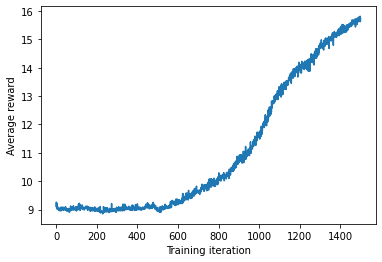

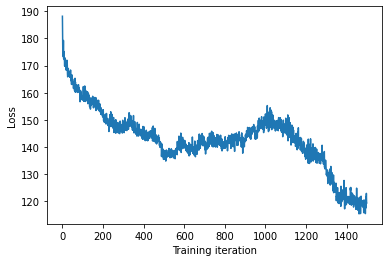

Generating molecules...: 100%|██████████| 200/200 [00:41<00:00,  4.83it/s]


Mean value of predictions: 8.280316199458905
Proportion of valid SMILES: 0.83


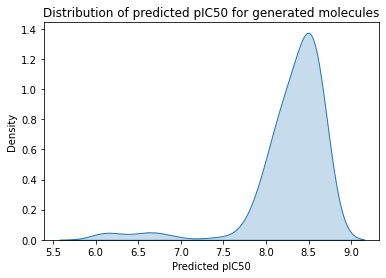

Sample trajectories:
CC(=NNC(=O)C1CNCCO1)S(=O)(=O)N1CCNCC1
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(=O)(=O)N3CCN(S(=O)(=O)c4ccccc4)CC3)CC2)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(=O)(=O)N3CCOCC3)CC2)CC1
CC(=O)N1CCN(S(=O)(=O)N2CCN(S(=O)(=O)c3ccccc3)CC2)CC1
CC(=O)NCCN1CCN(S(=O)(=O)N2CCN(S(=O)(=O)N3CCN(S(C)(=O)=O)CC3)CC2)CC1


In [31]:
for i in range(n_iterations):
    for j in trange(n_policy, desc='Policy gradient...'):
        cur_reward, cur_loss = RL_max.policy_gradient(gen_data, get_features=get_fp)
        rewards_max.append(simple_moving_average(rewards_max, cur_reward)) 
        rl_losses_max.append(simple_moving_average(rl_losses_max, cur_loss))
    
    plt.plot(rewards_max)
    plt.xlabel('Training iteration')
    plt.ylabel('Average reward')
    plt.show()
    plt.plot(rl_losses_max)
    plt.xlabel('Training iteration')
    plt.ylabel('Loss')
    plt.show()
        
    smiles_cur, prediction_cur = estimate_and_update(RL_max.generator, 
                                                     my_predictor, 
                                                     n_to_generate,
                                                     get_features=get_fp)
    print('Sample trajectories:')
    for sm in smiles_cur[:5]:
        print(sm)

Generating molecules...: 100%|██████████| 10000/10000 [35:41<00:00,  4.67it/s]


Mean value of predictions: 8.139959450414558
Proportion of valid SMILES: 0.6069


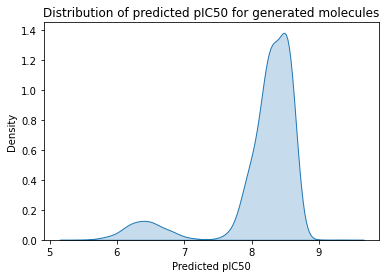

In [32]:
smiles_biased_max, prediction_biased_max = estimate_and_update(RL_max.generator, 
                                                           my_predictor,
                                                           n_to_generate=10000)

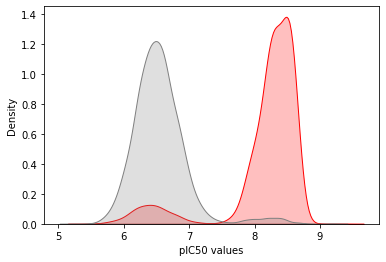

In [33]:
sns.kdeplot(prediction_biased_max,label='Maximized', shade=True, color='red')
sns.kdeplot(prediction_unbiased, label='Unbiased', shade=True, color='grey')

plt.xlabel('pIC50 values')
plt.show()

### Minimizing pIC50 for JAK2

Next we will minimize the pIC50 fpr JAK2.

The reward function we will use here is$$
R(s) = \exp(\dfrac{-predictor(s)}{3} + 3) 
$$

In [34]:
def get_reward_min(smiles, predictor, invalid_reward=0.0, get_features=get_fp):
    mol, prop, nan_smiles = predictor.predict([smiles], get_features=get_features)
    if len(nan_smiles) == 1:
        return invalid_reward
    return np.exp(-prop[0]/3 + 3)

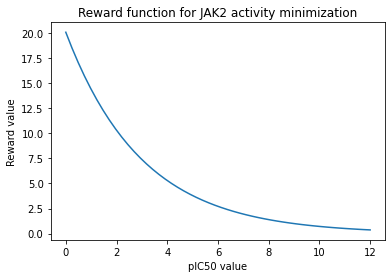

In [35]:
x = np.linspace(0, 12)
y = np.exp(-x/3 + 3)

plt.plot(x, y)
plt.xlabel('pIC50 value')
plt.ylabel('Reward value')
plt.title('Reward function for JAK2 activity minimization')
plt.show()

Making a copy of the generator that will be optimized

In [36]:
my_generator_min = StackAugmentedRNN(input_size=gen_data.n_characters, hidden_size=hidden_size,
                                 output_size=gen_data.n_characters, layer_type=layer_type,
                                 n_layers=1, is_bidirectional=False, has_stack=True,
                                 stack_width=stack_width, stack_depth=stack_depth, 
                                 use_cuda=use_cuda, 
                                 optimizer_instance=optimizer_instance, lr=lr)

my_generator_min.load_model(model_path)

In [37]:
RL_min = Reinforcement(my_generator_min, my_predictor, get_reward_min)

In [38]:
rewards_min = []
rl_losses_min = []

Policy gradient...: 100%|██████████| 15/15 [01:55<00:00,  7.70s/it]


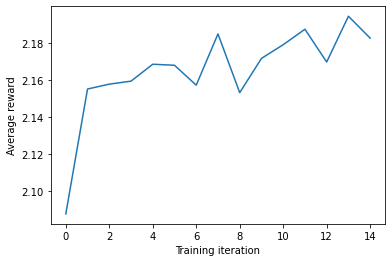

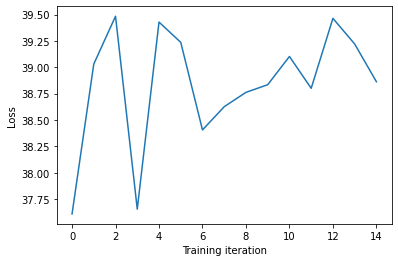

Generating molecules...: 100%|██████████| 200/200 [00:11<00:00, 17.38it/s]


Mean value of predictions: 6.572070877588741
Proportion of valid SMILES: 0.6


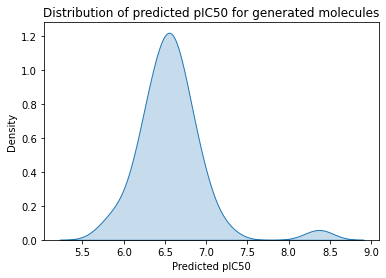

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCNC1CC(c2nc3ccccc3[nH]2)N(C)C1
C=CCOc1ccc(NC(=N)N2CCCCCC2)cc1
C=CN1C(=O)N(C)c2nc(C(C)(C)C)c(-c3ccc(OC)cc3)nc21
CC(=O)Nc1cc(OC(=O)N(c2ccccc2)C2CCCC2)cc(-c2ccccc2)c1
CC(=O)Nc1ccc(C(=O)NN2C(=O)C(Cc3ccc(OCc4ccccc4)cc3)N=C2SCC(N)=O)cc1


Policy gradient...: 100%|██████████| 15/15 [01:53<00:00,  7.58s/it]


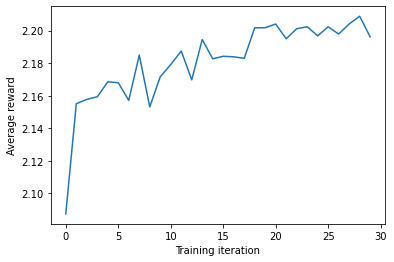

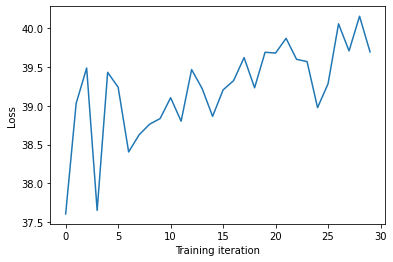

Generating molecules...: 100%|██████████| 200/200 [00:11<00:00, 17.58it/s]


Mean value of predictions: 6.567879103832907
Proportion of valid SMILES: 0.655


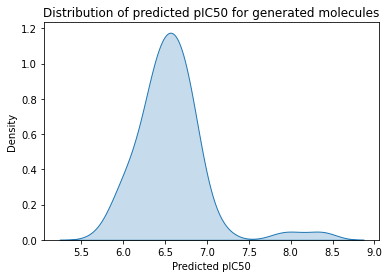

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#CCN1CCc2cc(C(=O)NCCCCCCN3CCN(C)CC3)ccc2N1C(=Nc1ccccc1)c1ccccc1
C=CCCC1c(N2CC(=O)Nc3ccccc32)c2ccccc2nc2c1c(C)nc1c(C)ccnc12
CC(=Cc1ccccc1)C1CN=C2SC(=Cc3c[nH]c4ccccc34)C(=O)N21
CC(=O)NNC=Cc1ccc(O)c(O)c1
CC(=O)OCC(=Nc1ccc(C)cc1)C1C(OCNC(=O)NCC(C)C)C1(C)O


Policy gradient...: 100%|██████████| 15/15 [01:53<00:00,  7.54s/it]


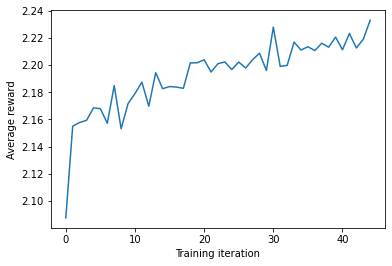

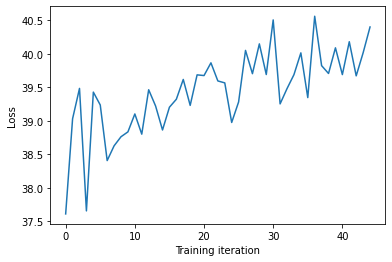

Generating molecules...: 100%|██████████| 200/200 [00:10<00:00, 18.21it/s]


Mean value of predictions: 6.555788791265008
Proportion of valid SMILES: 0.67


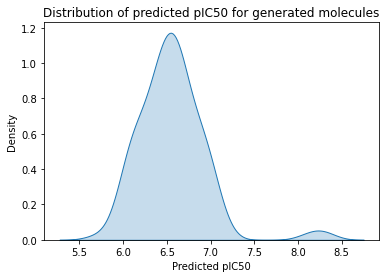

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C(=CN1CCN(Cc2ccccc2OCc2ccccc2)CC1)c1ccc2ccccc2c1
C=C(C(=O)N(c1ccc2c(c1)CCC2)C1CC1)c1ccc(C(=O)OC)cc1
C=C(C)N=C(CCC(N)=O)NC(=O)C1(C(=O)NC(CCC(C)O)C(=O)NCCCCCCCCCCCCCCCC)CCN(C(=O)NO)C2CNC1C2
C=C(C1CCOc2ccccc21)N1N=C(C(=O)O)CC1c1nc(CC)no1
C=C1CCC(O)C(C)C(O)C(C)C2(C)C1CCC2C(O)CC=CC


Policy gradient...: 100%|██████████| 15/15 [01:50<00:00,  7.39s/it]


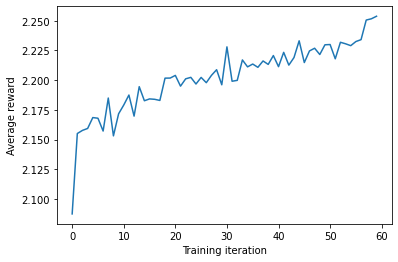

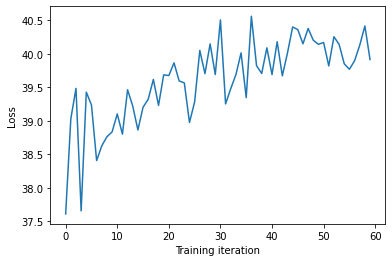

Generating molecules...: 100%|██████████| 200/200 [00:11<00:00, 17.51it/s]


Mean value of predictions: 6.555880671126498
Proportion of valid SMILES: 0.665


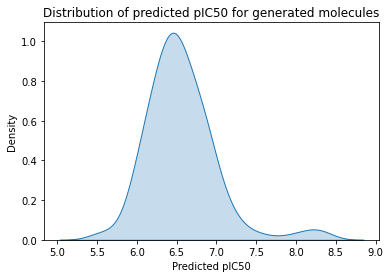

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#CCCCCCCCC(NC(=O)OCc1ccccc1)C(O)CN1CCC(N)NC1=O
C#CCOc1cc(F)c2c(c1)C(=O)SCC2
C=CC=CCOC(NC(=O)C(Cc1ccccc1)NC(=O)C(N)Cc1ccccc1)C(=O)NC(Cc1CCCOC1)C(NC(=O)C(C(=O)O)C(NC(=O)C(CCSC)Cc1ccccc1)C(C)C)C(C)C
C=CCN(C(=O)C1CCCCC1=O)c1ccccc1
CC(=NNC(=O)c1cc(C)cc(S(C)(=O)=O)c1)C1CC1


Policy gradient...: 100%|██████████| 15/15 [01:51<00:00,  7.44s/it]


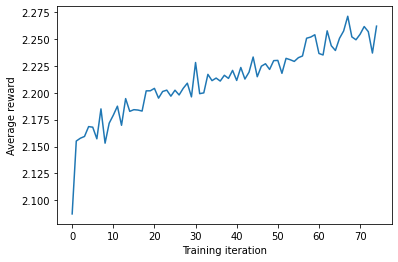

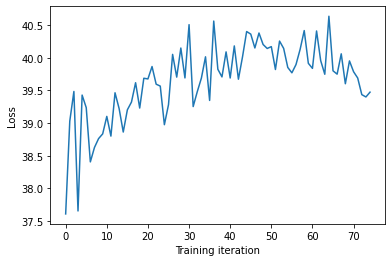

Generating molecules...: 100%|██████████| 200/200 [00:11<00:00, 17.41it/s]


Mean value of predictions: 6.576354052765632
Proportion of valid SMILES: 0.675


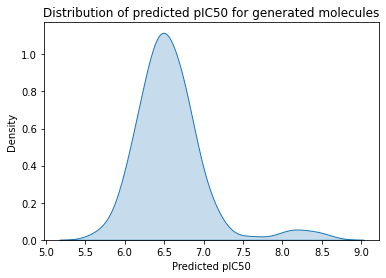

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C1CCC(CN2CCN(C3=NCCO3)CC2)CC1
C=C(C)C1=CN(C(C)Cc2ccccc2)CBS1
C=CCC1(O)CC(NC(=O)NC)CC1c1ccc(Cl)cc1
CC(=CC(=O)C(=O)N1CCN(c2ccccc2)CC1)Cc1ccc(NC(=O)NCCCNCCCNC(=O)CCCCC(=O)O)cc1
CC(=Nc1ccsc1)C1(CO)CCCN1CC(=O)O


Policy gradient...: 100%|██████████| 15/15 [01:51<00:00,  7.46s/it]


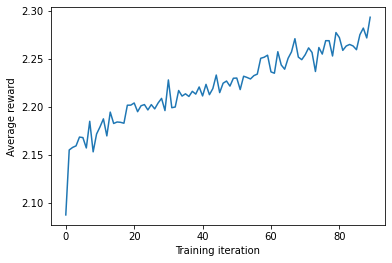

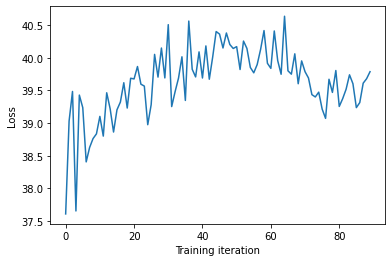

Generating molecules...: 100%|██████████| 200/200 [00:11<00:00, 17.47it/s]


Mean value of predictions: 6.535084870428586
Proportion of valid SMILES: 0.74


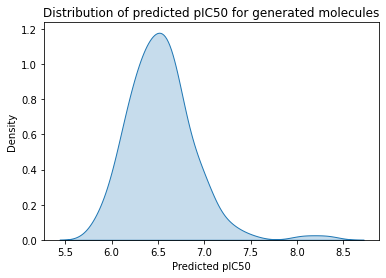

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCc1ccc(O)cc1C(C)(C)CN(C)CCOCCC
CC(=O)N(CCCCCCNC(=O)CCc1ccccc1)OCC1CCCCC1
CC(=O)N(CCc1c(C(=O)O)ccnc1N1CCN(C)CC1)Cc1ccccc1
CC(=O)NC(C(=O)NC(Cc1ccccc1)C(N)=O)C(C)C
CC(=O)NC1C=C(C)CC2C(=NOC(c3ccccc3)c3ccccc3)N(C1=O)C2c1ccco1


Policy gradient...: 100%|██████████| 15/15 [01:49<00:00,  7.27s/it]


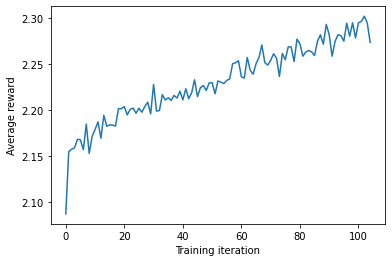

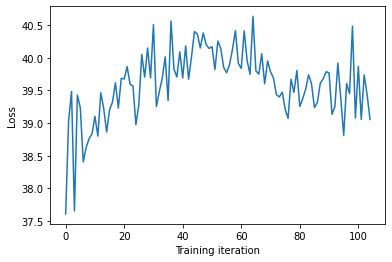

Generating molecules...: 100%|██████████| 200/200 [00:11<00:00, 17.86it/s]


Mean value of predictions: 6.477343658726475
Proportion of valid SMILES: 0.765


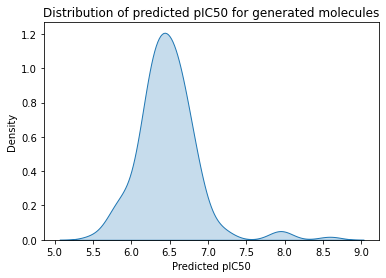

Sample trajectories:

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]


C=CCC(Oc1ccccc1O)c1ccccc1
CC(=O)Nc1ccc(OCC(=O)N(C)c2ccccc2)cc1
CC(=O)Nc1cccc2c(OCCCCCC(=O)N=Cc3ccccn3)nccc12
CC(C(=O)N1CCOCC1)N(Cc1ccccc1)c1cccc(N2C=CC=CC2=O)c1
CC(C)(C)CC=C(C#CC=Cc1cccnc1)C(=O)c1ccccn1


Policy gradient...: 100%|██████████| 15/15 [01:49<00:00,  7.28s/it]


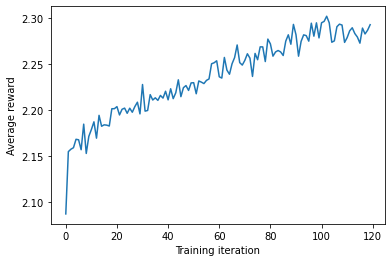

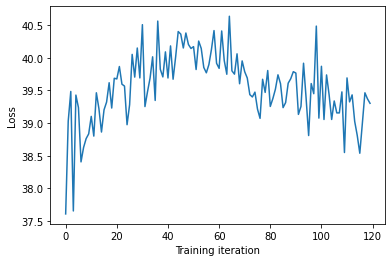

Generating molecules...: 100%|██████████| 200/200 [00:11<00:00, 17.62it/s]


Mean value of predictions: 6.51358291533436
Proportion of valid SMILES: 0.71


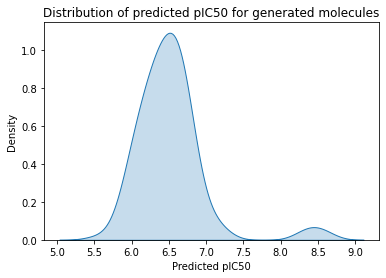

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCC1=CC(=O)C(O)(C(C)C)C(C)(C)C1
CC(=O)N1CCc2cc(OCCCN3CC(C)Cc4ccccc43)ccc2C1=O
CC(=O)NN1C2=C(c3ccccc3C=CC2=O)C2CCCCC21
CC(C)(C)C(NC(=O)c1ccc(Nc2nc(C(F)(F)F)sc2NC(=O)CCCc2ccc(F)cc2)cc1)c1ccccn1
CC(C)(C)OC(=O)N1CCCc2ccccc21


Policy gradient...: 100%|██████████| 15/15 [01:48<00:00,  7.21s/it]


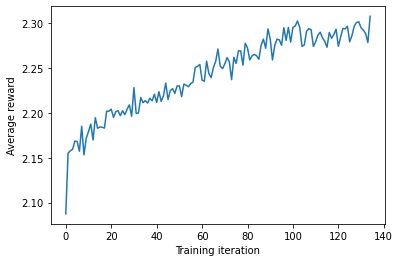

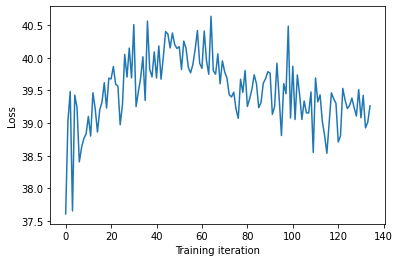

Generating molecules...: 100%|██████████| 200/200 [00:09<00:00, 20.43it/s]


Mean value of predictions: 6.435924106771639
Proportion of valid SMILES: 0.72


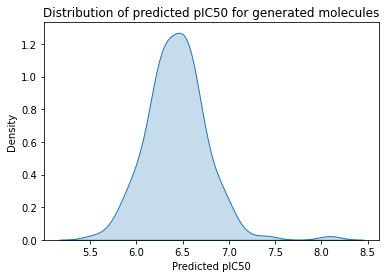

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C1=C(O)C(=O)CON=C1F)c1ccc(-c2ccccc2)cc1
C=CC(=O)Oc1ccc(C(=CCOC(C(C)OC(C)=O)N(C)C(c2ccccc2)c2ccccc2)c2c[nH]cn2)cc1
CC(=O)Nc1ncc(C(=O)NCCc2ccccc2)o1
CC(=O)OC1CC(N2C(=O)C=C(C)C2O)NC(=O)CC1(C)c1ccccc1
CC(C)(C)NCCCOc1ccc(C=Cc2cccc3ccncc23)cc1


Policy gradient...: 100%|██████████| 15/15 [01:47<00:00,  7.18s/it]


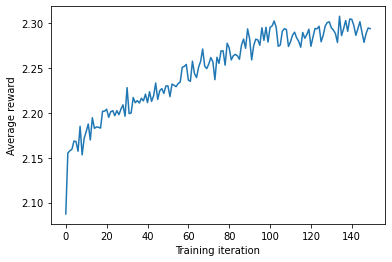

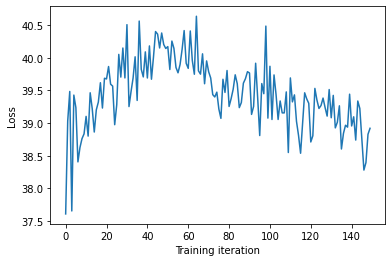

Generating molecules...: 100%|██████████| 200/200 [00:10<00:00, 19.93it/s]


Mean value of predictions: 6.533474657080649
Proportion of valid SMILES: 0.76


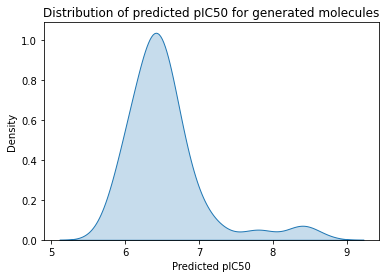

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCN(N)c1ccc(O)c(C(=O)NC2CC2)c1
C=CCN1C(=O)C(c2ccc(OC)cc2)OC1OCC(=O)NCCCNCc1ccccc1
CC(=O)N(CC(=O)Nc1ccc(C(F)(F)F)cn1)c1ccc(C(=O)O)cc1
CC(=O)NN1CCN(c2ccc(N3CCCNCC3)cc2)C1
CC(=O)Nc1cccc(C(=O)NO)c1


Policy gradient...: 100%|██████████| 15/15 [01:47<00:00,  7.18s/it]


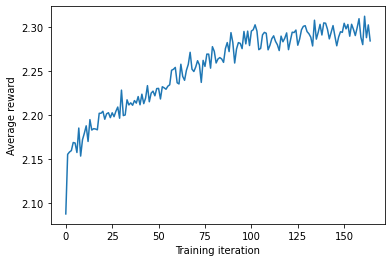

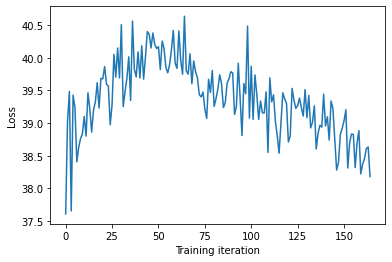

Generating molecules...: 100%|██████████| 200/200 [00:10<00:00, 18.89it/s]


Mean value of predictions: 6.4947466369923585
Proportion of valid SMILES: 0.78


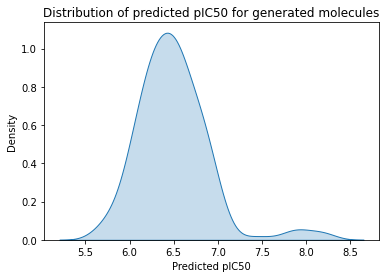

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C1=C(Cc2nc3ccccc3s2)c2cnccc2Oc2ccccc21
C=CCN(Cc1nnc(N2CCN(C)CC2)[nH]c2ccccc12)NCCO
C=CCNC(=O)c1ccc(C#N)c2c1OCCCO2
C=CCNS(=O)(=O)c1ccc(NC(=O)COC(=O)c2cc3ccccc3n2C)cc1
C=CCOc1cccc(C2CCNC=C2C(=O)N(CC)CC)c1


Policy gradient...: 100%|██████████| 15/15 [01:47<00:00,  7.14s/it]


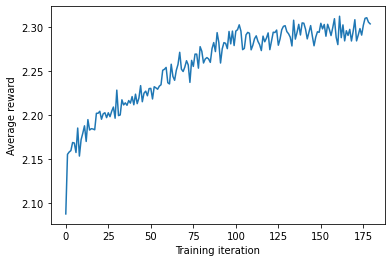

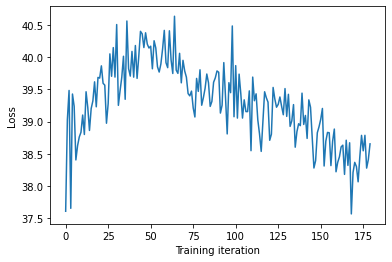

Generating molecules...: 100%|██████████| 200/200 [00:10<00:00, 19.56it/s]


Mean value of predictions: 6.452256495932352
Proportion of valid SMILES: 0.755


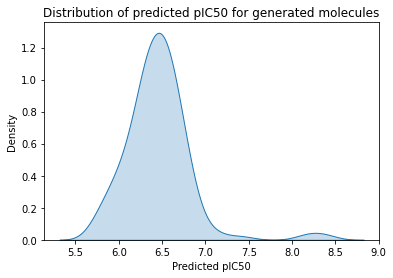

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#CC1(c2ccccn2)CCN(C(=O)c2cccc(N(=O)=O)c2)CC1
C=CCC1(CCCC)CCc2cc(OC)c(OC)c(OC)c21
C=CCN1CCCCCCCCCCCCCCOn2c(c3ccccc3)c(Cl)cccc(c3ccccc3)CN2CC1
C=CCn1cc2c(c1)-c1ccccc1C(=O)N2
CC(C)(C)COC(=O)N1CCCC1c1ccncc1


Policy gradient...: 100%|██████████| 15/15 [01:46<00:00,  7.11s/it]


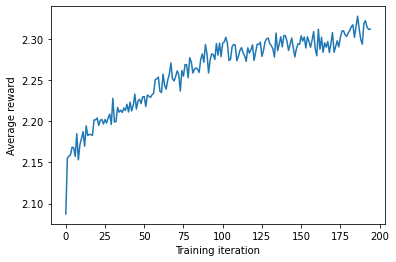

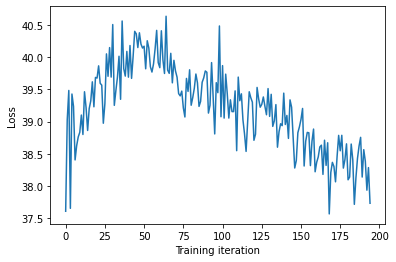

Generating molecules...: 100%|██████████| 200/200 [00:10<00:00, 18.91it/s]


Mean value of predictions: 6.514270739724597
Proportion of valid SMILES: 0.7


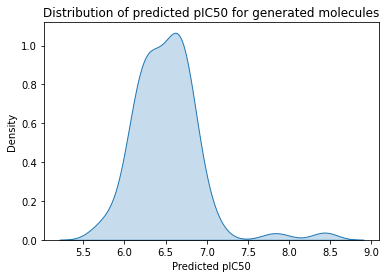

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C1CCC2(O)C(CCC)CC12
CC(=O)N1CCCc2ccccc21
CC(=O)N1CCc2c(C)N(C)C(=O)C2C1Cc1ccccc1
CC(=O)NCCN(C)O
CC(C)(C)c1ccnc(NC2CCCO2)n1


Policy gradient...: 100%|██████████| 15/15 [01:46<00:00,  7.07s/it]


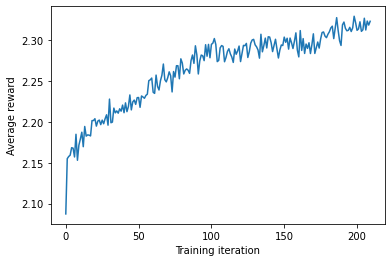

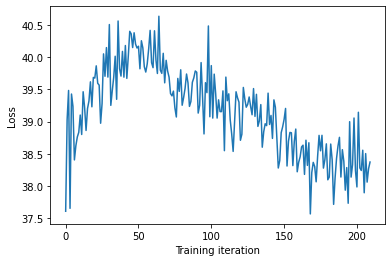

Generating molecules...: 100%|██████████| 200/200 [00:10<00:00, 19.25it/s]


Mean value of predictions: 6.535152685356814
Proportion of valid SMILES: 0.775


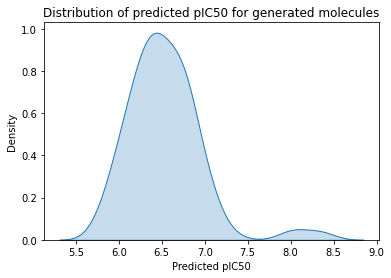

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C)CN1CC2(CCCN2c2cccc3ncccc23)CN1CCC(O)C(O)c1ccccc1
C=CCN(C(=O)C1CCCCC1)N1CCC(Cc2ccc(Cl)cc2)CC1
C=CCN(CC)C1CCC2C3CC4(C)CC(C(=O)O)OC(=O)C4(C)C3(C)CCC21C
CC(=O)Nc1ccc(C)c(N2CCNCC2)c1
CC(=O)Nc1ccc(N(=O)=O)c2ccccc12


Policy gradient...: 100%|██████████| 15/15 [01:44<00:00,  6.99s/it]


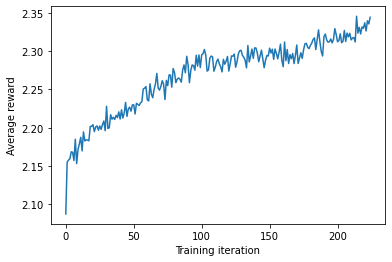

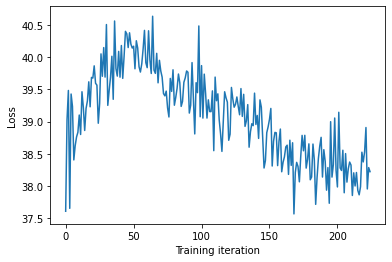

Generating molecules...: 100%|██████████| 200/200 [00:09<00:00, 20.41it/s]


Mean value of predictions: 6.433866024613326
Proportion of valid SMILES: 0.76


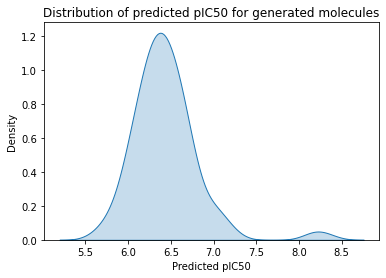

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCC(Cc1cccnc1)N1CCN(c2cc(OC)ccc2OC)C1
C=CCCC1=CC(Cl)=C2C=C(C=CCo2)c2ccccc21
C=CCN1CCC(NC(=O)c2cccc(S(=O)(=O)N3CCN(C)CC3)c2)CC1
C=CCOC(=O)CCCCCCC=C1CCN1C
CC(=O)C(CN1C=CC(N)=NC1=O)NC1CCCC1


Policy gradient...: 100%|██████████| 15/15 [01:46<00:00,  7.08s/it]


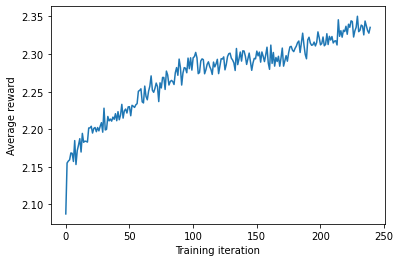

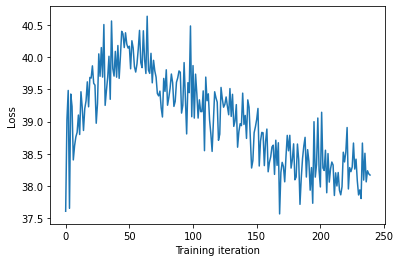

Generating molecules...: 100%|██████████| 200/200 [00:09<00:00, 20.37it/s]


Mean value of predictions: 6.505864500495257
Proportion of valid SMILES: 0.745


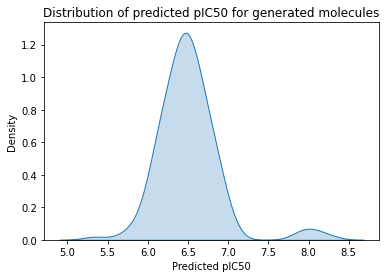

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)NC(Cc1ccc(C)cc1)C(=O)NCC1CCCCC1
CC(=O)NC1CCCCC1NC(=O)c1cccc(N(=O)=O)c1
CC(=O)NCCOc1ccc(CNC(=O)c2ccccn2)cc1
CC(C)(C)C(=O)NCc1ccc(Cl)cc1
CC(C)CC(NC(=O)C(Cc1ccccc1)NC(=O)C(C)N)C(=O)NC(CCC(=O)NC(C)C)C(=O)NC(CC(=O)O)C(=O)O


Policy gradient...: 100%|██████████| 15/15 [01:46<00:00,  7.09s/it]


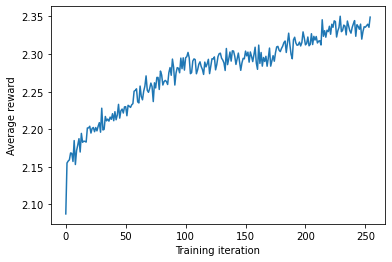

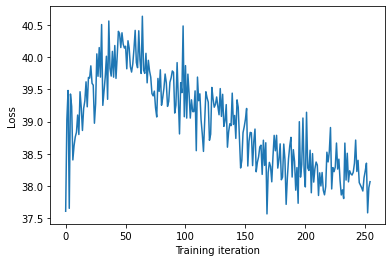

Generating molecules...: 100%|██████████| 200/200 [00:10<00:00, 19.86it/s]


Mean value of predictions: 6.473621595170964
Proportion of valid SMILES: 0.79


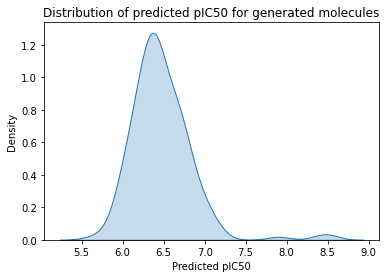

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C)C1CCC(=CC=CC2CCC(C)(C)C2)CC1
C=CCN1CCN(C(=O)c2ccn(CCOCCOC)c2C)CC1
C=CCOc1ccccc1C(=O)NNCCCCOc1ccc(C(=N)N)cc1
C=CCs1CCCC1OC
CC(=O)N1CC(CC(=O)Nc2cccc(C(N)=O)c2)c2ccccc21


Policy gradient...: 100%|██████████| 15/15 [01:45<00:00,  7.01s/it]


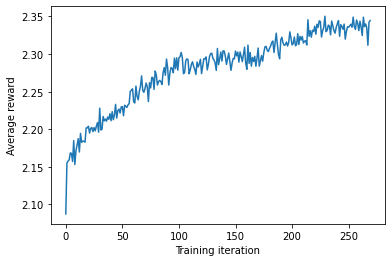

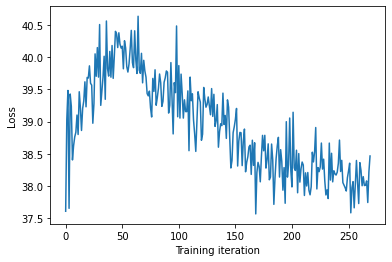

Generating molecules...: 100%|██████████| 200/200 [00:10<00:00, 19.50it/s]


Mean value of predictions: 6.44498651416894
Proportion of valid SMILES: 0.74


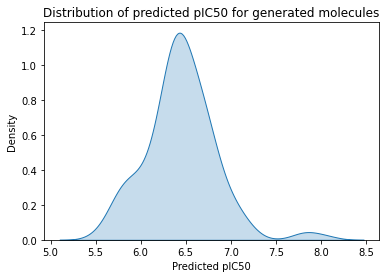

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CC=CC1=NN(CC(=O)O)C(=O)C=C1
C=CCNC(=O)OCCOC(=O)CCCCCCCCCCCCCCCCCC
C=CCOc1cc(C=CC(=O)Nc2ccc(Cl)cc2Cl)ccc1OC
CC(=O)CCCCC1CCCC2C(O)COC(C)CCC2(C)C(C)(O)C(O)C(C)O1
CC(=O)N1CCCCC1c1cccnc1


Policy gradient...: 100%|██████████| 15/15 [01:47<00:00,  7.19s/it]


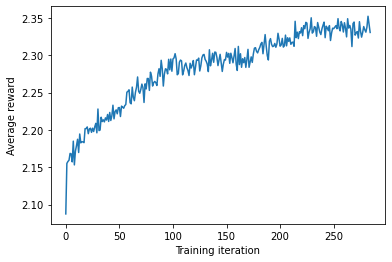

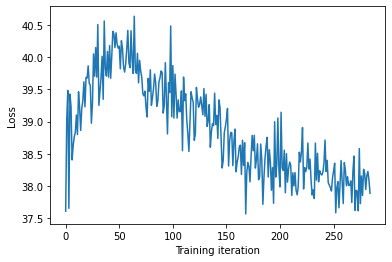

Generating molecules...: 100%|██████████| 200/200 [00:10<00:00, 18.94it/s]


Mean value of predictions: 6.4735059604346485
Proportion of valid SMILES: 0.8


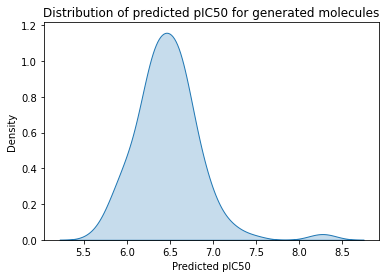

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C)C(O)C=CC(=Cc1ccccc1)C(=O)NO
C=C(C)N(Cc1ccccc1O)C1CC(OC)C1(C)C
C=CCC(C)C(O)CCN(C)CCc1c(O)cc2cc(N(=O)=O)ccc2c1OC
C=CCN(C(=O)Nc1ccc(Cl)cc1)S(=O)(=O)c1ccc(C)cc1
CC(=NNC(=O)Nc1ccccc1)c1ccccc1


Policy gradient...: 100%|██████████| 15/15 [01:46<00:00,  7.07s/it]


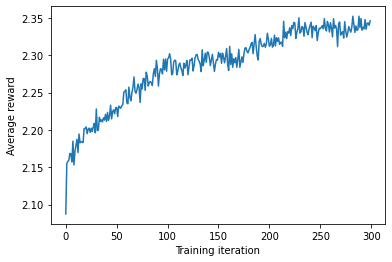

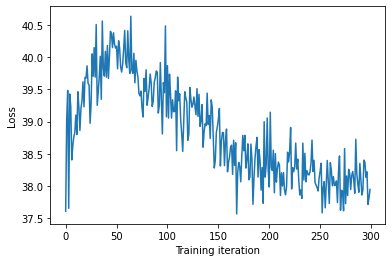

Generating molecules...: 100%|██████████| 200/200 [00:11<00:00, 18.09it/s]


Mean value of predictions: 6.5034105583617325
Proportion of valid SMILES: 0.795


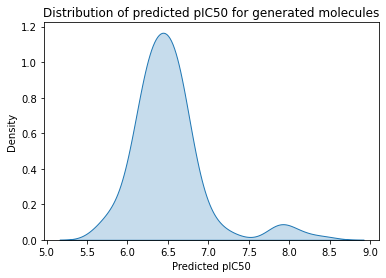

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#CCCCCCCCCCCCCCCCCCCCCCC(=O)NCCC(=O)O
C=C1SC(=N)NC1c1ccc(F)cc1OCc1ccccc1
C=CCN(c1ccc(C(C)C)cc1)c1cccc(OC)c1
C=CCNC(=O)c1cncc(-c2ccccc2)c1
CC(=O)Nc1ccc(C2=CC(=O)c3nc(CCCc4ccccc4)n(Cc4ccccc4)c3s2)cc1


Policy gradient...: 100%|██████████| 15/15 [01:44<00:00,  6.96s/it]


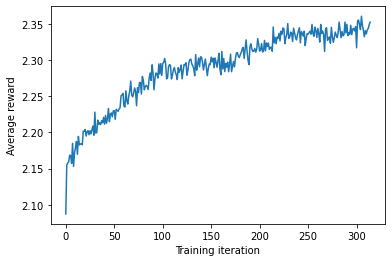

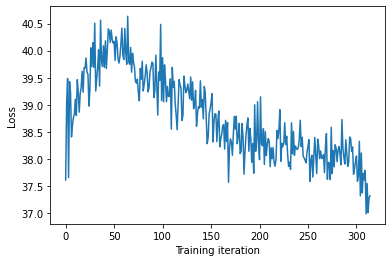

Generating molecules...: 100%|██████████| 200/200 [00:10<00:00, 19.03it/s]


Mean value of predictions: 6.4808034856432055
Proportion of valid SMILES: 0.8


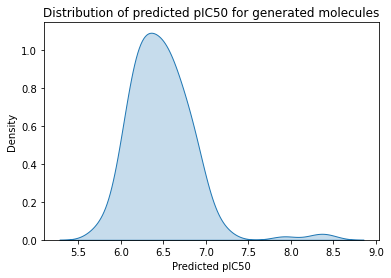

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCC1(O)CC(C)(C(=O)NCC(C)CCCCCCCCCCCCCC)O1
C=CCCCC(=O)Nc1cnc2ccc(C3CCCCC3)cc2c1
C=CCN(C(C)=O)C(=S)C1=C(N)c2ccc(OC)cc21
C=CCN(Cc1cc(C)cc2c1C(=O)C(Oc1ccccc1)=C2)S(=O)(=O)c1ccc(OC)cc1
CC(=O)NC1(c2ccccn2)CCCCS1=N


Policy gradient...: 100%|██████████| 15/15 [01:44<00:00,  6.94s/it]


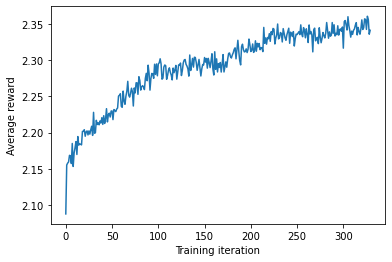

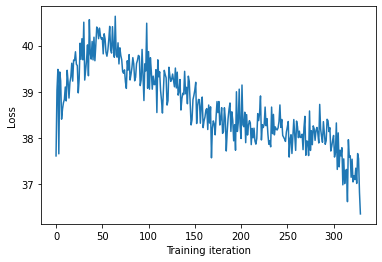

Generating molecules...: 100%|██████████| 200/200 [00:09<00:00, 20.42it/s]


Mean value of predictions: 6.465127955286889
Proportion of valid SMILES: 0.86


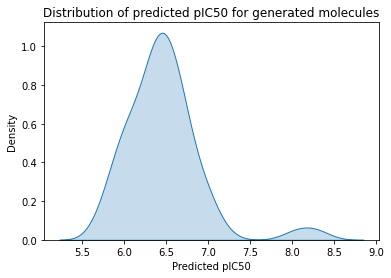

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCC1CCC(C(C)(C)CN2CCC(C)C(CCCCc3ccccc3)C2)C1
C=CCOc1ccccc1
CC(=NNC(=O)Nc1ccccc1)c1ccccc1
CC(=O)C1=N(=O)N2CCCN2C(=O)C(C#N)C(c2ccccc2F)C1C(C)O
CC(=O)CC(NC(CC(C)C)C(=O)NC(C(=O)OC1COC(C)NC1=O)C(C)C)C(C)C


Policy gradient...: 100%|██████████| 15/15 [01:43<00:00,  6.92s/it]


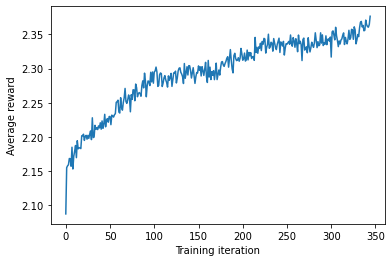

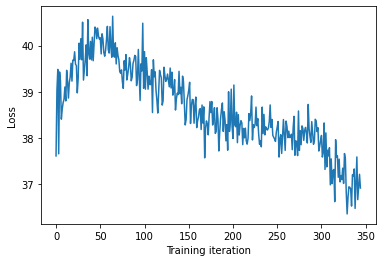

Generating molecules...: 100%|██████████| 200/200 [00:09<00:00, 20.24it/s]


Mean value of predictions: 6.44498501183619
Proportion of valid SMILES: 0.8


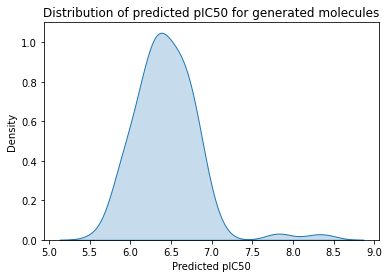

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)N1CCC(CC(=O)OCC2=CC(O)CC(C)(O)C2)CC1C
CC(=O)NC1CCC(n2cnc3c(NC=Cc4ccc(F)cc4)cccc32)COC1
CC(=O)Nc1ccc(C)cc1C=CNc1ccccc1
CC(=O)Nc1ccc(NNC(=O)Cc2ccccc2)cc1
CC(=O)OCC(=O)c1ccccc1


Policy gradient...: 100%|██████████| 15/15 [01:44<00:00,  6.94s/it]


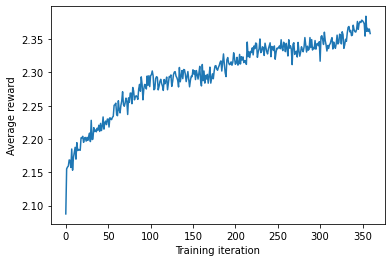

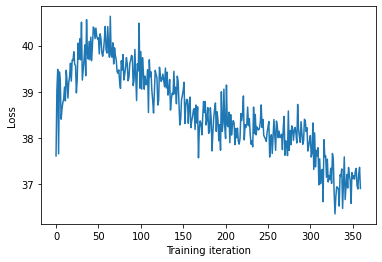

Generating molecules...: 100%|██████████| 200/200 [00:09<00:00, 21.13it/s]


Mean value of predictions: 6.477909400420951
Proportion of valid SMILES: 0.805


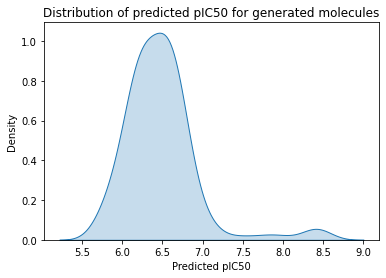

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#Cc1ccccc1SCCC
C=CCC(CCN(C)C)c1ccccc1
C=CCCCCCCC(=O)CCCCCCCCCCCCCCC
C=CCNC(=O)c1ccc(OC)cc1
CC(=O)NC1CCCCC1N(C)C


Policy gradient...: 100%|██████████| 15/15 [02:06<00:00,  8.41s/it]


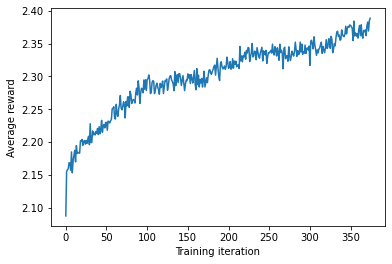

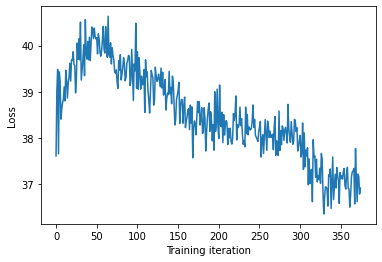

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.00it/s]


Mean value of predictions: 6.412629660004578
Proportion of valid SMILES: 0.8


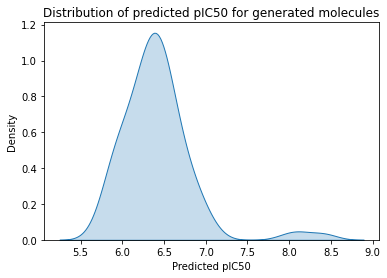

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#CCc1onc(C(C)C)c1C#N
C#Cc1ccc(Oc2ncccc2Cl)cc1
C=C(C)Nc1ccc2nc(-c3ccc(OC)cc3)[nH]c2c1
C=CC1C(c2ccccc2)C(C2CCOCC2)N(c2cc(C(C)C)cc(N(=O)=O)c2)C1OC
CC(=O)NC(Cc1ccccc1)C(=O)NCc1ccccc1


Policy gradient...: 100%|██████████| 15/15 [01:55<00:00,  7.73s/it]


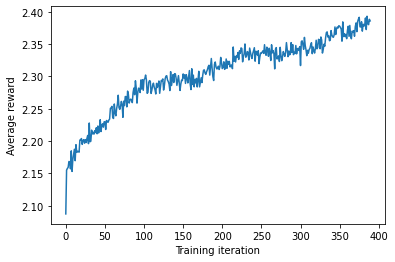

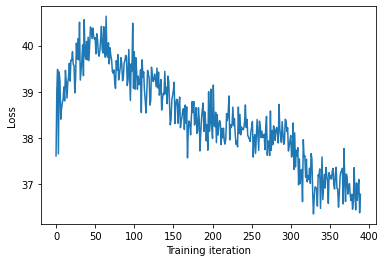

Generating molecules...: 100%|██████████| 200/200 [00:10<00:00, 19.97it/s]


Mean value of predictions: 6.402016597916573
Proportion of valid SMILES: 0.805


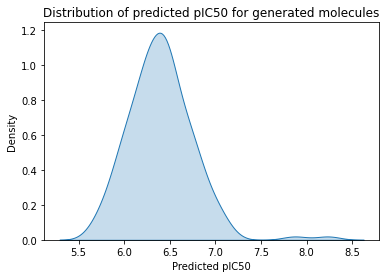

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#CC(C=CC(NC(=O)c1ccccc1N(=O)=O)C(C)C)C(=O)N1CCN(CC(O)CNC(C)=O)OC1=O
C=CCN1C(CC(=CCC(C)C2CCC(CCCCC)O2)CO)CC(C)(C)CC1C(=O)O
C=CCOC(=O)C1=NOC(CC)C1
CC(=CCCCCC(=O)O)CC(O)CCC1(C)C2CCC3(C)C(O)CC3OC2CCC2C3CC4(C)CCC5(C)CC(C)(C3C(O)CCC21C)C5C4
CC(=O)N(CCN=C1CCN(CCCCN2CCOCC2)C1=O)c1ccccc1


Policy gradient...: 100%|██████████| 15/15 [01:43<00:00,  6.89s/it]


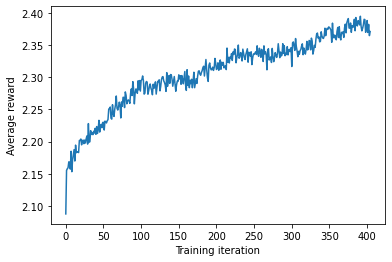

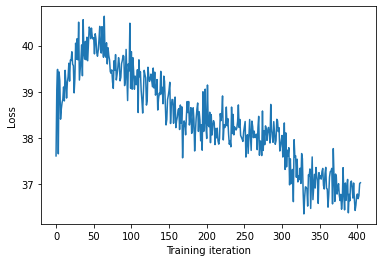

Generating molecules...: 100%|██████████| 200/200 [00:09<00:00, 20.18it/s]


Mean value of predictions: 6.371837068110196
Proportion of valid SMILES: 0.79


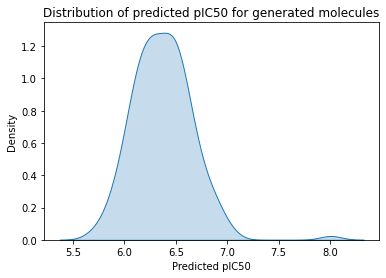

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C
C=CC(=O)Nc1ccc(C(=O)OC)cc1
C=CC1CCCCCCCCCN(CCCCCCCS(=O)(=O)CCNC(=O)N2CCN(c3cc(C)cc(C)c3)CC2)CC2CCCCC2C(=O)N1
C=CCNC(=O)COc1ccc(C(=O)OC)s1
C=CCOc1ccc(-c2ccccc2C(N)=O)cc1


Policy gradient...: 100%|██████████| 15/15 [01:43<00:00,  6.91s/it]


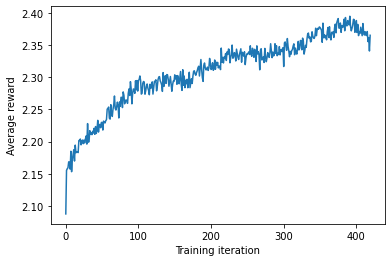

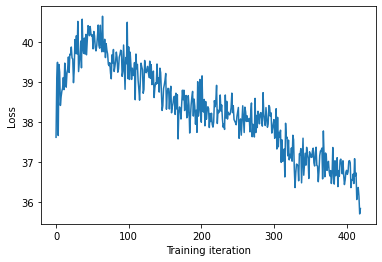

Generating molecules...: 100%|██████████| 200/200 [00:09<00:00, 20.22it/s]


Mean value of predictions: 6.398830368498847
Proportion of valid SMILES: 0.82


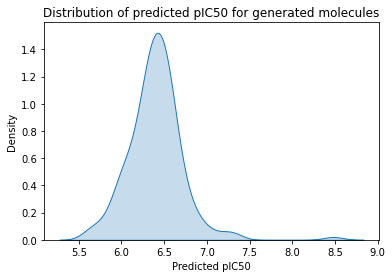

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C
C1CCC(CN2CCOCC2)CC1
C=C1CSCC(NC(=O)C2CCCCCC2)C1=O
C=CC(C)C(=O)NCCCCCCSCCCC(=O)O
C=CCOC(=O)c1cccc(Cc2cccc(N)c2)c1


Policy gradient...: 100%|██████████| 15/15 [02:05<00:00,  8.40s/it]


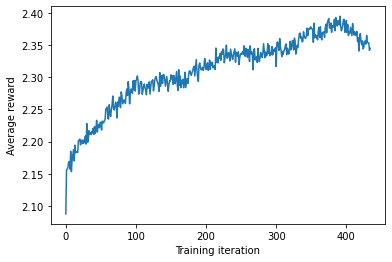

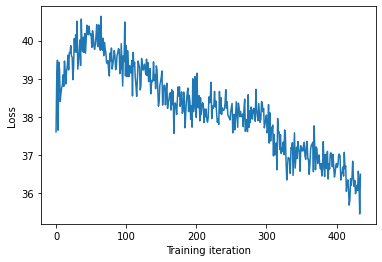

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.04it/s]


Mean value of predictions: 6.4039717611923015
Proportion of valid SMILES: 0.84


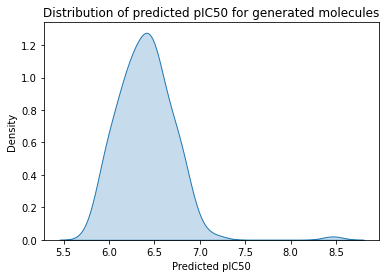

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C)C(=O)NCc1cccc(C)c1
C=CCc1ccc(CCC)cc1
CC(=Cc1ccc(Cl)cc1)CC(C)C
CC(=NNC(=O)c1ccc(S(N)(=O)=O)cc1)c1ccccc1
CC(=NOCc1ccccc1)c1ccc(O)cc1


Policy gradient...: 100%|██████████| 15/15 [02:34<00:00, 10.27s/it]


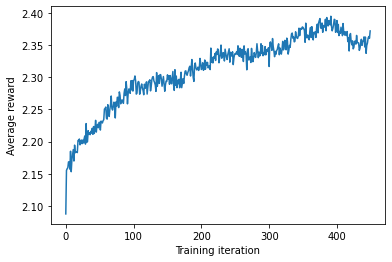

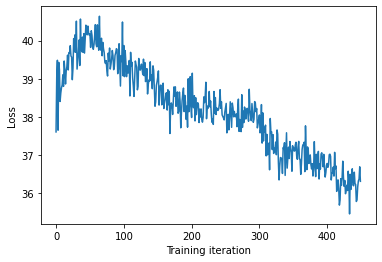

Generating molecules...: 100%|██████████| 200/200 [00:40<00:00,  4.99it/s]


Mean value of predictions: 6.4259013875259265
Proportion of valid SMILES: 0.835


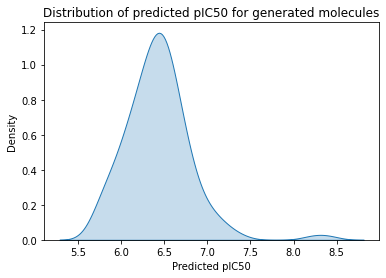

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#Cc1cccc(C=NNC(=O)CCCCCCON=C2CCCCC2)c1
C=C1CCC(C(=O)OCC)O1
C=CCCC(CC)NS(=O)(=O)CCc1ccccc1C
C=CCN(C)CCc1ccccc1
C=CCNC(=N)Nc1ccc(S(=O)(=O)N2CCCCCC2)cc1Cl


Policy gradient...: 100%|██████████| 15/15 [02:31<00:00, 10.11s/it]


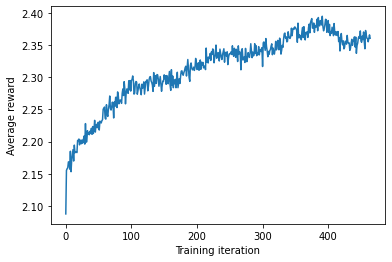

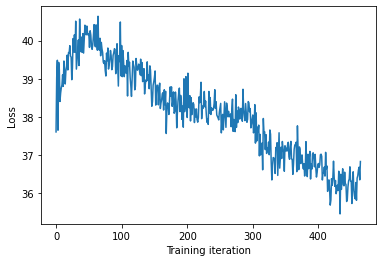

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.12it/s]


Mean value of predictions: 6.413636844508855
Proportion of valid SMILES: 0.845


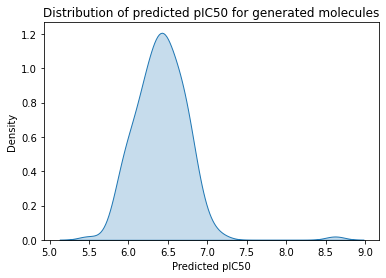

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#CCOc1ccccc1C(=O)O
C#Cc1cc(C2CC(=O)OCC2CO)nn1CC
C=CCc1nc2cc(C)c(Cl)cc2n1CCCC
CC(=O)Cn1cc(CNCc2ccc(NC(=O)CN)cn2)cn1
CC(=O)N1C(=O)N(CCSc2ccccc2)C(=O)c2ccccc21


Policy gradient...: 100%|██████████| 15/15 [02:31<00:00, 10.09s/it]


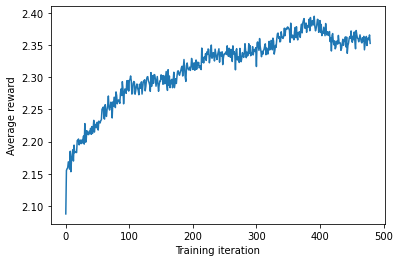

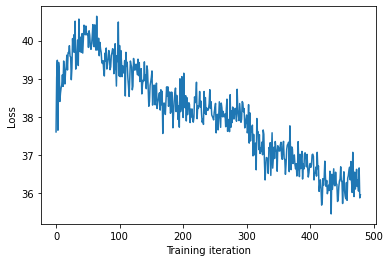

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.02it/s]


Mean value of predictions: 6.393072113740594
Proportion of valid SMILES: 0.845


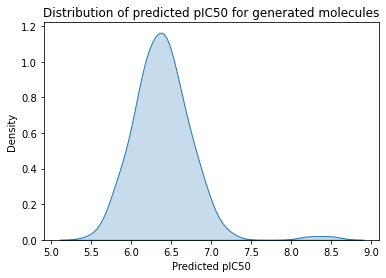

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C
C=CC1(C)Oc2cc(O)cc(O)c1CCCOC2CN(CCCC)CCCC
C=CCCCCCN(C)CCC=CCCCCCCCCCCCCCCCOc1ccccc1
C=CCN1C=C(C(=O)c2ccccc2)c2ccccc2C1=O
CC(=NNCCCCC1CC(C)NC(=O)C(CC(N)=O)NC(=O)C(Cc2ccccc2)NC1=O)Nc1c(C)cccc1C


Policy gradient...: 100%|██████████| 15/15 [02:32<00:00, 10.17s/it]


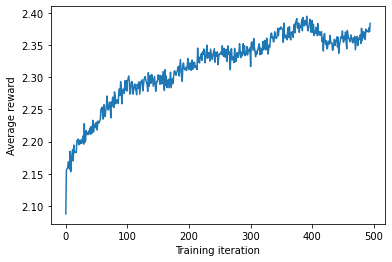

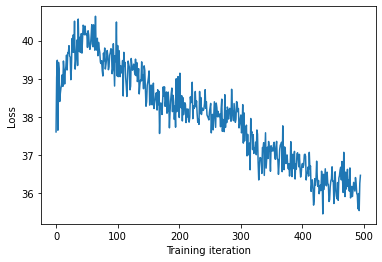

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.03it/s]


Mean value of predictions: 6.407980929505975
Proportion of valid SMILES: 0.82


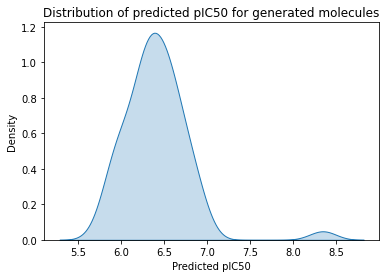

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C1NC(C)=C(C(=O)OCC)C(c2ccccc2)C(C(C)(O)C(C)C)=C1N
C=CC(N)CCc1ccc(OCc2ccccc2)cc1
C=CCCSC1CCN(C(=O)Nc2ccc(Cl)cc2)CC1
CC(=O)N(CC(=O)N(C)CCOCc1ccccc1)C(=O)NCC(F)(F)F
CC(=O)N(O)c1cc(F)cc(N2CC(Cl)CC(C3CCC3)O2)c1


Policy gradient...: 100%|██████████| 15/15 [02:17<00:00,  9.19s/it]


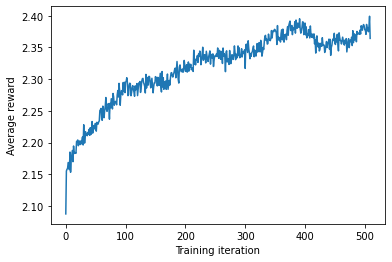

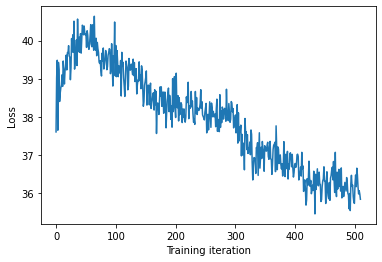

Generating molecules...: 100%|██████████| 200/200 [00:09<00:00, 20.66it/s]


Mean value of predictions: 6.4058166977178095
Proportion of valid SMILES: 0.835


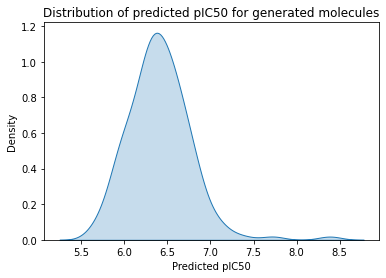

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(CC(=O)c1ccccc1OC)c1ccc(C)cc1
CC(=O)C1=CNC(=O)C(=C2C(=O)N(C(=O)c3ccc(Cl)cc3)N=C2C)N1C
CC(=O)N1CCC(c2cnc(CC(C)C)c(-c3ccc(Cl)cc3)n2)CC1
CC(=O)NC1C(O)CC(c2cccc(NC(=O)Cc3ccccc3)c2)OC1C
CC(=O)Nc1ccc(Nc2cc(N3CCN(C)CC3)ccn2)cc1


Policy gradient...: 100%|██████████| 15/15 [01:41<00:00,  6.78s/it]


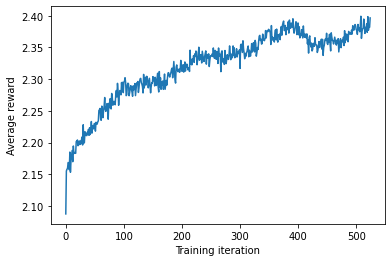

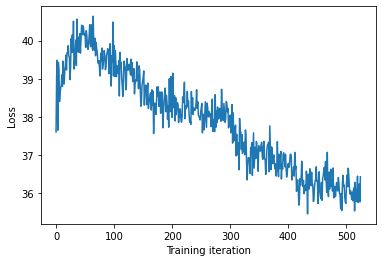

Generating molecules...: 100%|██████████| 200/200 [00:09<00:00, 21.42it/s]


Mean value of predictions: 6.404909785261882
Proportion of valid SMILES: 0.83


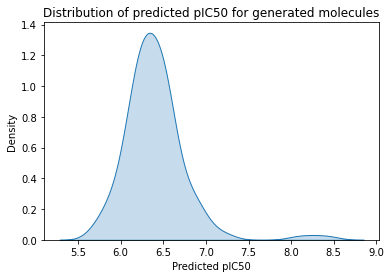

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C1CCNC(NCN2CCCC2)CC1
C=C(CCCC=C(C)CCCCCCCCC(C)CC(C)CCC(C)C)C(O)CCCCCC
C=Cc1ccc(OCCCN(C)C)cc1
CC(=O)NC(=O)CC(C)C
CC(=O)Nc1cccc(Cl)c1


Policy gradient...: 100%|██████████| 15/15 [01:41<00:00,  6.74s/it]


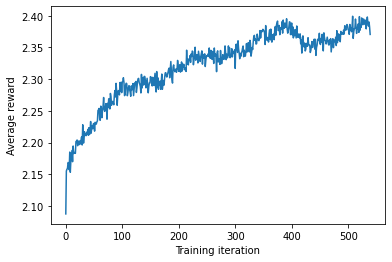

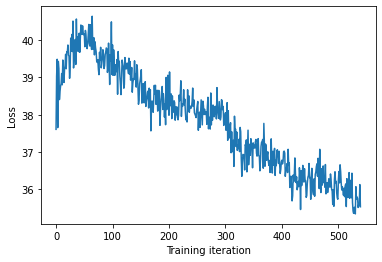

Generating molecules...: 100%|██████████| 200/200 [00:09<00:00, 20.97it/s]


Mean value of predictions: 6.362806663326234
Proportion of valid SMILES: 0.835


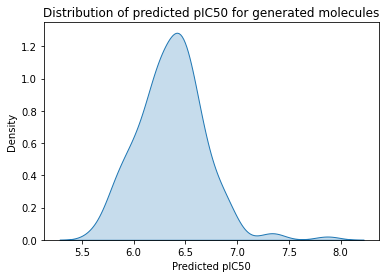

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C)C(O)C(=O)Os1CC2CC(CC1CCCCCCCCC(=O)O)C(O)C2NC(=O)OC
C=CCC1CCCCC1C=CC(=O)Nc1ccc(CO)cc1
C=CCC=Cc1cccc(O)c1
C=CCN(CCO)c1ccc2c(c1)CCs2CC
CC(=O)NC(C(=O)O)C(=O)N1CCN(C)C=C(N)c2ccc(cc2)C1


Policy gradient...: 100%|██████████| 15/15 [02:07<00:00,  8.50s/it]


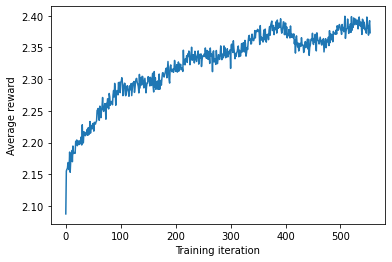

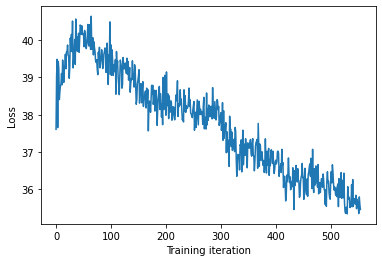

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.10it/s]


Mean value of predictions: 6.379876650470151
Proportion of valid SMILES: 0.86


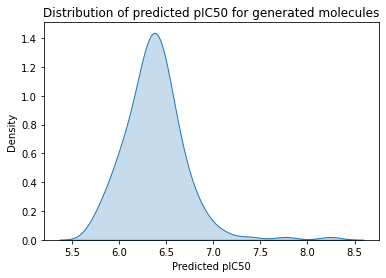

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCCCCC(=O)Nc1ccc(S(=O)(=O)N2CCCCC2C(=O)N(CC)CC)nc1
C=Cc1ccc(-c2cc(C(=O)O)nc(SC)c2C(=O)O)cc1
CC(=O)N1CCN(CCCCNC(=O)OCC2=CC(C)CCCCC2)CC1
CC(=O)NC1CCCCC1
CC(=O)NCC(O)COCCCCCCOc1ccc(Nc2ccccc2)cc1C


Policy gradient...: 100%|██████████| 15/15 [02:29<00:00,  9.94s/it]


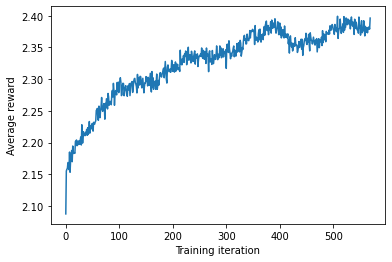

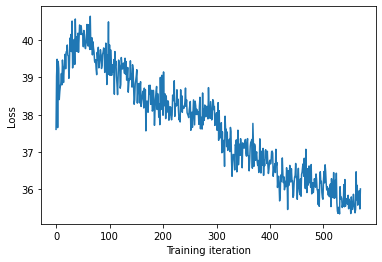

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.07it/s]


Mean value of predictions: 6.425140537222184
Proportion of valid SMILES: 0.87


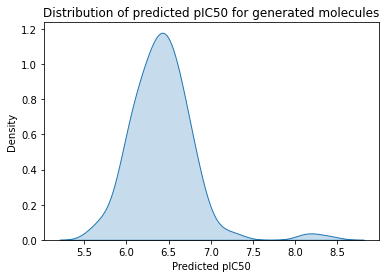

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C)NN=Cc1c(OC)ccc(OC)c1OC
C=CC=CC=CCC1(C)CCCC(C)(O)C=C1CCCC
C=CCCCCCCC(=O)NCC(C)C
C=CCNCCCN
C=CCNN=C1Cc2cc(C)ccc2C(c2ccc(O)c(OC)c2)C1


Policy gradient...: 100%|██████████| 15/15 [02:29<00:00, 10.00s/it]


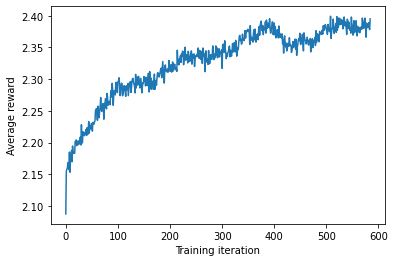

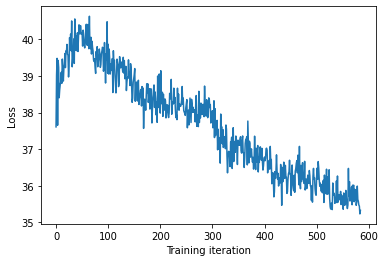

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.09it/s]


Mean value of predictions: 6.425361955225107
Proportion of valid SMILES: 0.81


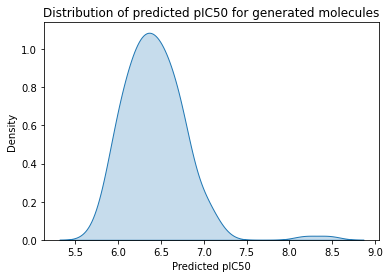

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCC1=NC(O)C(=O)c2ccccc21
C=CCN(CC(=O)OCc1ccccc1)C(=O)NCc1cccnc1
CC(=NNc1nccn1C)C(=O)c1ccc(C)cc1
CC(=O)Nc1ccc2c(c1)C(C)Cc1ccccc1-2
CC(C(=O)N(C)C)N(C)CCCNCCCCOCCO


Policy gradient...: 100%|██████████| 15/15 [02:27<00:00,  9.87s/it]


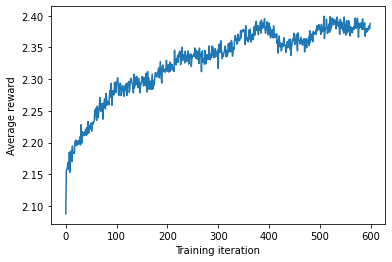

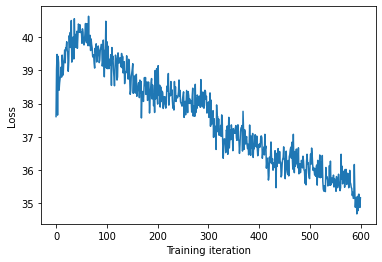

Generating molecules...: 100%|██████████| 200/200 [00:39<00:00,  5.07it/s]


Mean value of predictions: 6.441991909349074
Proportion of valid SMILES: 0.855


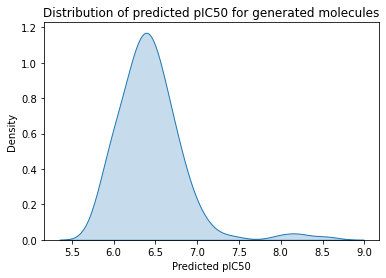

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#Cc1c(Oc2ccccc2)ccnc1N
C=CCC(O)C1CC(C)CCC1OC(=O)C=CC
C=CCC1CCCCC(O)(CCCCCCCCN2CCCCC2)C(C)(C)CC1
C=CCCCCCCCCCC(NO)S(C)(=O)=O
C=CCN1C(COCc2ccccc2)=CC(=O)N=C1C


Policy gradient...: 100%|██████████| 15/15 [02:30<00:00, 10.02s/it]


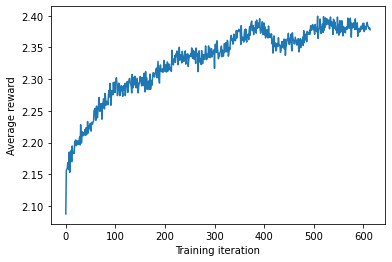

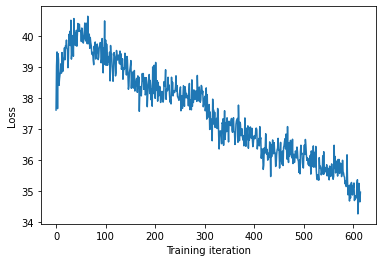

Generating molecules...: 100%|██████████| 200/200 [00:38<00:00,  5.15it/s]


Mean value of predictions: 6.394531853597591
Proportion of valid SMILES: 0.865


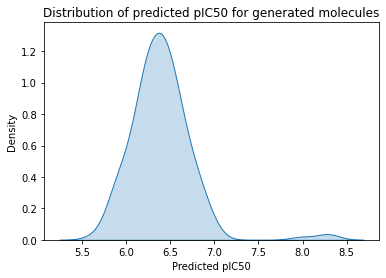

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#Cc1ccccc1N1CCN(CCCCCCCNC(=O)CC2CCNCC2)CC1
CC(=O)NC(CC1CCCN1)C(O)C(O)C(C)O
CC(=O)NC(CN(C)C)C(=O)Nc1cccc(Cl)c1
CC(=O)OC1c2ccc(C)cc2S(=O)(=O)N(C)C1(C)C
CC(=O)OCc1cccc(C(=O)NC(C)c2ccc(C)cc2)c1


Policy gradient...: 100%|██████████| 15/15 [02:28<00:00,  9.89s/it]


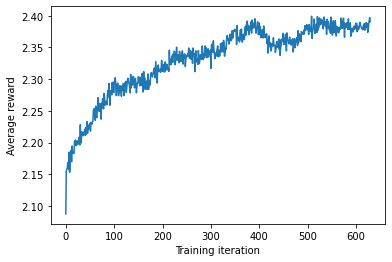

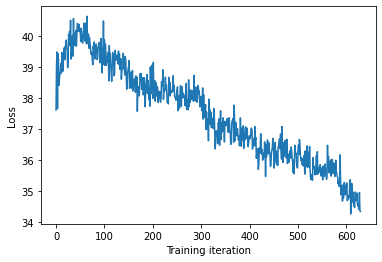

Generating molecules...: 100%|██████████| 200/200 [00:38<00:00,  5.13it/s]


Mean value of predictions: 6.419206081616106
Proportion of valid SMILES: 0.9


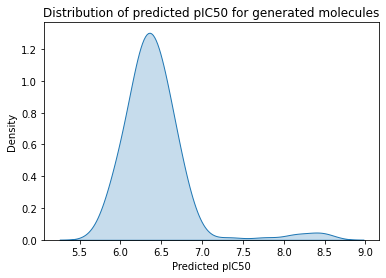

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCN1C(=O)C(NC(=O)CCC)SC1C
CC(=NNC(=O)CNC(=O)c1ccccc1C)c1ccccc1
CC(=O)NC(CCCCCCCCCCCNC(N)=O)C(=O)NNCC1CCOCC1
CC(=O)NCC1CCCN1c1ccc(Cn2cncn2)cc1
CC(=O)OC(C(C)=CCCCCC(=O)O)C(C)OC(=O)CC(C)C(O)CC(C)C


Policy gradient...: 100%|██████████| 15/15 [01:43<00:00,  6.92s/it]


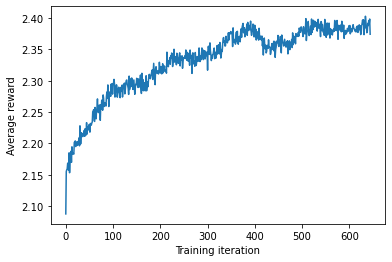

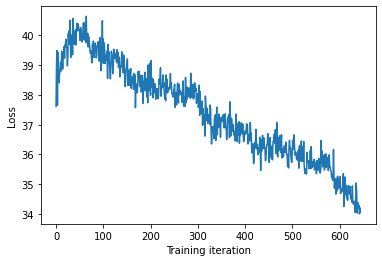

Generating molecules...: 100%|██████████| 200/200 [00:08<00:00, 22.29it/s]


Mean value of predictions: 6.371608353986802
Proportion of valid SMILES: 0.835


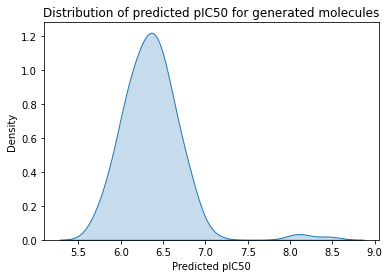

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C1NN(C(=O)C(=O)NS(=O)(=O)c2ccccc2)NCC1OC(C)=O
CC(=O)C1C(=O)c2ccccc2N(C)C1=O
CC(=O)NCC(=O)Nc1ccc(Cl)c(NC(=O)COc2ccccc2)c1
CC(=O)NCCCCCC(=O)O
CC(=O)Nc1ccc(C(=O)O)cc1


Policy gradient...: 100%|██████████| 15/15 [01:40<00:00,  6.73s/it]


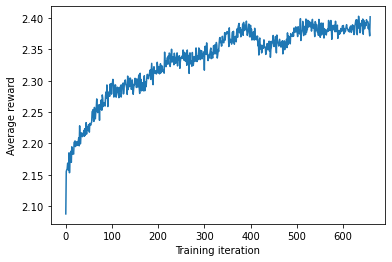

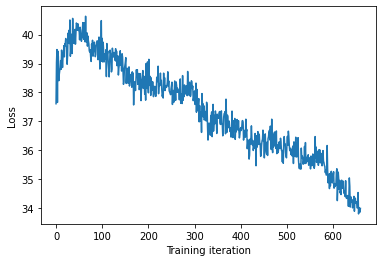

Generating molecules...: 100%|██████████| 200/200 [00:09<00:00, 21.99it/s]


Mean value of predictions: 6.304992264278332
Proportion of valid SMILES: 0.87


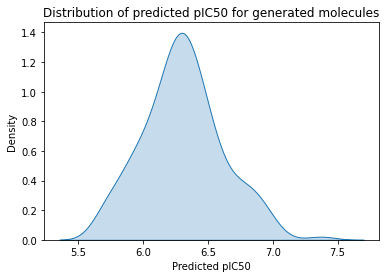

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(CN(C)c1ccc(C(=O)O)cc1)c1ccccc1
CC(=O)NC(C)N(CCCNC(=O)NC1CCCCC1)C(=O)NCCN1CCCCC1
CC(=O)Nc1cccc(N(=O)=O)c1
CC(=O)OC1C(O)CC(=O)OC1C(=O)NCCCCNC(=O)OCc1ccccc1
CC(=O)Oc1cccc(NS(C)(=O)=O)c1


Policy gradient...: 100%|██████████| 15/15 [01:40<00:00,  6.73s/it]


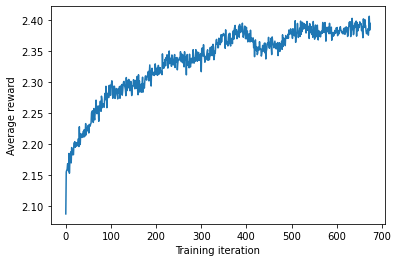

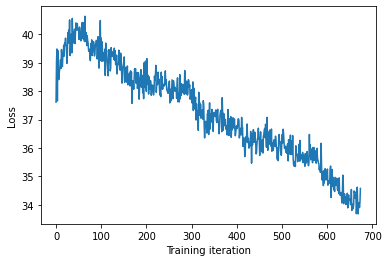

Generating molecules...: 100%|██████████| 200/200 [00:08<00:00, 22.69it/s]


Mean value of predictions: 6.415826579688484
Proportion of valid SMILES: 0.85


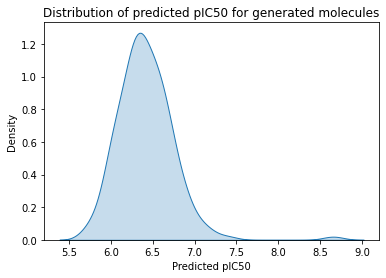

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C
C=C(C)C1=CC=CN2C(=O)c3ccccc3Nc12
C=CCC1=C(O)C(=O)N(C)C1=O
C=CCC1C=CC(C)=CCC1
C=CCCN(CCC1CCCCN1C)C(=O)NCCCN(C)C


Policy gradient...: 100%|██████████| 15/15 [01:45<00:00,  7.00s/it]


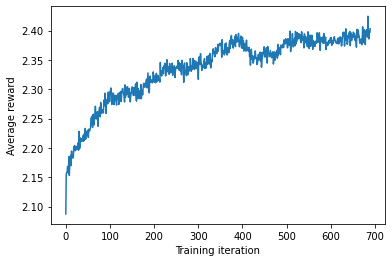

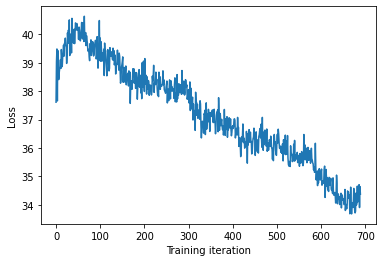

Generating molecules...: 100%|██████████| 200/200 [00:38<00:00,  5.22it/s]


Mean value of predictions: 6.3306484297384245
Proportion of valid SMILES: 0.85


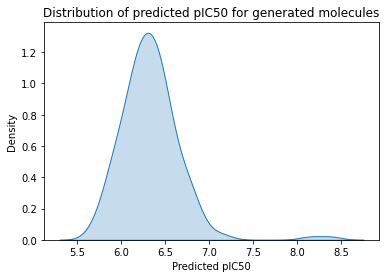

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#CCC1CCCCCN1C
C#Cc1ccc(N2CCN(Cc3ccccc3C)CC2)nc1
C=C1CCC2(O)CCC3C(C(C)CCC=C(C)C(O)CCC)CCC3(C)CCC12
C=CCC(C)C(=O)O
C=CCNCCCNCCc1ccc(F)cc1


Policy gradient...: 100%|██████████| 15/15 [02:29<00:00,  9.96s/it]


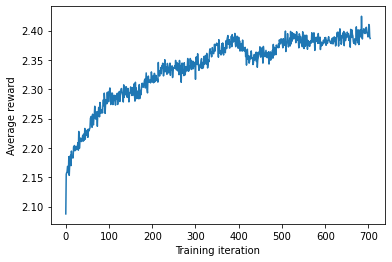

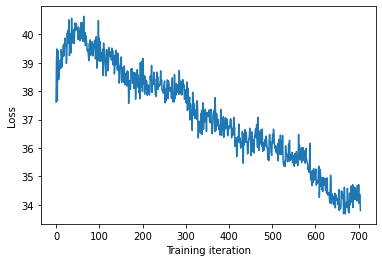

Generating molecules...: 100%|██████████| 200/200 [00:38<00:00,  5.17it/s]


Mean value of predictions: 6.377580633832852
Proportion of valid SMILES: 0.87


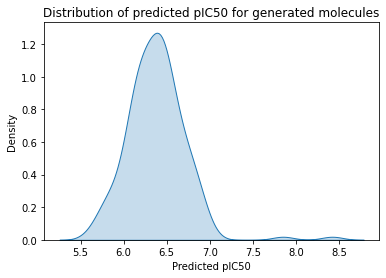

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C1CCC(C2CCC2)CC1
C=C(C)C(O)C=CC=C(CC)C1CCC2(C)CCC1C2C=O
C=C(CC=CCC(=O)O)CC(NC(=O)Cl)C(=O)O
CC(=O)N1CC(COCC2(O)CCCC2C2CCCCC2)C1
CC(=O)NC1CCOCC1


Policy gradient...: 100%|██████████| 15/15 [02:26<00:00,  9.76s/it]


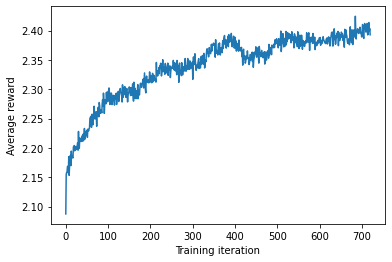

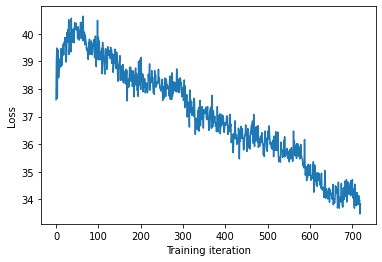

Generating molecules...: 100%|██████████| 200/200 [00:38<00:00,  5.22it/s]


Mean value of predictions: 6.353418777752942
Proportion of valid SMILES: 0.885


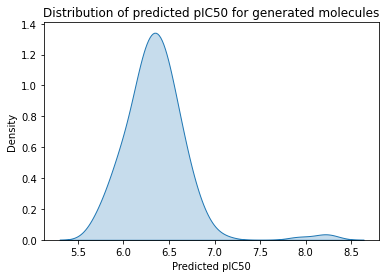

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCCCC(NC(=O)C(Cc1ccccc1)NC(=O)CBr)C(=O)NC(C)C(=O)NC(CCCNC(C)=O)CC(=O)NC(Cc1ccccc1)C(=O)O
C=CCCCNCCCNC(=O)NCCCCCC
CC(=O)N1CCCC(NCc2ccccc2)C1
CC(=O)Nc1cc(-c2nc3cc(-c4ccccc4)ccc3[nH]2)ccc1OCF
CC(=O)c1ccc(NC(=O)NC2COCC2C)cc1


Policy gradient...: 100%|██████████| 15/15 [02:31<00:00, 10.07s/it]


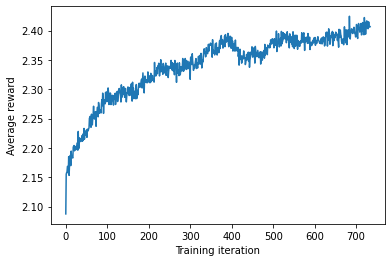

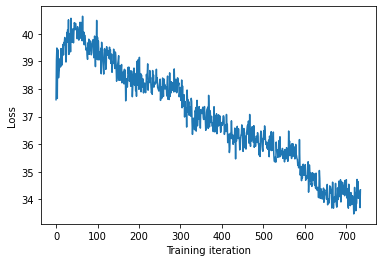

Generating molecules...: 100%|██████████| 200/200 [00:38<00:00,  5.21it/s]


Mean value of predictions: 6.328691936430882
Proportion of valid SMILES: 0.88


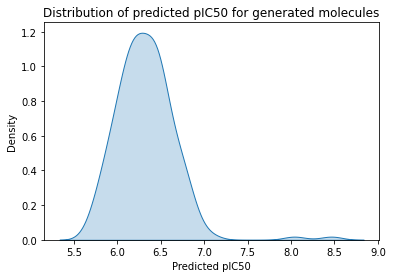

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCC(C)=CCCCCC1(C)CC(OC2CCC(O)CC2C=C)OC1C
C=CCN(CCCC)c1ccc(NC(=O)c2cc(C)ccc2C)cc1
C=CCN(CCO)CCO
C=Cc1ccc(OCC)cc1
CC#CCOC(=O)N1CCN(c2ccccc2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:26<00:00,  9.75s/it]


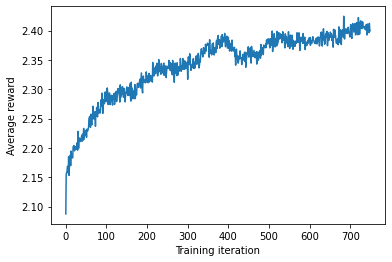

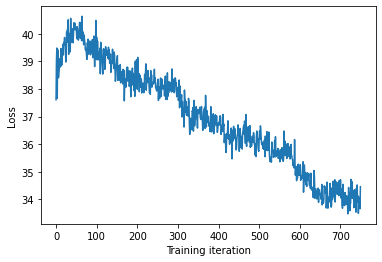

Generating molecules...: 100%|██████████| 200/200 [00:38<00:00,  5.20it/s]


Mean value of predictions: 6.348929442688068
Proportion of valid SMILES: 0.795


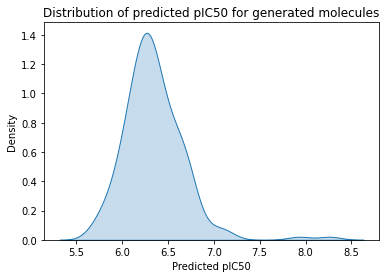

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCCNC(=O)OC1OC(CNCCCCCCO)CC1O
C=CCN1C(=O)C(C(CC)CCC)C(=O)C1C=CC(C)C
C=CCNC(=O)C(CO)Cc1ccccc1
C=CCOCCCCCCCCCCCN1CCN(c2ccccc2OC)c2nc(OCCN)ccc21
CC(=O)NCC(=O)O


Policy gradient...: 100%|██████████| 15/15 [02:27<00:00,  9.85s/it]


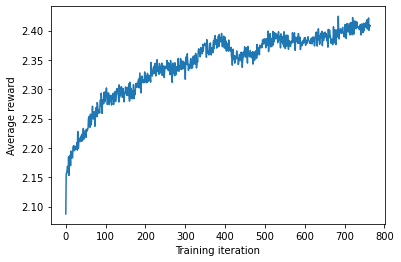

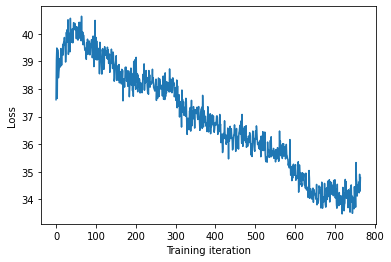

Generating molecules...: 100%|██████████| 200/200 [00:38<00:00,  5.22it/s]


Mean value of predictions: 6.352408927742595
Proportion of valid SMILES: 0.87


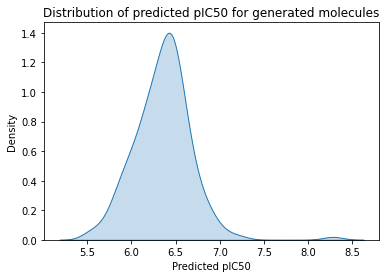

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C1C(O)CC(O)CC1(C)CCC=C(C)CCCCCCCC(C)CCC=C(C)CCC=C(C)C
C=C1CNOc2ccccc21
C=CCCCNc1nc(C=NCc2ccccc2)cn1CCCCCCCC(=O)CCCCCCCCCCCCCCCC
C=CCNCCN(C)CC1CCC(CC(=O)O)C1
C=CN(C(=O)NC1CCSc2ccccc21)c1ccc(OC)cc1


Policy gradient...: 100%|██████████| 15/15 [02:26<00:00,  9.75s/it]


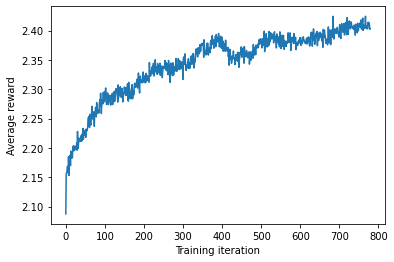

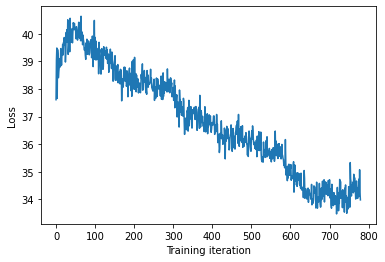

Generating molecules...: 100%|██████████| 200/200 [00:38<00:00,  5.22it/s]


Mean value of predictions: 6.33444189586462
Proportion of valid SMILES: 0.855


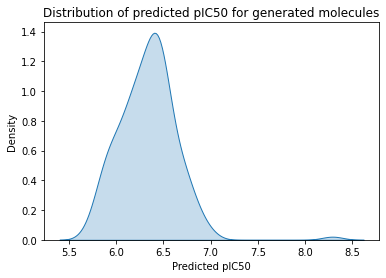

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C)C1CC(C)CCC1=CCCCCC(=O)NCc1ccccc1
C=CCN(C)C(=O)Nc1cc(C)ccc1OCC
C=CCSC(=S)Nc1ccc(C)cc1
CC
CC(=O)NC1=C(C)C(=O)NC1=O


Policy gradient...: 100%|██████████| 15/15 [02:25<00:00,  9.68s/it]


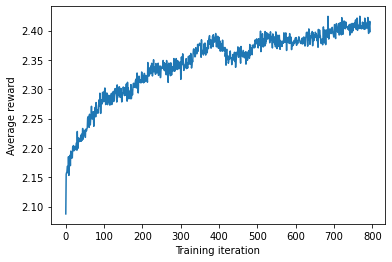

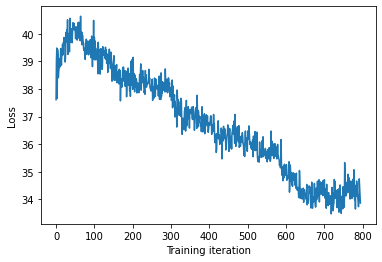

Generating molecules...: 100%|██████████| 200/200 [00:37<00:00,  5.27it/s]


Mean value of predictions: 6.318209283792238
Proportion of valid SMILES: 0.905


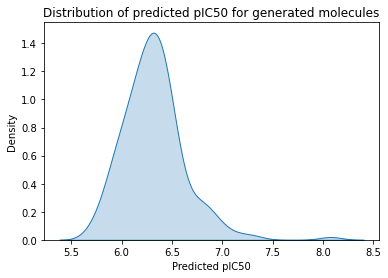

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCCS(=O)(=O)N(C)c1cc(C)ccc1Cl
C=CCSCCCN
CC(=O)NC(CCCSC(=S)NC(N)=O)OC1CCCCC1
CC(=O)NCCCCN
CC(=O)Nc1ccc(C(=O)C(F)(F)C(F)(F)F)cc1O


Policy gradient...: 100%|██████████| 15/15 [02:27<00:00,  9.84s/it]


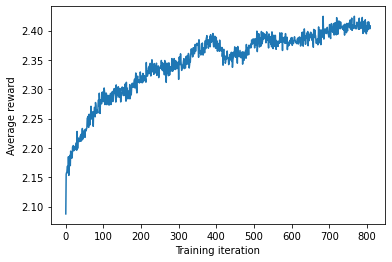

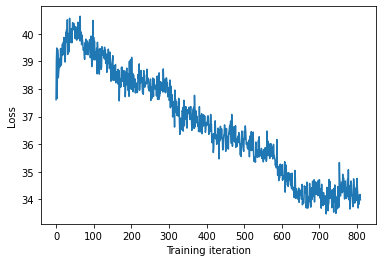

Generating molecules...: 100%|██████████| 200/200 [00:38<00:00,  5.19it/s]


Mean value of predictions: 6.424832895560251
Proportion of valid SMILES: 0.89


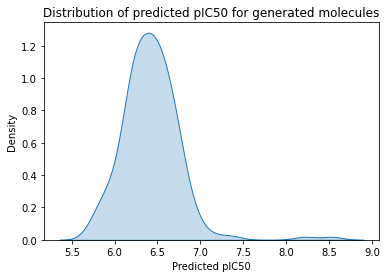

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#CCNC(=O)CCCCc1ccc(-c2cccc(OC)c2)cc1
C=CCC(=O)OCC1=C(C)CN(CC)C(c2ccccc2)C1
C=CCN(CCCCCCCCC1C=C(N)N(OC)C1=O)C(C)C
CC(=O)N(c1ccccc1C)C1CCCCC1
CC(=O)N1CCCC1C(=O)Nc1ccccc1C


Policy gradient...: 100%|██████████| 15/15 [02:25<00:00,  9.72s/it]


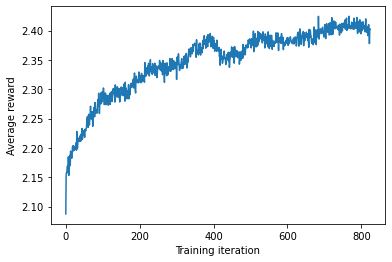

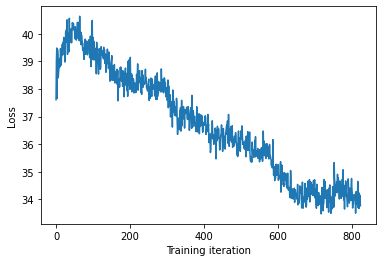

Generating molecules...: 100%|██████████| 200/200 [00:38<00:00,  5.22it/s]


Mean value of predictions: 6.365791959933461
Proportion of valid SMILES: 0.885


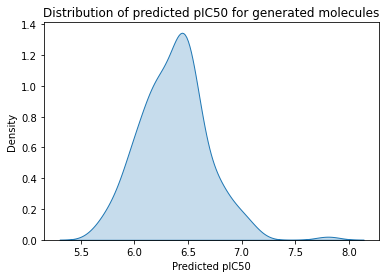

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C)N(CCOC)C(=O)Nc1cc(C)ccc1C
C=CCC(C)C(=NOC)C(C)=O
CC(=NN(C)C)c1ccc(OCCO)cc1
CC(=NNC(=N)N)c1ccccc1
CC(=NNC(=O)Cc1cccnc1)c1ccccc1


Policy gradient...: 100%|██████████| 15/15 [02:27<00:00,  9.86s/it]


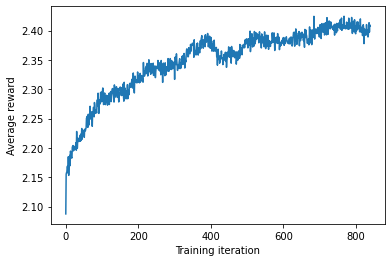

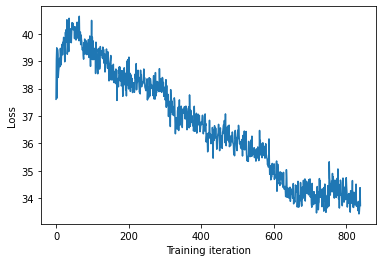

Generating molecules...: 100%|██████████| 200/200 [00:38<00:00,  5.20it/s]


Mean value of predictions: 6.362968536636682
Proportion of valid SMILES: 0.91


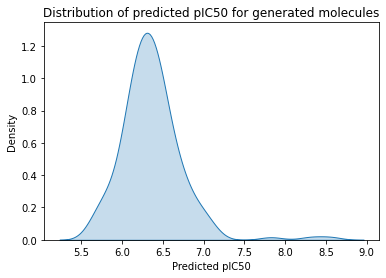

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C
C#CCOC(=O)CCN
C=C(C)N1CCN(C(=O)c2CC3CCCN(C)CC3C2)CC1
C=CCCCCCCC(=O)Nc1ccc(Nc2ccccc2C)cc1OC
CC(=O)NC1CCC(CCCCNC(=O)OCc2ccccc2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:27<00:00,  9.86s/it]


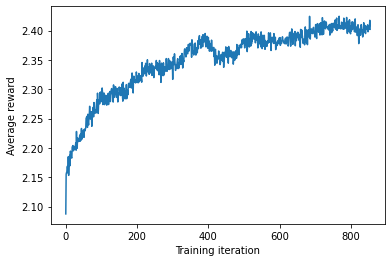

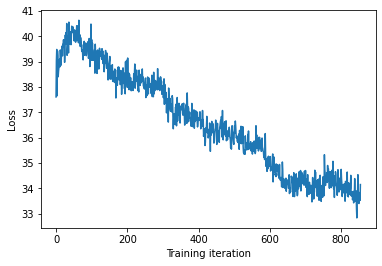

Generating molecules...: 100%|██████████| 200/200 [00:38<00:00,  5.18it/s]


Mean value of predictions: 6.371674491248225
Proportion of valid SMILES: 0.885


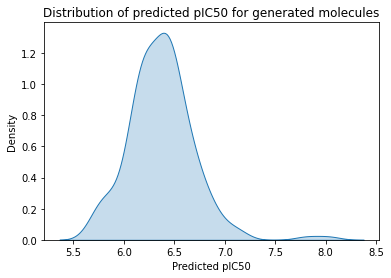

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CC=CC(=O)OCC
C=CCC(=O)NC1CCN(Cc2ccc(CC)cc2)CC1
C=CCCC(=O)NCc1ccc(OCc2cccc(-c3ccccc3C(=O)OC)c2)cc1
C=CCCCCCCCCCCCCCCCCCCCCCCCOP(=O)(OCC)OCCO
C=CCCCNC(=O)NC(C)C(C)(C)C


Policy gradient...: 100%|██████████| 15/15 [02:26<00:00,  9.75s/it]


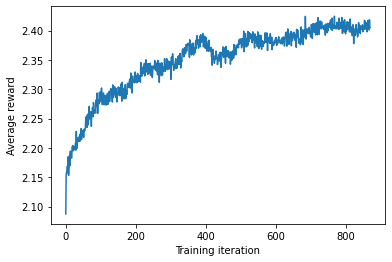

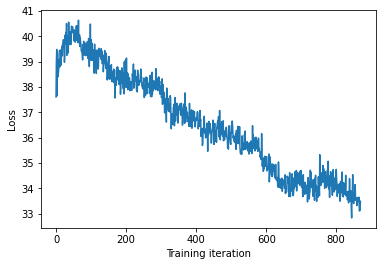

Generating molecules...: 100%|██████████| 200/200 [00:38<00:00,  5.26it/s]


Mean value of predictions: 6.37527822456608
Proportion of valid SMILES: 0.86


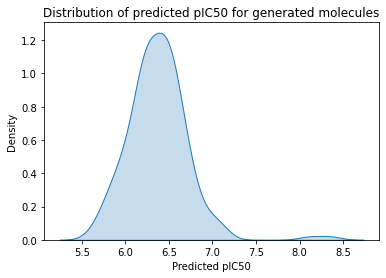

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
Brc1cccc(-c2ccccc2)c1
C#CC(NC(=O)CCCC1CCCCC1)c1ccc(C)cc1
C=CCCC1=NOC(O)(c2ccccc2)C1
C=CCCCCCC(=O)OCC(=O)NCCC(=O)NC
C=CCNC(=O)C1CCC(C)CC1


Policy gradient...: 100%|██████████| 15/15 [02:28<00:00,  9.90s/it]


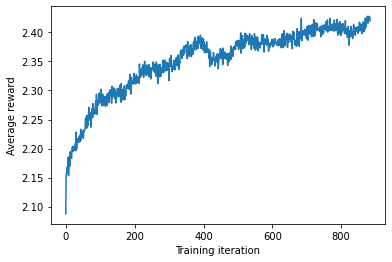

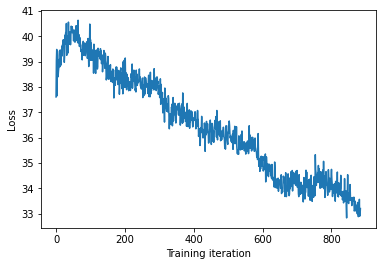

Generating molecules...: 100%|██████████| 200/200 [00:37<00:00,  5.31it/s]


Mean value of predictions: 6.382152740372162
Proportion of valid SMILES: 0.895


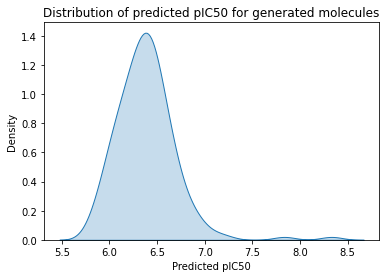

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCNCCCCC(CC(=O)NC(CCCN=C(N)N)NC(=N)N)NCCCCNC(=O)OC(C)(C)C1CCC(CC)CC1
CC(=O)NCC(=O)O
CC(=O)NCC1CCC(c2ccccc2)NC1
CC(=O)Nc1ccc(C(=O)Nc2ccc(N3CCOCC3)cc2Cl)cc1
CC(=O)Nc1ccc(NC(=O)NC(c2cncc(F)c2)c2ncccc2Cl)cc1


Policy gradient...: 100%|██████████| 15/15 [01:53<00:00,  7.55s/it]


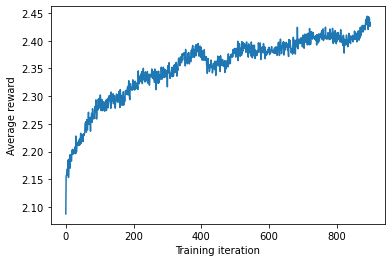

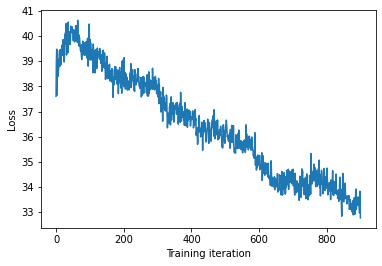

Generating molecules...: 100%|██████████| 200/200 [00:08<00:00, 24.08it/s]


Mean value of predictions: 6.38620075818215
Proportion of valid SMILES: 0.885


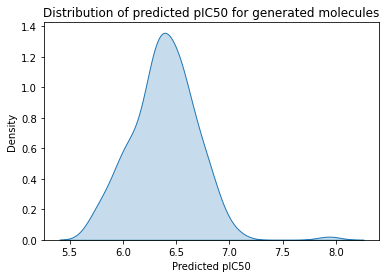

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(CCC(=O)OCCCCC)c1ccc(OC)cc1
C=CCCCCCCCNC(=O)CNC(=O)C(CNC(N)=O)NC(=O)COc1ccccc1
CC(C)(C)n1cc(C(=O)NCC2CCCNC2)cn1
CC(C)(N)CCNCCCNC1=CCCCC1
CC(C)=CC(=O)C(c1ccccc1)c1ccccc1N1CCCCC1


Policy gradient...: 100%|██████████| 15/15 [01:41<00:00,  6.76s/it]


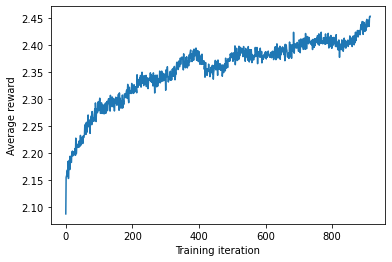

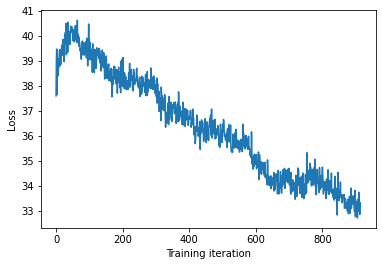

Generating molecules...: 100%|██████████| 200/200 [00:07<00:00, 25.17it/s]


Mean value of predictions: 6.308042474089761
Proportion of valid SMILES: 0.92


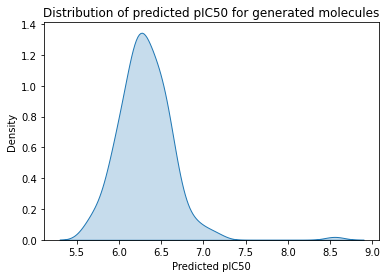

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C1CC(C)C(C)=C(OCCCCC(=O)OC)C(CC)C1
C=CC(=O)Nc1cc(N(=O)=O)cc(N(=O)=O)c1
C=CCNc1ccc(C)cc1
CC(=O)NC(C)c1ccccc1
CC(=O)NCCCN(C)C


Policy gradient...: 100%|██████████| 15/15 [01:38<00:00,  6.56s/it]


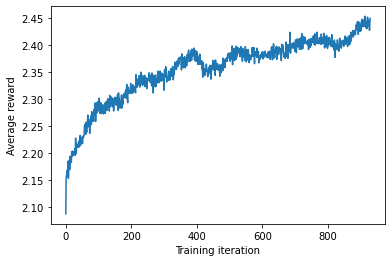

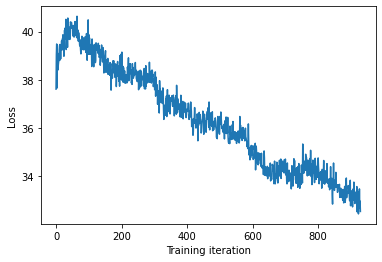

Generating molecules...: 100%|██████████| 200/200 [00:07<00:00, 26.29it/s]


Mean value of predictions: 6.350017207194285
Proportion of valid SMILES: 0.895


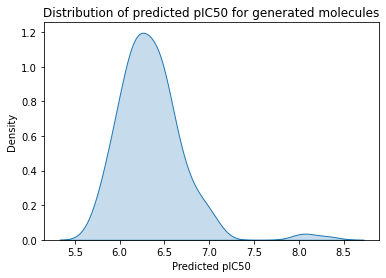

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C
C=CCC1(C(=O)OCC)CCCCC1
C=CCCCCC(=O)NC(CCCC(=O)O)NC(C)=O
C=CCOCCOCC(=O)NC(CCCCNC(=N)N)C(=O)NC(CC(C)C)C(C)C
CC(=NNC(=O)c1ccccc1Cl)c1ccccc1O


Policy gradient...: 100%|██████████| 15/15 [01:38<00:00,  6.54s/it]


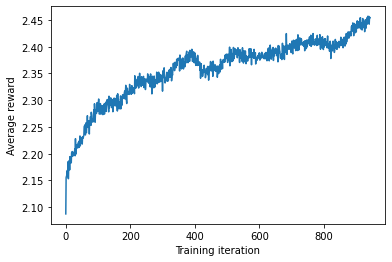

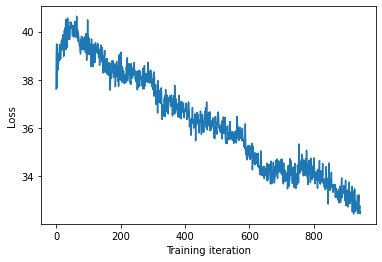

Generating molecules...: 100%|██████████| 200/200 [00:08<00:00, 24.10it/s]


Mean value of predictions: 6.340237490365315
Proportion of valid SMILES: 0.89


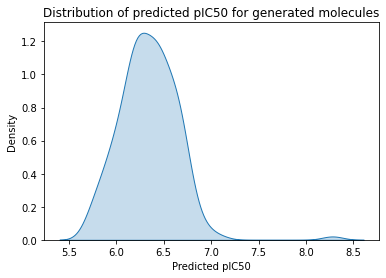

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCCC(N)C(=O)O
C=CCN(CCC(=O)OCC)C(=O)NCc1ccccc1
C=CCOC(=O)Nc1ccccc1OC
CC(=O)NC(CCC#N)CC(N)=O
CC(=O)NCCCC(NC(=O)NC(Cc1ccccc1)C(N)=O)C(N)=O


Policy gradient...: 100%|██████████| 15/15 [01:37<00:00,  6.50s/it]


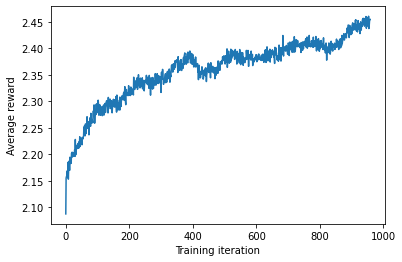

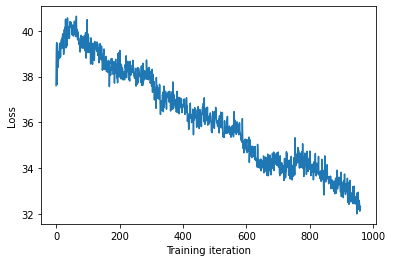

Generating molecules...: 100%|██████████| 200/200 [00:07<00:00, 26.71it/s]


Mean value of predictions: 6.2882994874648785
Proportion of valid SMILES: 0.935


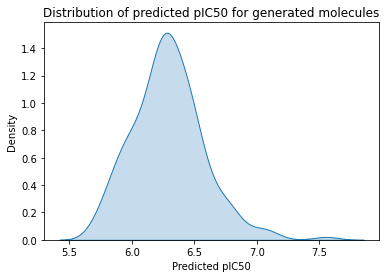

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCC(CCCC(=O)O)N(C)O
C=CCNC(=O)NC1CCCCC1
C=CCOc1ccccc1C(N)=O
CC(=NNc1ccccc1)c1ccccc1
CC(=O)C1=CN(Cc2ccccn2)C=CC1=O


Policy gradient...: 100%|██████████| 15/15 [01:37<00:00,  6.53s/it]


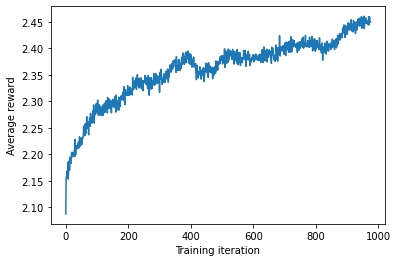

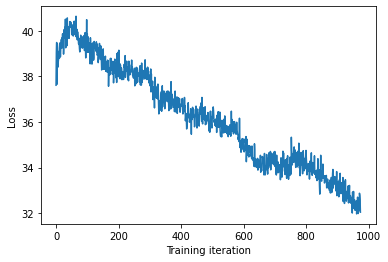

Generating molecules...: 100%|██████████| 200/200 [00:07<00:00, 25.32it/s]


Mean value of predictions: 6.368248343197826
Proportion of valid SMILES: 0.91


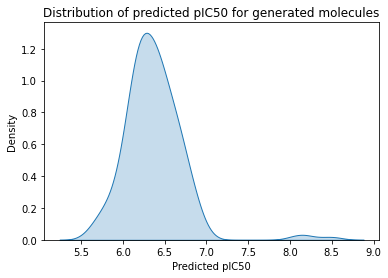

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCCCCCCCCCCCCCNCCCNCc1ccc(OC)cc1
C=CNC=NCNN=Cc1ccccc1O
CC(=CCC(C)C1CC=C(C)CCC2CCC(C)CCC1(C)O2)CCCCCC(O)CCCCc1ccccc1
CC(=O)C1=C(O)CCCC1
CC(=O)N1CC(=O)NN=C(C)CCC(C)C1


Policy gradient...: 100%|██████████| 15/15 [02:23<00:00,  9.57s/it]


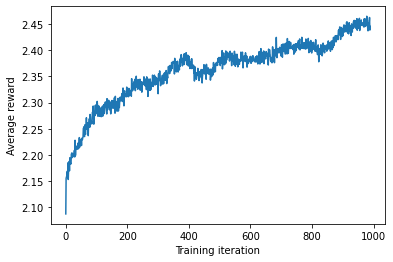

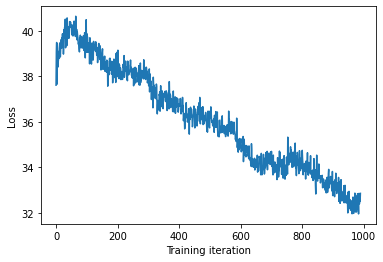

Generating molecules...: 100%|██████████| 200/200 [00:37<00:00,  5.37it/s]


Mean value of predictions: 6.274461092136548
Proportion of valid SMILES: 0.895


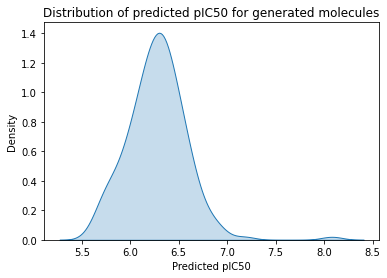

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C)ON=C(C)c1ccccc1
C=C1CCC(C(C)O)C1CCc1cccc(Cl)c1C
C=CCC(C)Nc1ccc(OCC)c(C)c1
CC(=O)N1CCC(NC(=N)N)CC1
CC(=O)NC(CO)CC(N)C1CCCN(C)C1


Policy gradient...: 100%|██████████| 15/15 [02:24<00:00,  9.63s/it]


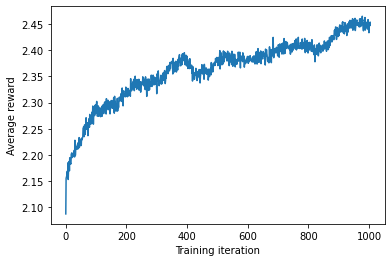

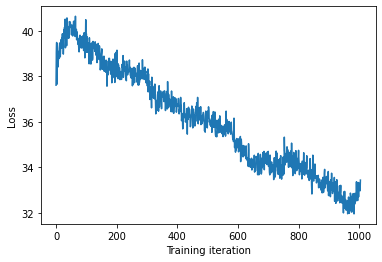

Generating molecules...: 100%|██████████| 200/200 [00:36<00:00,  5.42it/s]


Mean value of predictions: 6.344306195985035
Proportion of valid SMILES: 0.91


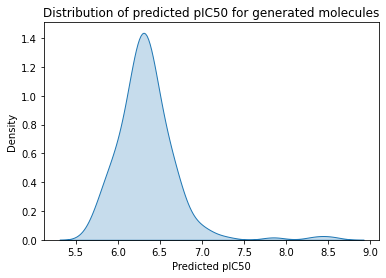

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCCCCCC=CCCCCCNC(CCCCCCCCCN)C(=O)NCc1ccccc1
C=CCSC1NC(C)=NN1CC=C
C=CCn1ccc(C#Cc2ccccc2)c1
CC(=O)CC(NC(=O)N(C)C(C)C)C(N)=O
CC(=O)N1CCN(CC(c2ccccc2)N(C)C)CC1


Policy gradient...: 100%|██████████| 15/15 [02:24<00:00,  9.60s/it]


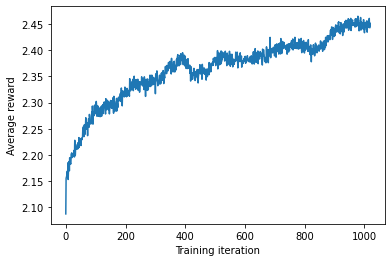

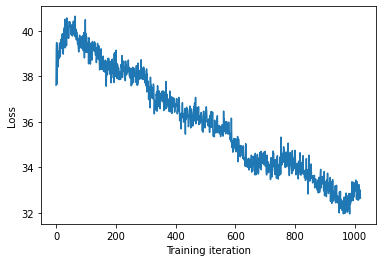

Generating molecules...: 100%|██████████| 200/200 [00:37<00:00,  5.36it/s]


Mean value of predictions: 6.358408133024644
Proportion of valid SMILES: 0.905


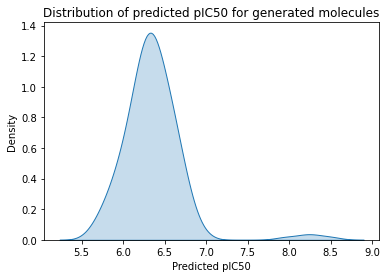

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#CCNC(=S)N1CCC(C)CC1
C=CC(=O)N1CCCC(O)C1
C=CC(CC1=NCC1)NCCc1ccccc1
C=CCC(CC(=O)O)Nc1cccc(OC)c1
C=CCN(C)Cc1cccc(NCC(=O)Nc2ccc(OC)cc2)c1


Policy gradient...: 100%|██████████| 15/15 [01:54<00:00,  7.61s/it]


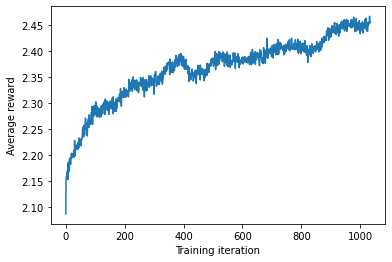

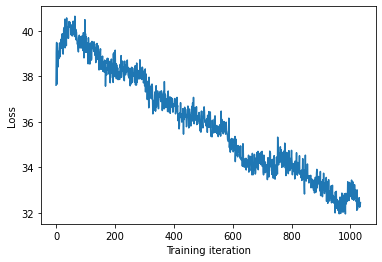

Generating molecules...: 100%|██████████| 200/200 [00:07<00:00, 25.31it/s]


Mean value of predictions: 6.301357399687577
Proportion of valid SMILES: 0.84


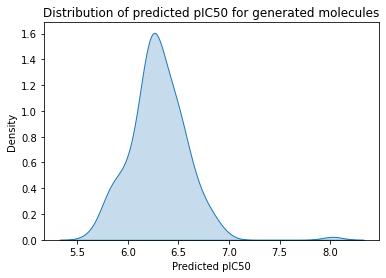

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C1=C(c2ccccc2)NNN=C1c1ccccc1
C=C1CCCN(C(=O)CCc2ccc(OC)cc2)C1C
CC(=O)N1CCN(c2ccccc2)CC1
CC(=O)NC(C(=O)NCC(=O)O)C(C)O
CC(=O)NCCCOC(=O)N(C)C


Policy gradient...: 100%|██████████| 15/15 [02:05<00:00,  8.34s/it]


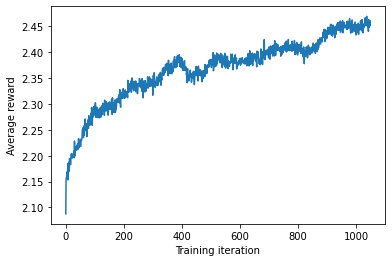

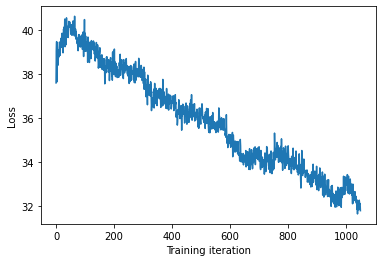

Generating molecules...: 100%|██████████| 200/200 [00:37<00:00,  5.38it/s]


Mean value of predictions: 6.272882321121822
Proportion of valid SMILES: 0.85


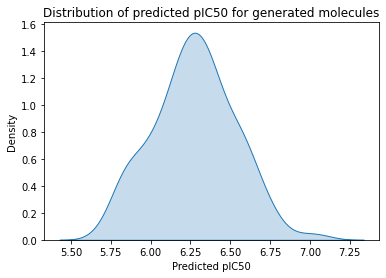

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C1CCC(=O)C(C)(C)C1
C=CC(C)C1CC=C(C)CC1
C=CCCCCCCCCCN(CCCNCCCO)C(=O)Nc1ccc(F)cc1
C=CCNC(=O)c1ccc(OC)cc1
C=CCNCCOc1ccccc1C(C)C


Policy gradient...: 100%|██████████| 15/15 [01:37<00:00,  6.50s/it]


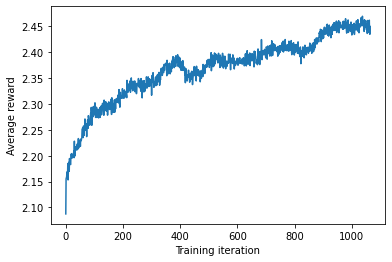

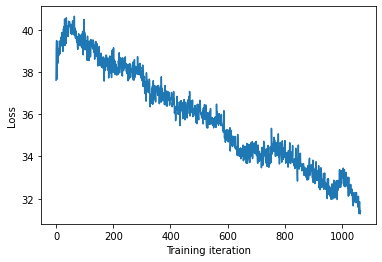

Generating molecules...: 100%|██████████| 200/200 [00:07<00:00, 25.15it/s]


Mean value of predictions: 6.312583669022687
Proportion of valid SMILES: 0.92


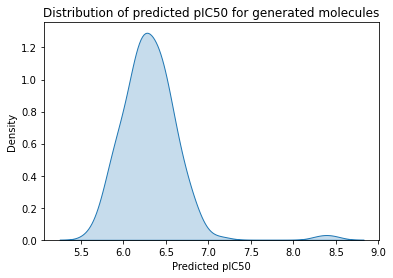

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C1CCC(C2CCCCC2)CC1
C=CCOc1ccc(CNC(N)=O)cc1
CC(=O)NC1CCCCN=N1
CC(=O)NC1CCCOC1CNCCNCC(O)CN1CCCCC1
CC(=O)NCCCCNCCCCCCCCCCCCNCCNC1CCCCCCCCCCC1


Policy gradient...: 100%|██████████| 15/15 [01:37<00:00,  6.51s/it]


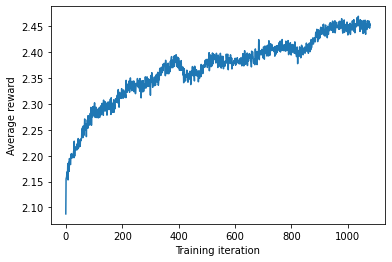

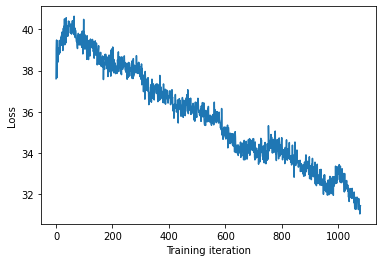

Generating molecules...: 100%|██████████| 200/200 [00:07<00:00, 25.65it/s]


Mean value of predictions: 6.287662683927038
Proportion of valid SMILES: 0.91


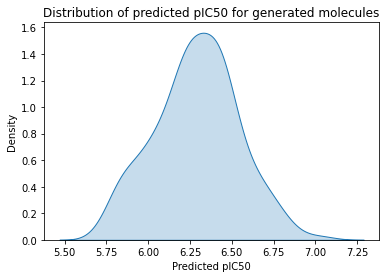

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C)c1ccc(OCc2ccc(OC)c(OC)c2)cc1
C=CC(Oc1ccccc1C)C(=O)Nc1ccccc1
C=CC=CC1CCCCC1
C=CCC(C)C(O)(CCC(=O)NCc1ccccc1C)Cc1ccccc1
C=CCCS(=O)(=O)NCCCCCCCCCCC


Policy gradient...: 100%|██████████| 15/15 [01:36<00:00,  6.46s/it]


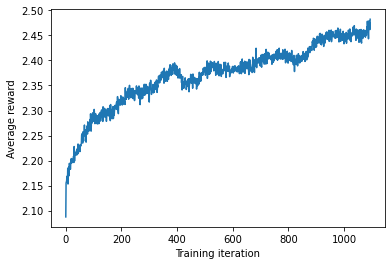

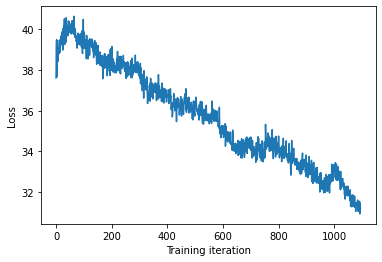

Generating molecules...: 100%|██████████| 200/200 [00:07<00:00, 26.68it/s]


Mean value of predictions: 6.290093715474222
Proportion of valid SMILES: 0.88


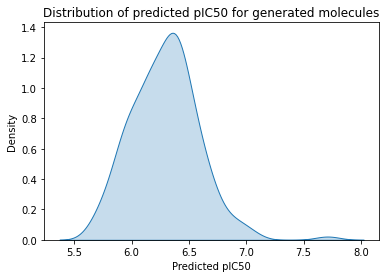

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C
C#CC(=Cc1ccc(C(C)C)cc1)C(=O)OCC
C1CCC(CCN2CCCCC2)CC1
C=CCN(C)C(=O)COC(=O)CC
CC(=O)N1CCN(CCCOc2ccccc2C)CC1


Policy gradient...: 100%|██████████| 15/15 [01:36<00:00,  6.46s/it]


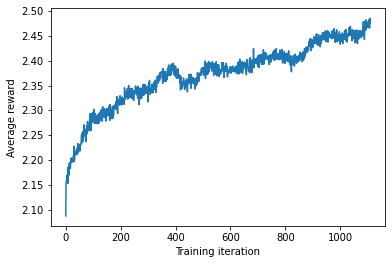

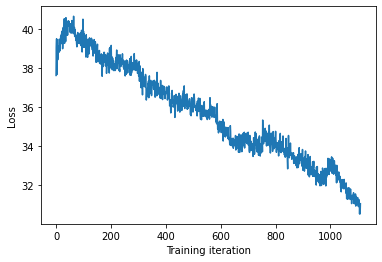

Generating molecules...: 100%|██████████| 200/200 [00:37<00:00,  5.39it/s]


Mean value of predictions: 6.298697172016837
Proportion of valid SMILES: 0.89


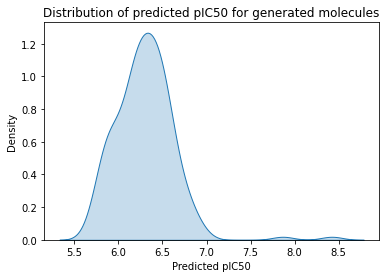

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C#CCOCCOC(=O)CC1CCC(=O)N(CC)n1
C=C(C)Oc1ccc(C)cc1
C=C(C)c1ccc(OCC(O)CNCCCNC(=O)OC)cc1
C=CCOCCCC=NNC(=O)c1ccccc1
C=NNC(=O)Nc1ccc2ccccc2c1


Policy gradient...: 100%|██████████| 15/15 [02:20<00:00,  9.36s/it]


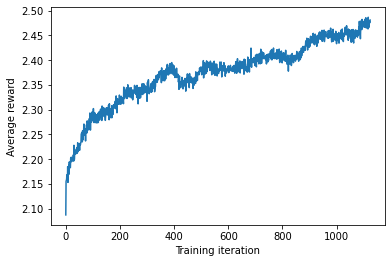

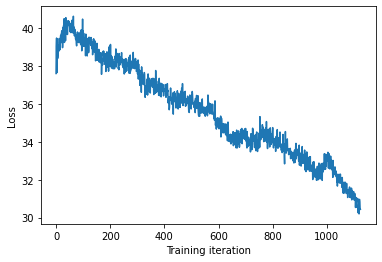

Generating molecules...: 100%|██████████| 200/200 [00:36<00:00,  5.42it/s]


Mean value of predictions: 6.283676385677166
Proportion of valid SMILES: 0.89


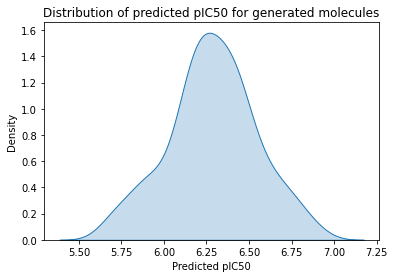

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
Brc1ccccc1
C=C1CC2C=CCCC2(C)C(C(=O)NCCCC2CCCCC2)C1SF
C=CC(C)CCCCc1cc(C)ccc1C
C=CCCCNC1CCCN1C(=O)OC
C=CC[N+](C)(C)CCS


Policy gradient...: 100%|██████████| 15/15 [02:22<00:00,  9.53s/it]


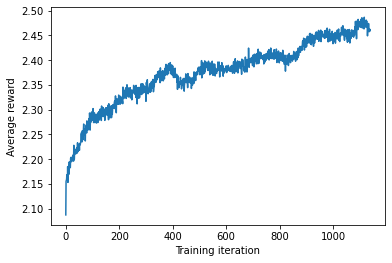

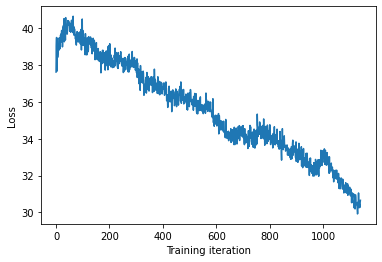

Generating molecules...: 100%|██████████| 200/200 [00:36<00:00,  5.53it/s]


Mean value of predictions: 6.299965098078386
Proportion of valid SMILES: 0.915


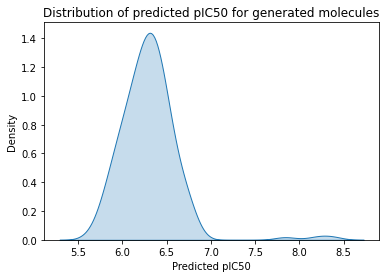

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
Brc1ccccc1
CC(=NNC(=O)c1ccccc1)C(C)C
CC(=O)C1CCCNC1
CC(=O)NCCCNc1ccccc1
CC(C)(C)n1ccnc1SCC(=O)N1CCCCC1


Policy gradient...: 100%|██████████| 15/15 [02:20<00:00,  9.39s/it]


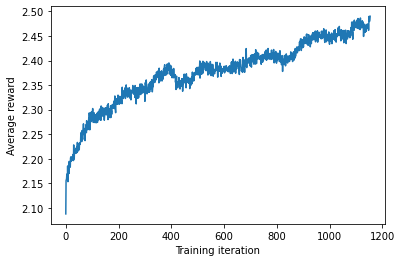

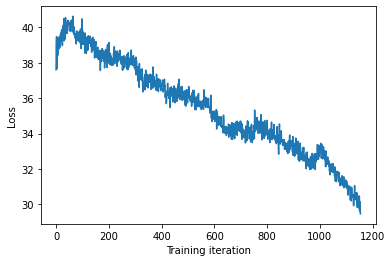

Generating molecules...: 100%|██████████| 200/200 [00:36<00:00,  5.48it/s]


Mean value of predictions: 6.297668817810967
Proportion of valid SMILES: 0.92


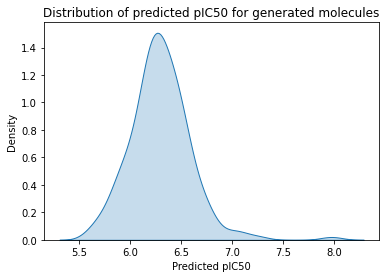

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CC1CC(C)CC(=C)C1C(C)C
C=CCNCCCNCCCCCNCCCCOCCCCCCCCCCCCCCCCCCCC
C=CCOC(=S)NC
CC(=O)N1CCN(C(=O)c2cccnc2)CC1
CC(=O)NC(C)c1ccccc1


Policy gradient...: 100%|██████████| 15/15 [02:20<00:00,  9.37s/it]


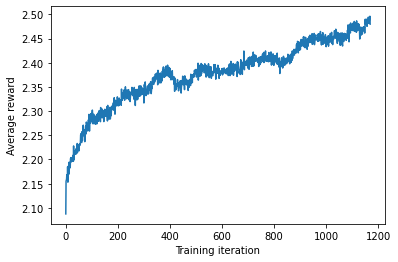

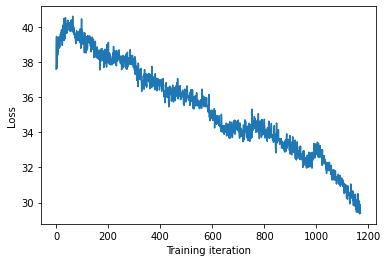

Generating molecules...: 100%|██████████| 200/200 [00:36<00:00,  5.47it/s]


Mean value of predictions: 6.2722981009784275
Proportion of valid SMILES: 0.885


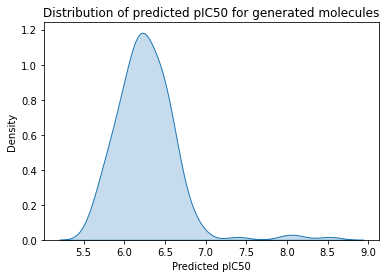

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCCN(CCCC)C(CC)CCCCCCC
C=CCCN1C(=O)N(CCCC)C1=O
C=NNC(=O)NCc1ccccc1
CC(=O)NC(CC(C)C)C1OC(C(O)CBr)C1C(=O)O
CC(=O)NC1C(C)CCC(C)CCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCC(C(C)C)C1O


Policy gradient...: 100%|██████████| 15/15 [02:19<00:00,  9.33s/it]


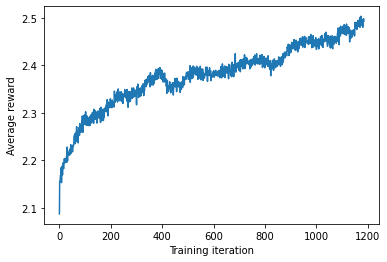

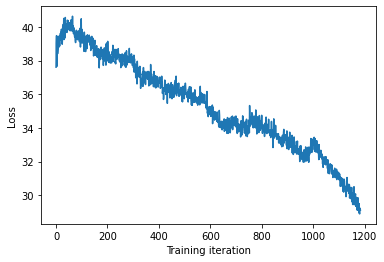

Generating molecules...: 100%|██████████| 200/200 [00:36<00:00,  5.51it/s]


Mean value of predictions: 6.259782675536
Proportion of valid SMILES: 0.9


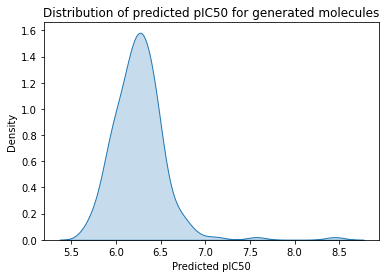

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCN(C)C(=O)N(C)c1ccc(OC)cc1
C=CNN1CCCCC1C
CC(=O)N1CCN(c2ccccc2C)CC1
CC(=O)N1CCc2cc(CNO)cnc21
CC(=O)N1CCn2c(cc3c(SCC(=O)N3)N2C)C1


Policy gradient...: 100%|██████████| 15/15 [02:20<00:00,  9.36s/it]


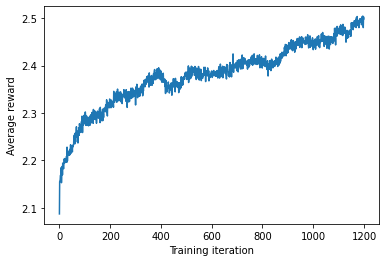

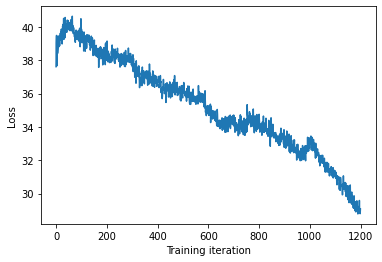

Generating molecules...: 100%|██████████| 200/200 [00:36<00:00,  5.50it/s]


Mean value of predictions: 6.260773575159678
Proportion of valid SMILES: 0.915


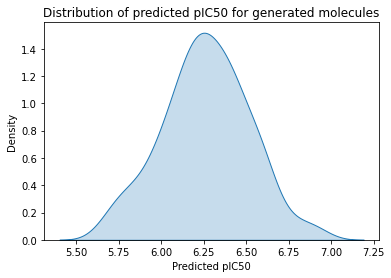

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
Brc1ccccc1CNC1CCCCCC1
C=C(C)OC1OC(=O)C=C2CCCCCC21
CC(=O)N1CCC(=C(C)Nc2nccc(C(F)(F)F)n2)CC1
CC(=O)NC1CCCCC1C
CC(=O)NCC(=O)NCC(=O)O


Policy gradient...: 100%|██████████| 15/15 [02:23<00:00,  9.59s/it]


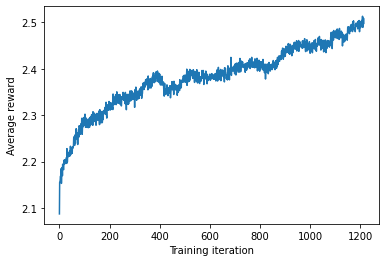

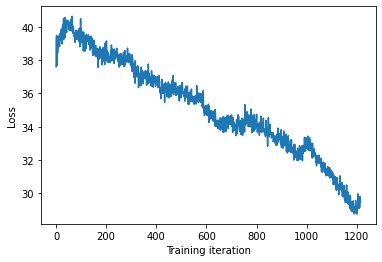

Generating molecules...: 100%|██████████| 200/200 [00:36<00:00,  5.42it/s]


Mean value of predictions: 6.272155769324102
Proportion of valid SMILES: 0.905


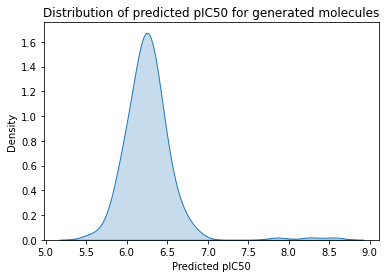

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C(C=CCc1ccc(OC)cc1)C(=O)O
C=CCC1OC(C(C)CCC=C(C)CCCCCCCCC2=CC(=O)C(=O)O2)C(C)CC(C(C)C)CCC1O
C=CCNCCCCNC(CNCCCCNCCN(CC)CC)C(O)CC(=N)N
CC(=O)N(CCCC(C)C(=O)O)c1ccccc1
CC(=O)N1CCN(CCNCC2CCCCCC2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:22<00:00,  9.49s/it]


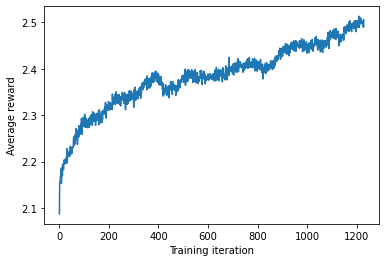

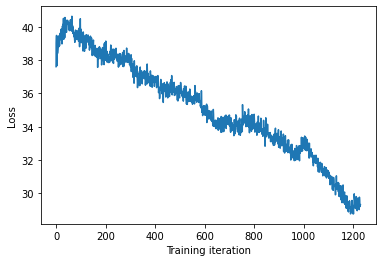

Generating molecules...: 100%|██████████| 200/200 [00:36<00:00,  5.44it/s]


Mean value of predictions: 6.265602400917523
Proportion of valid SMILES: 0.9


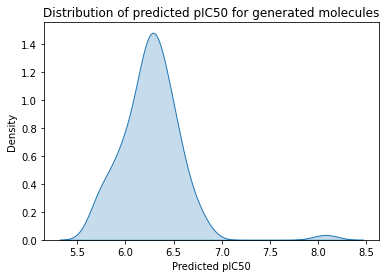

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CC1CC(c2ccccc2)=NN1
C=CCCC1SC(=NCCCC)N(S(=O)(=O)NC)C1=O
CC(=O)NC(C)c1cOC(C)=CC(=O)OC1
CC(=O)NC(C)c1ccccc1
CC(=O)Nc1ccc(C)cc1


Policy gradient...: 100%|██████████| 15/15 [02:19<00:00,  9.32s/it]


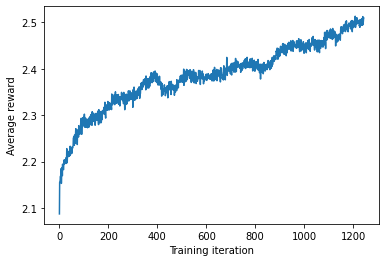

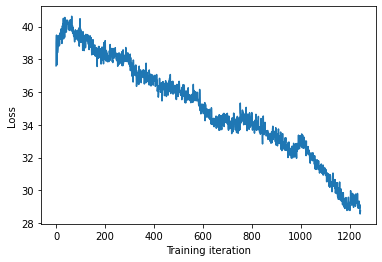

Generating molecules...: 100%|██████████| 200/200 [00:37<00:00,  5.36it/s]


Mean value of predictions: 6.22473444261204
Proportion of valid SMILES: 0.935


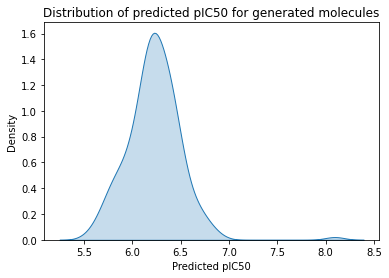

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C
C=CCC(CCCCCCCCCCCCCCCCCCCCCCCCC)CCN=C(N)N
CC(=O)NC(C)=NCCCCCNCCCCNCCCN1CCNCC1C
CC(=O)NC(C)c1ccccc1O
CC(=O)NC(Cc1ccccc1)C(O)CNC(C)C


Policy gradient...: 100%|██████████| 15/15 [02:20<00:00,  9.37s/it]


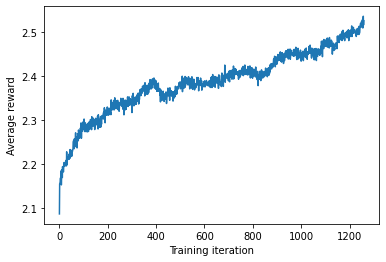

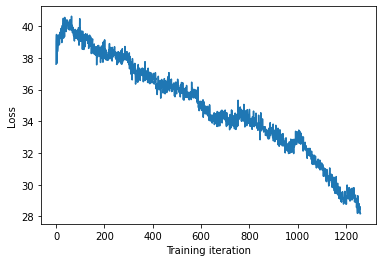

Generating molecules...: 100%|██████████| 200/200 [00:37<00:00,  5.38it/s]


Mean value of predictions: 6.201870390513904
Proportion of valid SMILES: 0.875


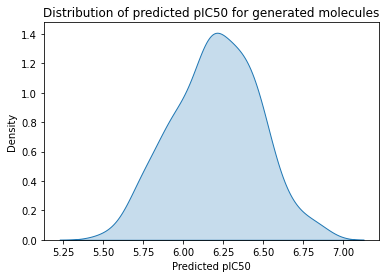

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C
C=CCC(C)NCc1ccccc1
C=CCCCCCCCCc1ccccc1
CC(=NOCC(=O)NCc1ccccc1)N1CCN(C)CC1
CC(=O)C1=CC=CN2CN(C)CC12


Policy gradient...: 100%|██████████| 15/15 [02:19<00:00,  9.33s/it]


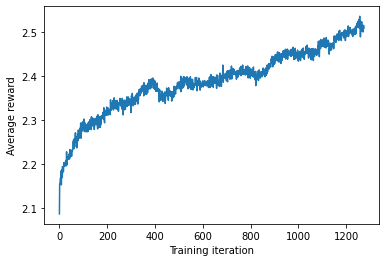

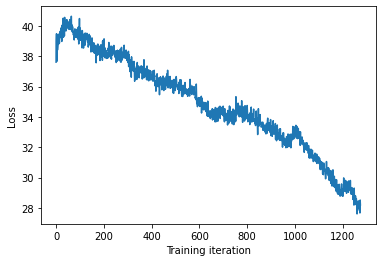

Generating molecules...: 100%|██████████| 200/200 [00:36<00:00,  5.42it/s]


Mean value of predictions: 6.282084764634224
Proportion of valid SMILES: 0.92


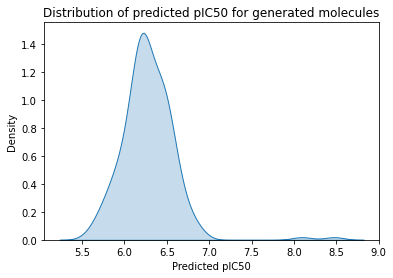

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCNC(=O)C1CCC(NC2=CCCCC2)CC1
CC(=O)NCCCCNC(=O)OCc1ccccc1
CC(=O)NCCCNC(=O)C(CO)NC(=O)CNC(=O)OCc1ccccc1
CC(=O)Nc1ccccc1Cl
CC(C)(C)C(=O)Nc1ccccc1C(C)(C)C


Policy gradient...: 100%|██████████| 15/15 [02:19<00:00,  9.30s/it]


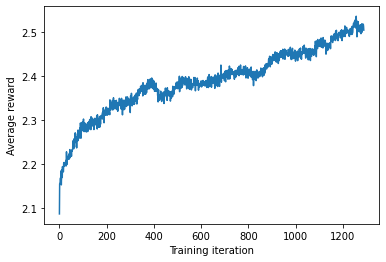

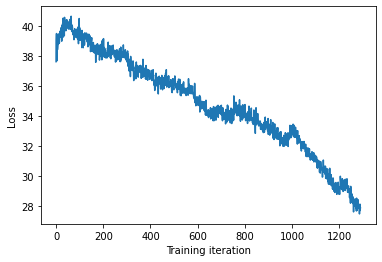

Generating molecules...: 100%|██████████| 200/200 [00:36<00:00,  5.52it/s]


Mean value of predictions: 6.251602607804507
Proportion of valid SMILES: 0.92


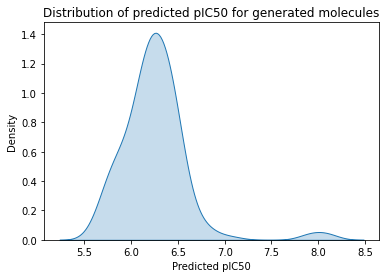

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCN1C(=O)C(C)=C(C(c2ccccc2)c2ccccc2)C1=O
C=CCNCCCNCCCNCCCCCCCNCCCCCNCCCN
CC(=O)N(C)c1ccccc1
CC(=O)N(C)c1ccccc1C
CC(=O)NC(C)Sc1nc(-c2ccccc2)cs1


Policy gradient...: 100%|██████████| 15/15 [02:20<00:00,  9.34s/it]


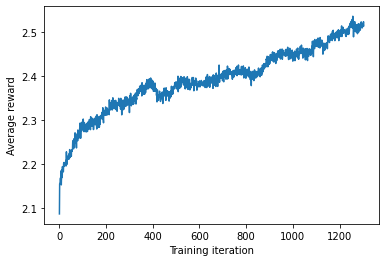

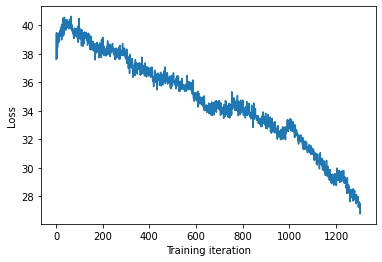

Generating molecules...: 100%|██████████| 200/200 [00:36<00:00,  5.46it/s]


Mean value of predictions: 6.220972902431237
Proportion of valid SMILES: 0.92


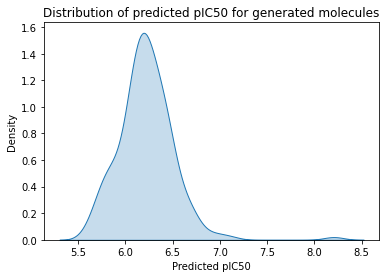

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCN(C)C
C=CCNC(=O)Nc1ccccc1C
C=CCNCCNc1ccccc1OC
CC(=O)OCC1(C(=O)O)CCCCC1
CC(C)C(C)CCCCCCCCCCCCCC(=O)N1CCN(c2ccccc2)CC1


Policy gradient...: 100%|██████████| 15/15 [02:22<00:00,  9.50s/it]


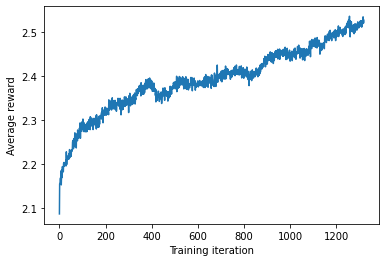

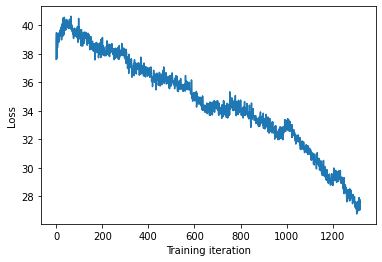

Generating molecules...: 100%|██████████| 200/200 [00:36<00:00,  5.47it/s]


Mean value of predictions: 6.255537184205761
Proportion of valid SMILES: 0.9


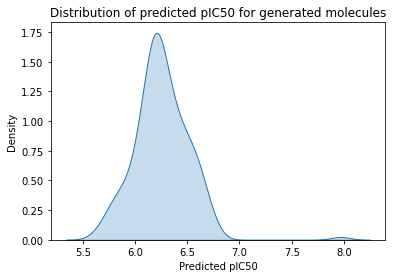

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C1CCCCC1
C=C(O)CSCCCCCCCCCCCCCCCC(=O)NCCCCCN(CC)CC
C=CCC(CCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCC)NC(=O)C(C)CCCCCCCCCCC
CC(=CCCC1(C)CCC(O)C(O)C1)CCCCCCCCC(C)O
CC(=O)NC(C)c1ccccc1


Policy gradient...: 100%|██████████| 15/15 [02:20<00:00,  9.35s/it]


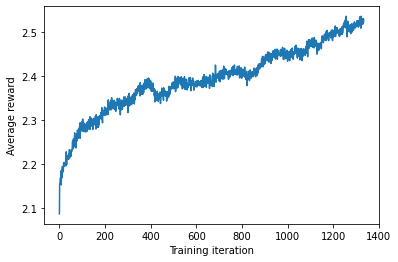

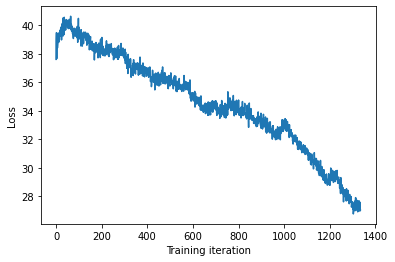

Generating molecules...: 100%|██████████| 200/200 [00:37<00:00,  5.40it/s]


Mean value of predictions: 6.212952848228188
Proportion of valid SMILES: 0.89


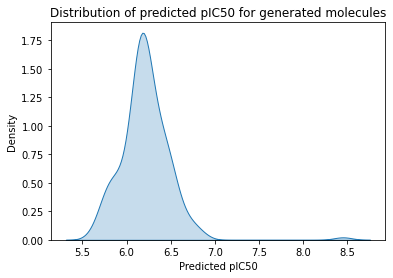

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
CC(=CCc1c(C)cccc1C)CCCCCCCCCCCCCCCCCCCCCCCCO
CC(=O)NC(CC(C)C)C(=O)NC(Cc1ccccc1)C(O)CO
CC(=O)NC(CCCCN)C(=O)NC(CC(C)C)C(=O)NCCCCNCCCCCCc1ccccc1
CC(C)(C)C1CCC(=O)CC1
CC(C)(C)c1ccccc1


Policy gradient...: 100%|██████████| 15/15 [02:20<00:00,  9.40s/it]


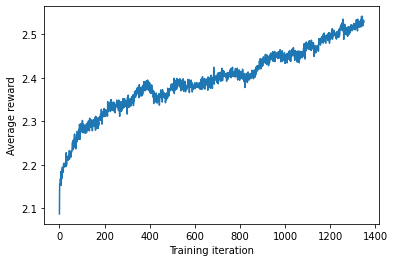

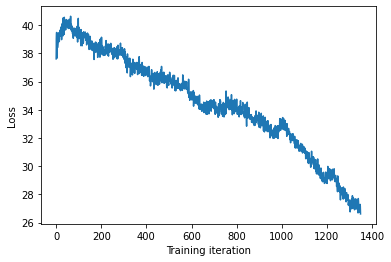

Generating molecules...: 100%|██████████| 200/200 [00:36<00:00,  5.42it/s]


Mean value of predictions: 6.189595359878667
Proportion of valid SMILES: 0.9


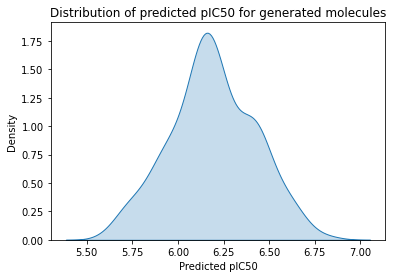

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C(=NCCCNCCCNCCc1ccccc1)c1ccccc1
CC(=O)N1CC(C)NC(C)C1
CC(=O)N1CCCCNC1
CC(C)CC(N)C(=O)OCC(=O)N1CCCC1
CC(C)CCCCCCCNC(C)C


Policy gradient...: 100%|██████████| 15/15 [01:49<00:00,  7.28s/it]


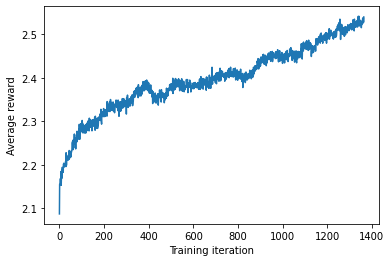

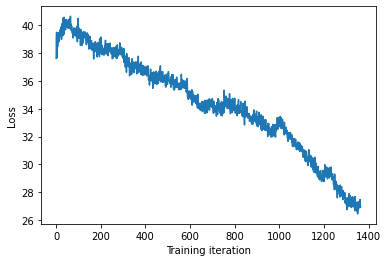

Generating molecules...: 100%|██████████| 200/200 [00:06<00:00, 28.73it/s]


Mean value of predictions: 6.26660712777955
Proportion of valid SMILES: 0.91


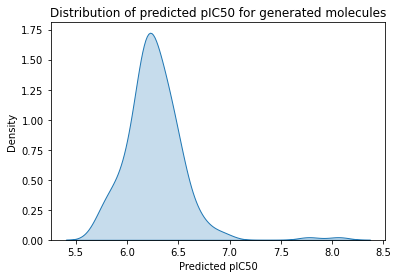

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCCC(N)CCCNC(=N)N
C=CCNCCCCCCCCCCCCCCCCO
CC(=O)N1CCN(C)CC1
CC(=O)Nc1cccc(C)c1
CC(C)CCCCC(NC(=O)C1CCCCC1)C(=O)NCc1ccccc1


Policy gradient...: 100%|██████████| 15/15 [01:36<00:00,  6.46s/it]


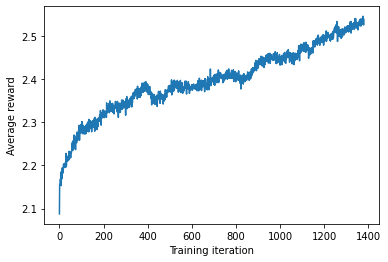

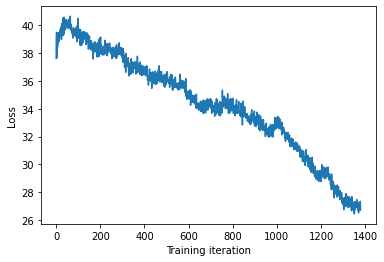

Generating molecules...: 100%|██████████| 200/200 [00:07<00:00, 28.32it/s]


Mean value of predictions: 6.187795137140701
Proportion of valid SMILES: 0.915


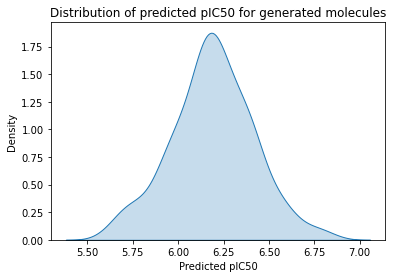

Sample trajectories:
C(=Cc1ccccc1)COc1ccccc1
C=CCC(N)c1ccc(C)cc1
C=CCNCCCCCCNC(=O)NO
CC(=O)CCCCCC=CCCC(O)C=CCCC(C)C
CC(=O)Nc1ccccc1


Policy gradient...: 100%|██████████| 15/15 [01:34<00:00,  6.30s/it]


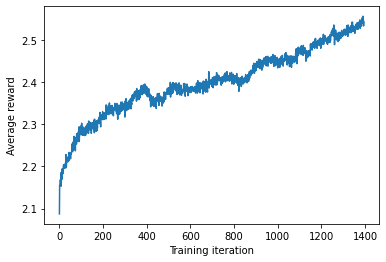

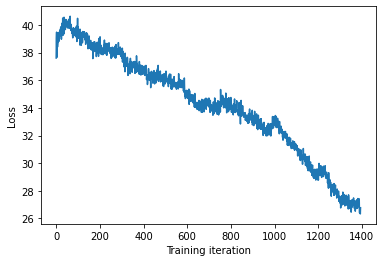

Generating molecules...: 100%|██████████| 200/200 [00:06<00:00, 28.62it/s]


Mean value of predictions: 6.214326052562955
Proportion of valid SMILES: 0.895


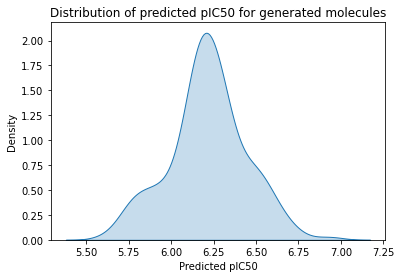

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C1CCCCC1
C=CCN1OCCN1C(=O)NCCCc1ccccc1
CC(=NNc1ccc(N)nc1)Nc1ccccc1C
CC(=O)Nc1ccccc1
CC(=O)OCCOc1ccccc1


Policy gradient...: 100%|██████████| 15/15 [01:34<00:00,  6.33s/it]


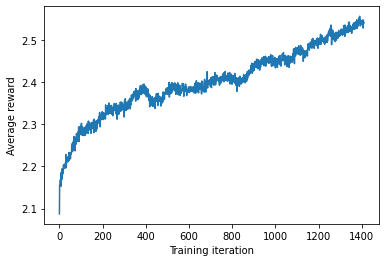

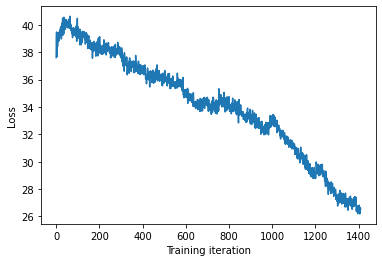

Generating molecules...: 100%|██████████| 200/200 [00:06<00:00, 28.77it/s]


Mean value of predictions: 6.24329031811712
Proportion of valid SMILES: 0.89


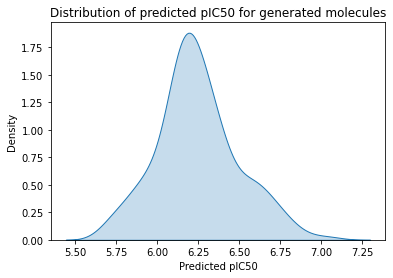

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCO
C=CCN1CCC(O)OC1CCCCOCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCC
CC(=CCc1ccccc1)CC(O)C(O)CC(C)C
CC(C)CC1CCCCC2CCCCC1CCC2
CC(C)CCCCCCCCCCCCCCCCCC(=O)O


Policy gradient...: 100%|██████████| 15/15 [01:33<00:00,  6.24s/it]


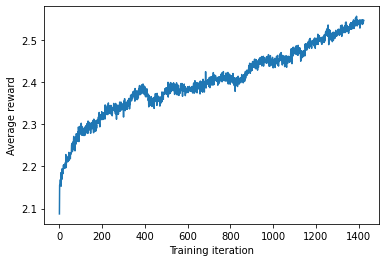

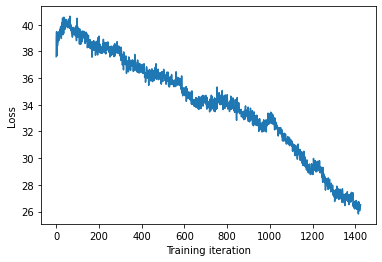

Generating molecules...: 100%|██████████| 200/200 [00:06<00:00, 29.69it/s]


Mean value of predictions: 6.204460335457772
Proportion of valid SMILES: 0.92


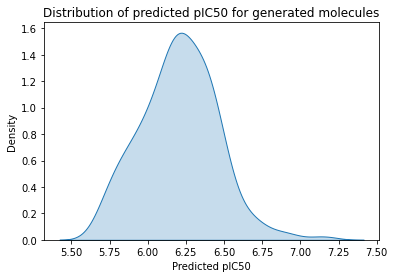

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=C1C(C)CN=CN1c1ccccc1
C=CC(O)c1ccc(OC)cc1
CC(=O)NCCC(=O)O
CC(=O)Nc1ccc(C)cc1
CC(=O)Oc1ccccc1


Policy gradient...: 100%|██████████| 15/15 [01:33<00:00,  6.24s/it]


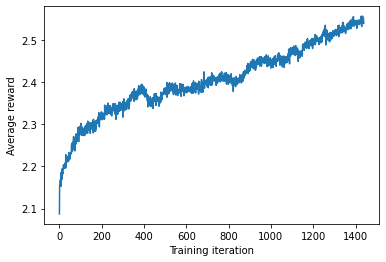

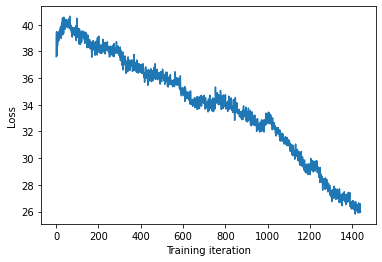

Generating molecules...: 100%|██████████| 200/200 [00:06<00:00, 30.40it/s]


Mean value of predictions: 6.222526862186565
Proportion of valid SMILES: 0.905


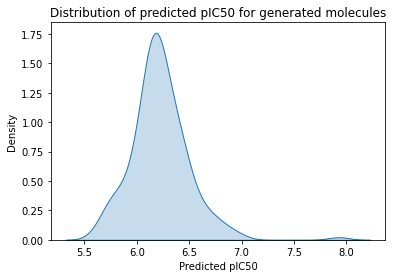

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
Brc1ccccc1
C=C(C)Nc1ccc(C(C)=O)cc1
C=CCO
CC(=O)N1CCCC1
CC(=O)NCc1ccccc1


Policy gradient...: 100%|██████████| 15/15 [01:33<00:00,  6.25s/it]


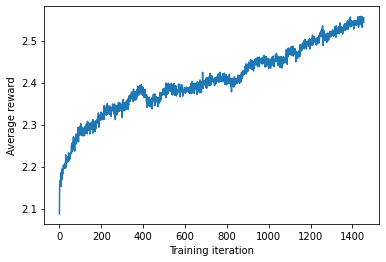

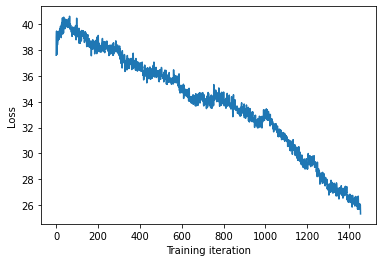

Generating molecules...: 100%|██████████| 200/200 [00:06<00:00, 31.25it/s]


Mean value of predictions: 6.203288245309434
Proportion of valid SMILES: 0.885


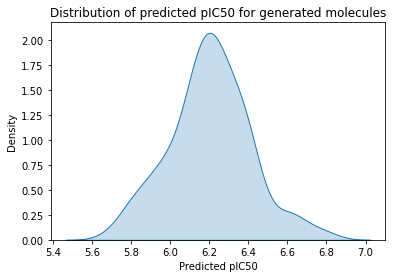

Sample trajectories:
Brc1ccccc1
C=C(CCCCC(=O)Nc1ccccc1)Nc1cccc(OC)c1
C=CCCCCCCCNCCCNCCCC
C=CCNC(=O)NC1CCCCC1N
C=CCNC(=O)c1ccccc1


Policy gradient...: 100%|██████████| 15/15 [01:34<00:00,  6.30s/it]


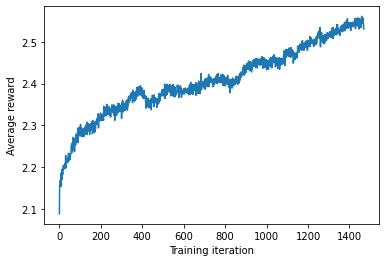

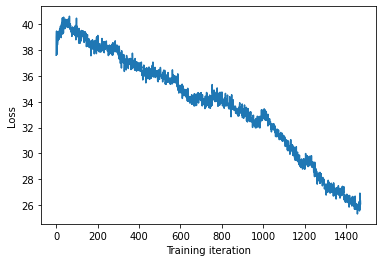

Generating molecules...: 100%|██████████| 200/200 [00:06<00:00, 28.81it/s]


Mean value of predictions: 6.247191341798945
Proportion of valid SMILES: 0.895


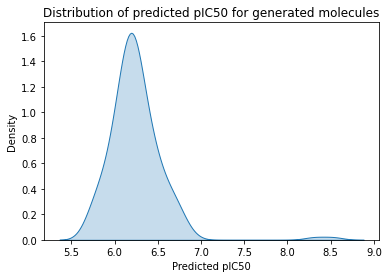

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)Nc1ccccc1
CC(C)=CCCC(=O)NCCCCCCNCCCCCCCCCC=CCCCCCCCCCCCCCCNCCCC(=O)O
CC(C)CNCCN(C)C
CC(C)NCCC(=O)NC(CN(C)C)C(C)C
CC(CO)NCc1ccc(C(C)C)cc1


Policy gradient...: 100%|██████████| 15/15 [01:45<00:00,  7.00s/it]


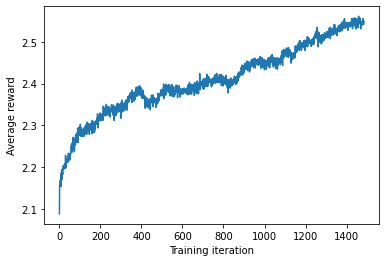

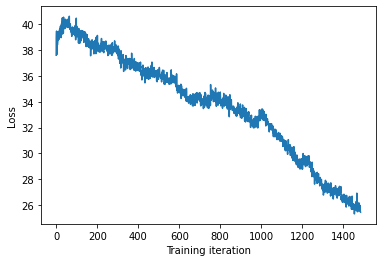

Generating molecules...: 100%|██████████| 200/200 [00:36<00:00,  5.47it/s]


Mean value of predictions: 6.235972440437529
Proportion of valid SMILES: 0.885


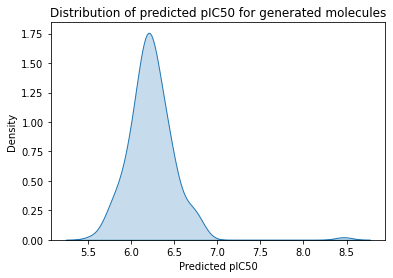

Policy gradient...:   0%|          | 0/15 [00:00<?, ?it/s]

Sample trajectories:
C=CNCC(NCCCCc1ccccc1)C(=O)NCC(F)(F)F
CC(=O)N(CC(O)Cc1ccccc1)Cn1cnc2ccccc21
CC(=O)NC1CCCCC1
CC(=O)NCCCC(N)C=CCCCCCCCCCCCCCCCCCCCCCCNCc1ccccc1
CC(=O)NCCCC1CCCO1


Policy gradient...: 100%|██████████| 15/15 [02:20<00:00,  9.35s/it]


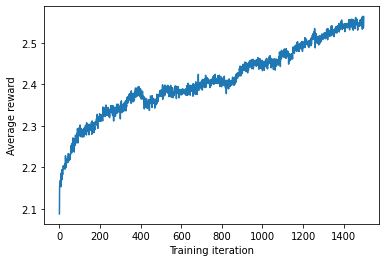

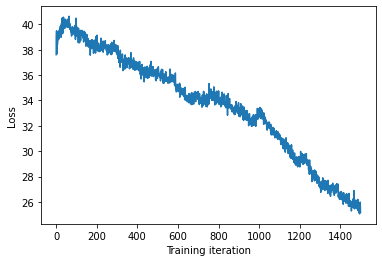

Generating molecules...: 100%|██████████| 200/200 [00:36<00:00,  5.52it/s]


Mean value of predictions: 6.21531094163672
Proportion of valid SMILES: 0.9


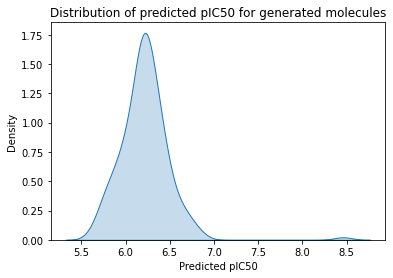

Sample trajectories:
C
CC(=O)N1CCC(CCc2ccccc2)C(C)C1
CC(=O)N1CCN(c2ccccc2)CC1
CC(=O)NC(Cc1ccccc1)CC(C)C
CC(C)CCCC[n+]1ccccc1


In [39]:
for i in range(n_iterations):
    for j in trange(n_policy, desc='Policy gradient...'):
        cur_reward, cur_loss = RL_min.policy_gradient(gen_data, get_features=get_fp)
        rewards_min.append(simple_moving_average(rewards_min, cur_reward)) 
        rl_losses_min.append(simple_moving_average(rl_losses_min, cur_loss))
    
    plt.plot(rewards_min)
    plt.xlabel('Training iteration')
    plt.ylabel('Average reward')
    plt.show()
    
    plt.plot(rl_losses_min)
    plt.xlabel('Training iteration')
    plt.ylabel('Loss')
    plt.show()
        
    smiles_cur, prediction_cur = estimate_and_update(RL_min.generator, 
                                                     my_predictor, 
                                                     n_to_generate)
    print('Sample trajectories:')
    for sm in smiles_cur[:5]:
        print(sm)

Generating molecules...: 100%|██████████| 10000/10000 [29:40<00:00,  5.62it/s]


Mean value of predictions: 6.244141000496269
Proportion of valid SMILES: 0.6783


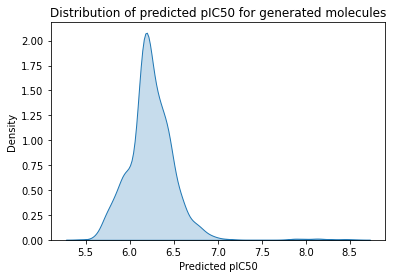

In [41]:
smiles_biased_min, prediction_biased_min = estimate_and_update(RL_min.generator, 
                                                           my_predictor,
                                                           n_to_generate=10000)

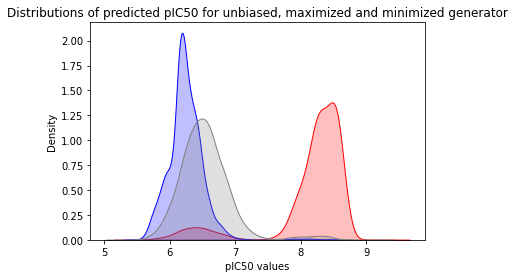

In [42]:
sns.kdeplot(prediction_biased_max, label='Maximized', shade=True, color='red')
sns.kdeplot(prediction_biased_min, label='Minimized', shade=True, color='blue')
sns.kdeplot(prediction_unbiased, label='Unbiased', shade=True, color='grey')

plt.xlabel('pIC50 values')
plt.title('Distributions of predicted pIC50 for unbiased,' + 
          ' maximized and minimized generator')
plt.show()

#### Drawing random molecules

Now we will draw some random compounds from the biased library:

In [43]:
from rdkit.Chem.Draw import DrawingOptions
from rdkit.Chem import Draw

DrawingOptions.atomLabelFontSize = 50
DrawingOptions.dotsPerAngstrom = 100
DrawingOptions.bondLineWidth = 3

##### Molecules with maximized pIC50

In [44]:
generated_mols_max = [Chem.MolFromSmiles(sm, sanitize=True) for sm in smiles_biased_max]
sanitized_gen_mols_max = [generated_mols_max[i] 
                          for i in np.where(np.array(generated_mols_max) != None)[0]]

In [45]:
n_to_draw = 20
ind = np.random.randint(0, len(sanitized_gen_mols_max), n_to_draw)
mols_to_draw_max = [sanitized_gen_mols_max[i] for i in ind]
legends = ['pIC50 = ' + str(prediction_biased_max[i]) for i in ind]

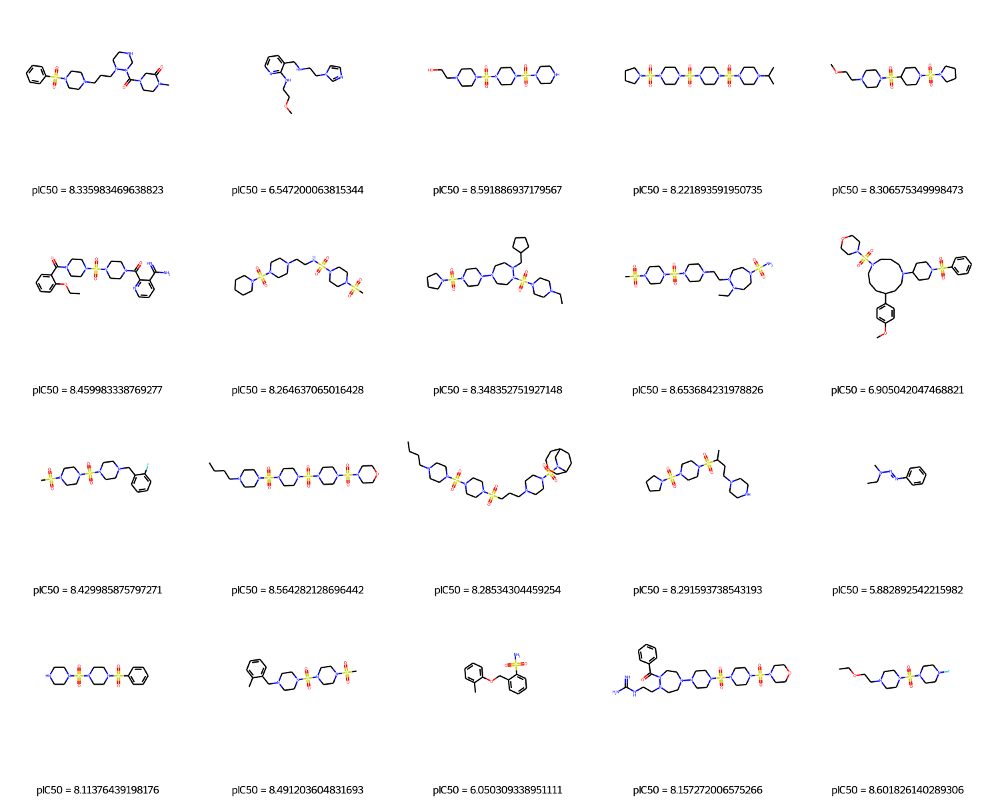

In [46]:
Draw.MolsToGridImage(mols_to_draw_max, molsPerRow=5, 
                     subImgSize=(300,300), legends=legends)

##### Molecules with minimized pIC50

In [47]:
generated_mols_min = [Chem.MolFromSmiles(sm, sanitize=True) for sm in smiles_biased_min]
sanitized_gen_mols_min = [generated_mols_min[i] 
                          for i in np.where(np.array(generated_mols_min) != None)[0]]

In [48]:
n_to_draw = 20
ind = np.random.randint(0, len(sanitized_gen_mols_min), n_to_draw)
mols_to_draw_min = [sanitized_gen_mols_min[i] for i in ind]
legends = ['pIC50 = ' + str(prediction_biased_min[i]) for i in ind]

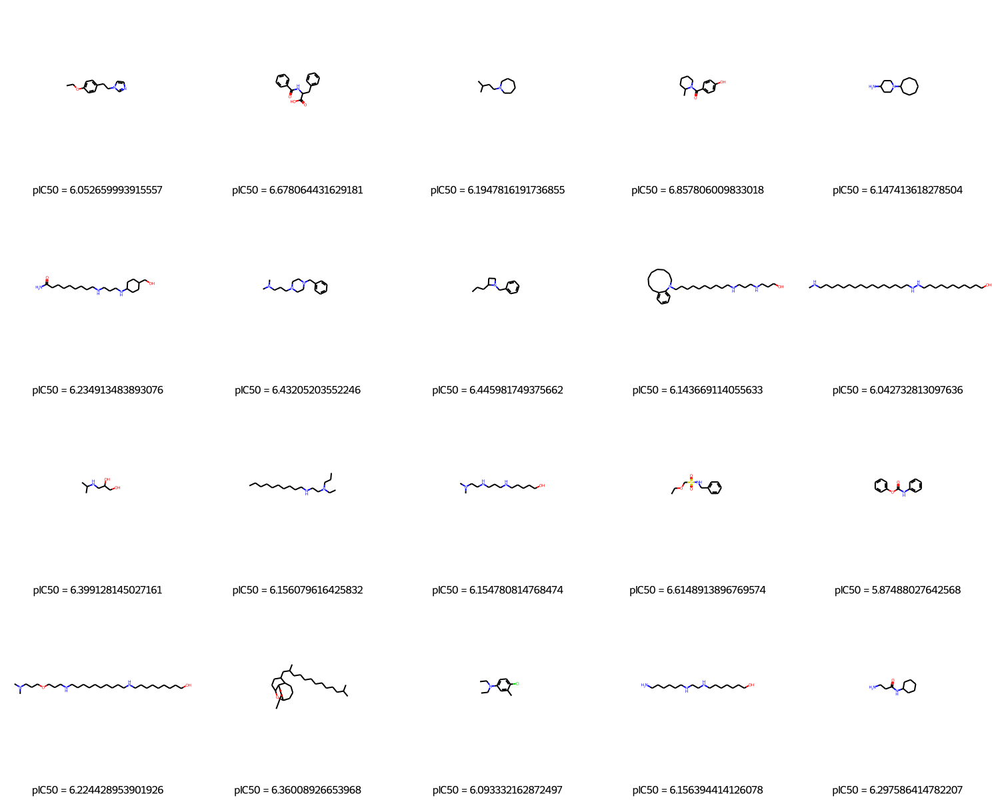

In [49]:
Draw.MolsToGridImage(mols_to_draw_min, molsPerRow=5, 
                     subImgSize=(300,300), legends=legends)

### Predicting logP for JAK2 with RNNs and SMILES strings

This notebook demonstrates how to build predictive recurrent neural network for SMILES strings. We will build classification model for logP with OpenChem Toolkit (https://github.com/Mariewelt/OpenChem)

In [1]:
%cd ReLeaSE

# Cloning OpenChem. Comment this line if you already cloned the repository
!git clone https://github.com/Mariewelt/OpenChem.git

/content/ReLeaSE


In [2]:
%env CUDA_VISIBLE_DEVICES=0

env: CUDA_VISIBLE_DEVICES=0


#### Imports

In [3]:
import sys
import os

In [4]:
sys.path.append('ReLeaSE/OpenChem')

In [7]:
from openchem.models.Smiles2Label import Smiles2Label
from openchem.modules.encoders.rnn_encoder import RNNEncoder
from openchem.modules.mlp.openchem_mlp import OpenChemMLP
from openchem.data.smiles_data_layer import SmilesDataset
from openchem.data.utils import save_smiles_property_file
from openchem.data.utils import create_loader
from openchem.models.openchem_model import build_training, fit, evaluate

In [8]:
import torch.nn as nn
from torch.optim import Adam
from torch.optim.lr_scheduler import ExponentialLR
import torch.nn.functional as F

In [9]:
from sklearn.metrics import r2_score, mean_squared_error
import pandas as pd
import copy
import pickle

#### Reading data

In [10]:
from openchem.data.utils import read_smiles_property_file
import numpy as np

data = read_smiles_property_file('./data/logP_labels.csv', 
                                 cols_to_read=[1, 2], keep_header=False)
smiles = data[0]
labels = list(map(float, data[1]))

(array([1.300e+01, 1.420e+02, 9.030e+02, 3.624e+03, 5.417e+03, 2.995e+03,
        7.490e+02, 2.700e+02, 5.800e+01, 5.000e+00]),
 array([-5.4  , -3.731, -2.062, -0.393,  1.276,  2.945,  4.614,  6.283,
         7.952,  9.621, 11.29 ]),
 <a list of 10 Patch objects>)

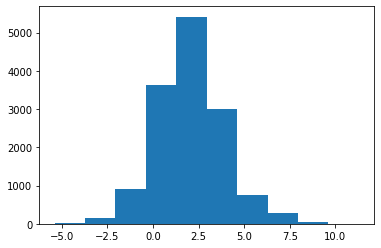

In [11]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.hist(labels)

In [12]:
from openchem.data.utils import get_tokens

tokens, _, _ = get_tokens(smiles)
tokens = ['<', '>', '#', '%', ')', '(', '+', '-', '/', '.', '1', '0', '3', '2', '5', '4', '7',
          '6', '9', '8', '=', 'A', '@', 'C', 'B', 'F', 'I', 'H', 'O', 'N', 'P', 'S', '[', ']',
          '\\', 'c', 'e', 'i', 'l', 'o', 'n', 'p', 's', 'r', '\n']
tokens = ''.join(tokens) + ' '

#### Model architecture

Here we define the architecture of our Recurrent Neural Network (RNN). This model solve the regression problem, i.e. predicts values of logP directly from SMILES (no need to calculated descriptors).

We will use 2 unidirectional LSTM layers with hidden size of 128 each. Embedding size is 128. Dense layers is a Multi-layer Perceptron with with hidden size of 128 and ReLU activation function. The loss function is simple MSE (mean squared error).

We will use OpenChem toolkit to train the model. For more details on OpenChem visit: https://mariewelt.github.io/OpenChem/

The architecture of the network is shown below:

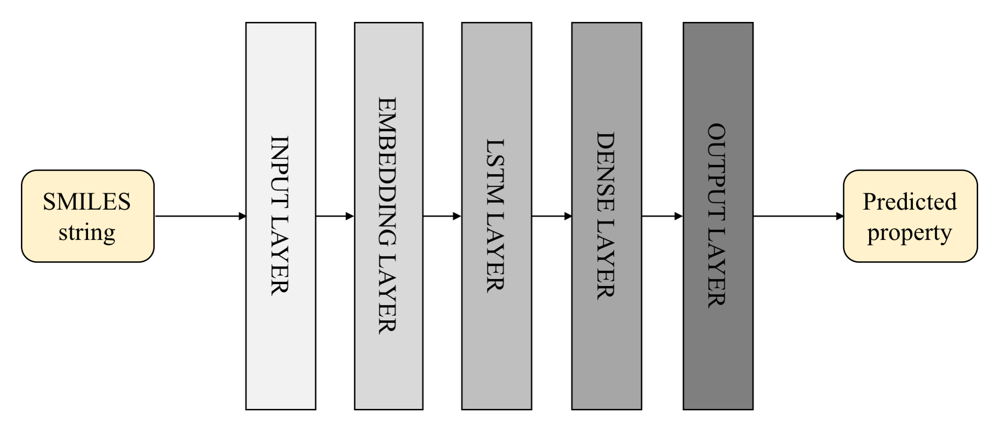

In [13]:
import torch

from openchem.utils.utils import identity
from openchem.modules.embeddings.basic_embedding import Embedding

model_object = Smiles2Label

n_hidden = 128
batch_size = 128
num_epochs = 26
lr = 0.005

model_params = {
    'use_cuda': True,
    'random_seed': 42,
    'world_size': 1,
    'task': 'regression',
    'data_layer': SmilesDataset,
    'use_clip_grad': False,
    'batch_size': batch_size,
    'num_epochs': num_epochs,
    'logdir': './checkpoints/logP/',
    'print_every': 1,
    'save_every': 5,
    'train_data_layer': None,
    'val_data_layer': None,
    'eval_metrics': r2_score,
    'criterion': nn.MSELoss(),
    'optimizer': Adam,
    'optimizer_params': {
        'lr': lr,
    },
    'lr_scheduler': ExponentialLR,
    'lr_scheduler_params': {
        'gamma': 0.98
    },
    'embedding': Embedding,
    'embedding_params': {
        'num_embeddings': len(tokens),
        'embedding_dim': n_hidden,
        'padding_idx': tokens.index(' ')
    },
    'encoder': RNNEncoder,
    'encoder_params': {
        'input_size': n_hidden,
        'layer': "LSTM",
        'encoder_dim': n_hidden,
        'n_layers': 2,
        'dropout': 0.8,
        'is_bidirectional': False
    },
    'mlp': OpenChemMLP,
    'mlp_params': {
        'input_size': n_hidden,
        'n_layers': 2,
        'hidden_size': [n_hidden, 1],
        'activation': [F.relu, identity],
        'dropout': 0.0
    }
}

In [14]:
pickle.dump(model_params, open('./checkpoints/logP/model_parameters.pkl', 'wb'))

In [15]:
try:
    os.stat(model_params['logdir'])
except:
    os.mkdir(model_params['logdir'])

In [16]:
log_dir = './checkpoints/logP/'

In [17]:
tmp_data_dir = './data/tmp/'

try:
    os.stat(tmp_data_dir)
except:
    os.mkdir(tmp_data_dir)

#### Initializing data splitter for cross validation

In [18]:
from sklearn.model_selection import KFold, train_test_split

cross_validation_split = KFold(n_splits=5, shuffle=True)

In [19]:
data = list(cross_validation_split.split(smiles, labels))

#### Training cross-validated models

In [ ]:
import os

i = 0
models = []
results = []

for split in data:
    print('Cross validation, fold number ' + str(i) + ' in progress...')
    train, test = split

    X_train = smiles[train]
    y_train = labels[train].reshape(-1)

    X_test = smiles[test]
    y_test = labels[test].reshape(-1)
    
    save_smiles_property_file(tmp_data_dir + str(i) + '_train.smi', 
                              X_train, y_train.reshape(-1, 1))
    save_smiles_property_file(tmp_data_dir + str(i) + '_test.smi', 
                              X_test, y_test.reshape(-1, 1))

    train_dataset = SmilesDataset(tmp_data_dir + str(i) + '_train.smi',
                           delimiter=',', cols_to_read=[0, 1], tokens=tokens,
                                 flip=False,)
    train_dataset.target = train_dataset.target
    test_dataset = SmilesDataset(tmp_data_dir + str(i) + '_test.smi',
                       delimiter=',', cols_to_read=[0, 1], tokens=tokens,
                                flip=False)
    test_dataset.target = test_dataset.target

    model_params['train_data_layer'] = train_dataset
    model_params['val_data_layer'] = test_dataset
    model_params['logdir'] = log_dir + 'fold_' + str(i)  

    ckpt_dir = model_params['logdir'] + '/checkpoint/'

    try:
        os.stat(ckpt_dir)
    except:
        os.mkdir(model_params['logdir'])
        os.mkdir(ckpt_dir)

    train_loader = create_loader(train_dataset,
                             batch_size=model_params['batch_size'],
                             shuffle=True,
                             num_workers=4,
                             pin_memory=True,
                             sampler=None)
    
    val_loader = create_loader(test_dataset,
                           batch_size=model_params['batch_size'],
                           shuffle=False,
                           num_workers=1,
                           pin_memory=True)
    
    models.append(model_object(params=model_params).cuda())
    criterion, optimizer, lr_scheduler = build_training(models[i], model_params)
    results.append(fit(models[i], lr_scheduler, train_loader, optimizer, criterion,
        model_params, eval=True, val_loader=val_loader))
    
    i = i+1